# __Part A: Generative Adversarial Networks__

<a class="anchor" id="1"></a>
## <font color='#71a1e3'> __Problem Understanding__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">


### __What is GAN?__

Gan represnts Generative Adversarial Networks which is all about creating here. Generally it is harder compared to other deep learning fields.

The main focus of GAN is to generate data be it images or videos or music from scratch and generally what does GAN consist of?

GAN are algorithic architectures that uses 2 neural networks, putting one against the other. This is to generate new, synthetic instances of data that can be pass as real data.

Generally, widely use in image generation, voice generation etc. 

GAN also work with competition of two different parts

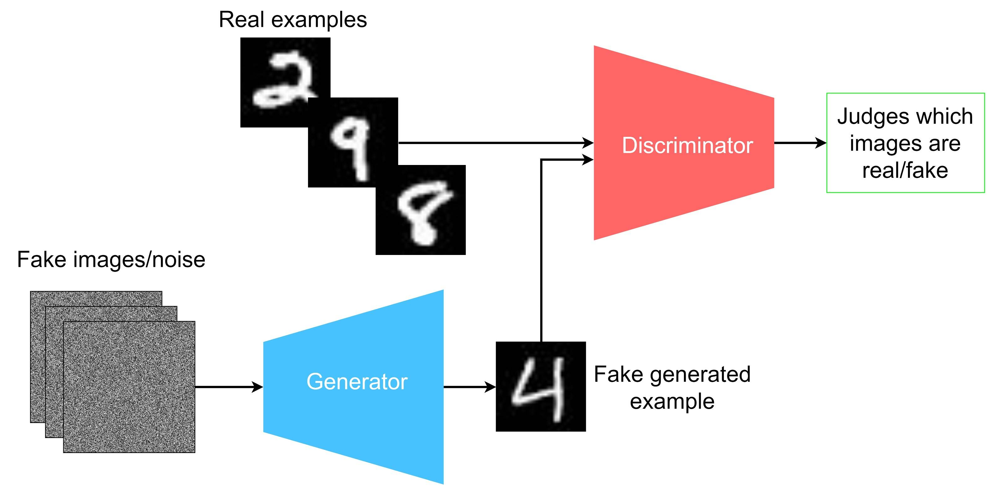

__Generator__
1. For this, you can input random images, known as random noise. This random images can be anything.
2. Through the generator, it will generate a sample that hopefully ends up like the real dataset if the generator and discrimintor and discriminator both are trained good enough
3. Output is sometimes refered to as latent space or a latent vector

What can we do to optimise?
1. Output must be pass through the generator through the discriminator, which then backpropagate and calculate the erros both the generator and discriminator 
2. Gan is also a form of decovolution and parameters, such as stride, padding, kernel size

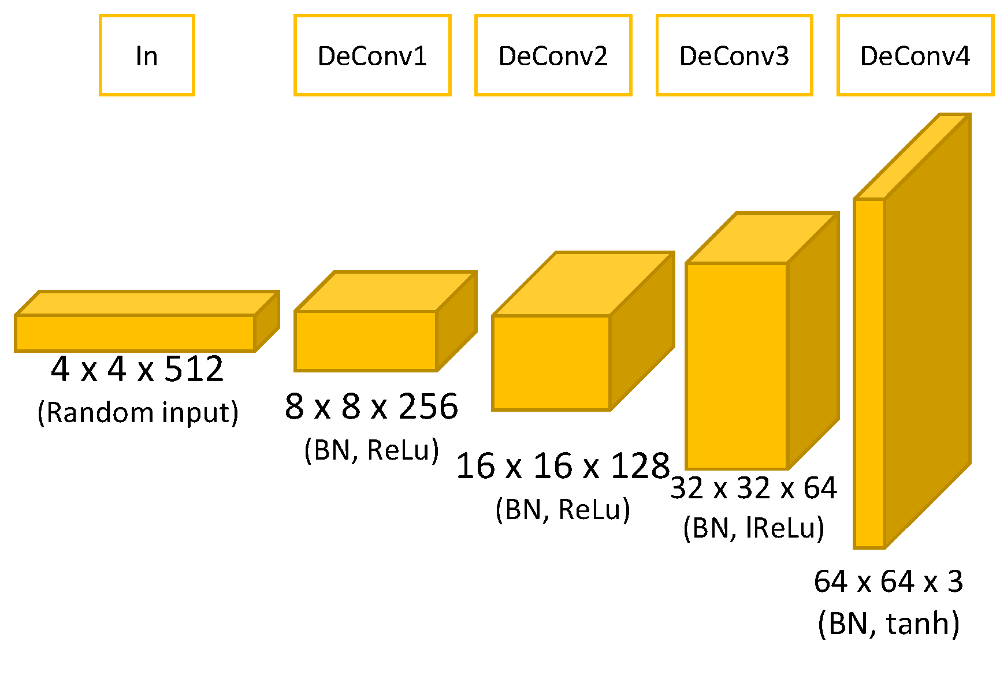

__Discriminator__ 
1. For this, input the real images from actual data tha needs to be generated like CIFAR1
2. Also, you input the output of generator into the discriminator
3. Convolutional layer of discrimnator is the normal convolution we are used to.
4. This are downscaled to the input that is suitable for classification. 

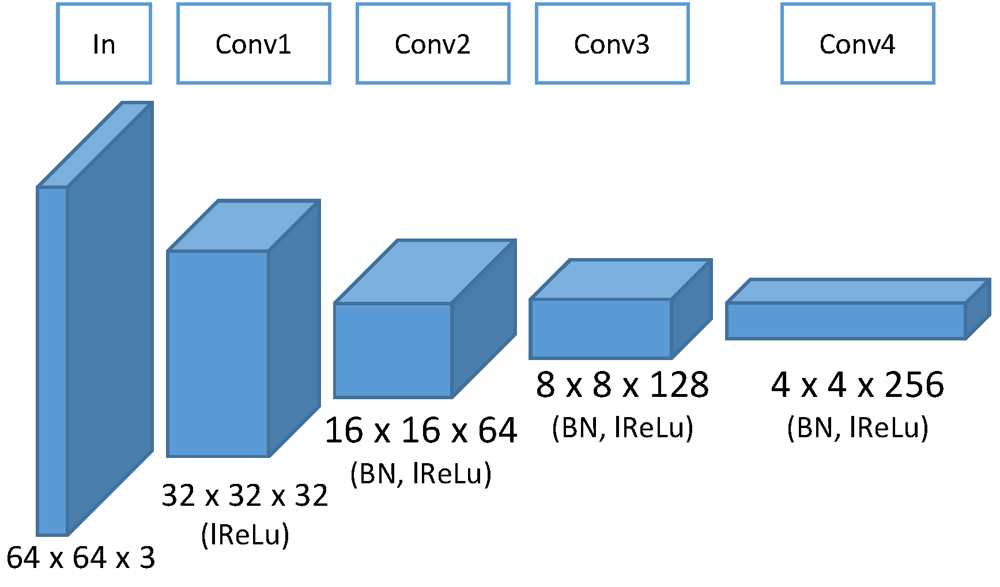


__How can we optimise both as a whole?__
After data is passed through both generator and discriminator, optimisation with backpropagation begins, the goal is to kepp improving at a level pace for both models to be good at its role, equilibrium point is exactly when the discriminator is leaning 50% to both sides, meaning that both images could either be real or fake, where the generator model tries to minimize the probability that the discriminator will predict the generator's output as fake. On the other side, the discriminator tries to maximize the probability that it will correctly classify both real and fake image

<a class="anchor" id="1"></a>
## <font color='#71a1e3'> __Import Libraries__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">


In [ ]:
!pip install  -q keras-tuner pandas matplotlib seaborn scikit-learn tqdm tensorflow_addons scikit-image

### Other Imports

In [2]:
import numpy as np
import pandas as pd

import seaborn as sns
from matplotlib import pyplot as plt

from sklearn.metrics import classification_report,accuracy_score, confusion_matrix
from sklearn.decomposition import PCA

from sklearn.preprocessing import Normalizer
from sklearn.metrics import classification_report, accuracy_score

import os, time, math, datetime, warnings, pytz, glob
from IPython.display import display
from functools import reduce
import absl.logging
from tqdm import tqdm
import logging
from scipy.linalg import sqrtm
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy.linalg import sqrtm
from skimage.transform import resize
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

absl.logging.set_verbosity(absl.logging.ERROR)
logging.getLogger('tensorflow').disabled = True
warnings.filterwarnings('ignore')

### Tensorflow Import

In [3]:
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.utils import Sequence, to_categorical
from tensorflow import expand_dims
from tensorflow.keras import Sequential
from tensorflow.keras import layers as L
from tensorflow.keras import backend as K
from tensorflow.image import random_flip_left_right, random_crop, resize_with_crop_or_pad
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import (Embedding, Dense, Input, InputLayer, Normalization, Flatten,BatchNormalization,
    Dropout,Conv2D, GlobalAveragePooling2D, MaxPooling2D, ReLU, Layer,Activation, Multiply, AveragePooling2D,
    Add, RandomRotation,Resizing, Rescaling, Reshape, Concatenate, concatenate, Lambda,LeakyReLU)
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler, ReduceLROnPlateau, TerminateOnNaN, TensorBoard, CSVLogger, Callback
from tensorflow.keras.backend import clear_session
from tensorflow.keras.optimizers import RMSprop, SGD, Adam, Adagrad, Adamax
from tensorflow.keras.regularizers import l2, L2
from tensorflow.keras.optimizers.schedules import *
from tensorflow.keras.metrics import FalseNegatives, categorical_crossentropy, sparse_categorical_crossentropy,BinaryCrossentropy
from tensorflow.keras.regularizers import l2
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.image import *
from tensorflow_addons.optimizers import SWA
from tensorflow.keras.layers import Dense, Reshape, LeakyReLU, UpSampling2D, Conv2D
from tensorflow.keras.optimizers import Adam
from sklearn.metrics.pairwise import pairwise_kernels
from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import PReLU,Dense, GlobalAveragePooling2D, Input, Conv2DTranspose
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, LeakyReLU, GlobalAveragePooling2D, Dense, Concatenate
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.initializers import RandomNormal
from tensorflow_addons.layers import SpectralNormalization
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input

from tensorflow.keras.datasets import cifar10
from kerastuner.tuners import Hyperband
from kerastuner import HyperModel
# Setting a seaborn style
sns.set(style="whitegrid")







### Set the seed of this notebook

In [4]:
seed = 32
tf.random.set_seed(seed)
np.random.seed(seed)

<a class="anchor" id="3"></a>
## <font color='#71a1e3'>__Check for GPU__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here is check the available GPUs and set the memory growth

In [5]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)

        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(f"{len(gpus)} Physical GPUs, {len(logical_gpus)} Logical GPU")
    except RuntimeError as e:
        print(e)

1 Physical GPUs, 1 Logical GPU


In [6]:
!nvidia-smi

Wed Jan 31 04:25:47 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.113.01             Driver Version: 535.113.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4090        On  | 00000000:0A:00.0 Off |                  Off |
|  0%   55C    P2              37W / 450W |    558MiB / 24564MiB |      9%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

<a class="anchor" id="3"></a>
## <font color='#71a1e3'>__Import Dataset__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">


In [7]:
data = tf.keras.datasets.cifar10.load_data()
(x_train, y_train) , (x_test, y_test) = data

170498071/170498071 [==============================] - 173s 1us/step


In [8]:
y_train = to_categorical(y_train)

In [9]:
x_train.shape

(50000, 32, 32, 3)

### Set the labels for the Classes

This is so that we are able to use it for EDA and model training later on

In [10]:
cifarLab = ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]
class_labels = {idx: label for idx, label in enumerate(cifarLab)}
print(class_labels)

{0: 'airplane', 1: 'automobile', 2: 'bird', 3: 'cat', 4: 'deer', 5: 'dog', 6: 'frog', 7: 'horse', 8: 'ship', 9: 'truck'}


<a class="anchor" id="3"></a>
## <font color='#71a1e3'>__Feature Engineering__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">


Below is the idea of feature engineering

1. **Convert Data Type**:
    ```python
    x_train = x_train.astype('float32')
    ```
    This line converts the data type of `x_train` elements to `float32`. It's a standard practice to use floating-point numbers in computations involving neural networks due to their capability to represent decimal values, which are crucial for the granularity of learning.

2. **Scale the Data**:
    ```python
    x_train /= (255/2)
    ```
    Here, the pixel values of the images (assuming `x_train` contains image data) are scaled. Usually, image data comes in the format of integers ranging from 0 to 255 (8-bit representation). This operation scales the data to a new range. Dividing by `(255/2)` scales the data to a range of [0, 2].

3. **Shift the Data**:
    ```python
    x_train -= 1
    ```
    This operation shifts the data range from [0, 2] to [-1, 1]. Shifting data to be centered around zero (mean = 0) can significantly improve the convergence during training, as it ensures that the input features have similar scales.




In [ ]:
x_train = x_train.astype('float32')
x_train /= (255/2)
x_train -= 1


<a class="anchor" id="3"></a>
## <font color='#71a1e3'>__Evaluation Metrics__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">


### KID (Kernel Inception Distance)
1. Metrics used for evaluting the quality of images generated by GAN. This measures the similarity between two sets of images by comparing the statistics of deep features. These uses the pre trained Inception model

   $$
   MMD^2 = \frac{1}{m^2} \sum_{i=1}^{m} \sum_{j=1}^{m} K(x_i, x_j) + \frac{1}{n^2} \sum_{i=1}^{n} \sum_{j=1}^{n} K(y_i, y_j) - \frac{2}{mn} \sum_{i=1}^{m} \sum_{j=1}^{n} K(x_i, y_j)
   $$

- Compute the kernel metrics using kernel function
- Calculate the mean Maximum Mean Discrepancy
- Final average KID values computed over entire dataset
### FID
- Metrics that compares the statistics of generated images to real images in the feature space of a deep learning model (Inception model) and calculate the distance betwen the feature vectors of the real and generated images, lower FID implies that better quality of generated images

$$
FID = ||\mu_x - \mu_y||^2 + Tr(\Sigma_x + \Sigma_y - 2(\Sigma_x \Sigma_y)^{1/2})
$$
- Includes the Euclidean distance between mean vectors of real and generated images
- Tr denotes the trace of matrix
$$
(\Sigma_x \Sigma_y)^{1/2}
$$
 Denotes the sqaure root of the product of the covariance matrices which is computed using methods eigen decomposition




In [12]:

class Evaluation:
    def __init__(self, generator, latent_dim, sizeOfBatch, sample_size, sizeOfBuffer):
        self.generator = generator
        self.latent_dim = latent_dim
        self.sizeOfBatch = sizeOfBatch
        self.sample_size = sample_size
        self.sizeOfBuffer = sizeOfBuffer

        self.inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))
        self.AUTO = tf.data.experimental.AUTOTUNE

    def generate_images(self, num_images,labels=None):
        print(labels)
        if labels is not None:
            random_latent_vectors = tf.random.normal(shape=(num_images, self.latent_dim))
            labels = tf.one_hot(labels, depth=10)  # Adjust 'self.num_classes' as per your class count# Adjust shape as needed
            generated_images = self.generator.predict([random_latent_vectors, labels])
        else:
            random_latent_vectors = tf.random.normal(shape=(num_images, self.latent_dim))
            generated_images = self.generator.predict(random_latent_vectors)
        return generated_images

    def plot_loss_curve(self, history, title='Loss Curve'):
        plt.figure(figsize=(10, 5))
        plt.plot(history['g_loss'], label='Generator Loss')
        plt.plot(history['d_loss'], label='Discriminator Loss')
        plt.title(title)
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

    def compute_metrics(self, train_data,cgan=False):
        # Preparing real and generated images
        real_images = tf.data.Dataset.from_tensor_slices(train_data).shuffle(self.sizeOfBuffer).batch(self.sizeOfBatch).map(self.__scale_and_preprocess).prefetch(self.AUTO)
        
        if cgan:
            class_labels = np.arange(10)
            class_labels = np.repeat(class_labels, self.sample_size / 10).flatten()
            generated_images = self.generate_images(self.sample_size, class_labels)
            generated_images = tf.data.Dataset.from_tensor_slices(generated_images).batch(self.sizeOfBatch).map(self.__scale_and_preprocess).prefetch(self.AUTO)
        else:
            generated_images = self.generate_images(self.sample_size)
            generated_images = tf.data.Dataset.from_tensor_slices(generated_images).batch(self.sizeOfBatch).map(self.__scale_and_preprocess).prefetch(self.AUTO)
        # Compute embeddings
        real_embeddings = self.__compute_embeddings(real_images, math.ceil(len(train_data) / self.sizeOfBatch))
        generated_embeddings = self.__compute_embeddings(generated_images, math.ceil(self.sample_size / self.sizeOfBatch))

        # Calculate FID
        fid = self.__calculate_fid(real_embeddings, generated_embeddings)
        kid = self.__calculate_kid(real_embeddings, generated_embeddings)
        return fid, kid

        
    def __calculate_kid(self,real_embeddings, generated_embeddings):
        # Polynomial kernel computation
        kernel_real = pairwise_kernels(real_embeddings, metric='polynomial', degree=3)
        kernel_gen = pairwise_kernels(generated_embeddings, metric='polynomial', degree=3)
        kernel_real_gen = pairwise_kernels(real_embeddings, generated_embeddings, metric='polynomial', degree=3)

        m = real_embeddings.shape[0]
        n = generated_embeddings.shape[0]

        # KID calculation
        kid = (np.sum(kernel_real) / (m * (m - 1)) +
               np.sum(kernel_gen) / (n * (n - 1)) -
               2 * np.sum(kernel_real_gen) / (m * n))
        return kid
    def __scale_and_preprocess(self, image):
        image = (image + 1) / 2 * 255.0
        image = preprocess_input(image)
        return tf.image.resize(image, (299, 299))

    def __compute_embeddings(self, dataloader, count):
        embeddings = []
        for batch in dataloader.take(count):
            batch_embeddings = self.inception_model.predict(batch, verbose=0)
            embeddings.extend(batch_embeddings)
        return np.array(embeddings)

    def __calculate_fid(self, real_embeddings, generated_embeddings):
        mu1, sigma1 = real_embeddings.mean(axis=0), np.cov(real_embeddings, rowvar=False)
        mu2, sigma2 = generated_embeddings.mean(axis=0), np.cov(generated_embeddings, rowvar=False)
        ssdiff = np.sum((mu1 - mu2)**2.0)
        covmean = sqrtm(sigma1.dot(sigma2))
        if np.iscomplexobj(covmean):
            covmean = covmean.real
        return ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)


### Visual Approach
1. Even with metrics above, human approach is required to be able to see and tell what the images is 
2. Below function is to generate 1000 images to be able to view the diversity and how well the image is representing the data

In [13]:
def generate_1000_cgan(generator, num_iterations=10, class_labels=None, saveDisk=False):
    if not class_labels or len(class_labels) == 0:
        class_labels = [f'Class {i}' for i in range(10)]

    for class_index, class_label in enumerate(class_labels):
        conditions = np.full((100,), class_index)
        conditions = tf.keras.utils.to_categorical(conditions, num_classes=len(class_labels))
        latent_z = np.random.normal(size=(100, 128))
        imgs = generator.predict([latent_z, conditions])

        fig, axes = plt.subplots(10, 10, figsize=(20, 20))
        fig.patch.set_facecolor('#abdbe3')
        fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.02, wspace=0.02)

        for idx, ax in enumerate(axes.flatten()):
            ax.imshow((imgs[idx] + 1) / 2, interpolation='nearest')
            ax.axis('off')

        print(f'{class_label} - 100 Generated Images')

        if saveDisk:
            plt.savefig(f'cgan_generated_images_{class_label}.png', bbox_inches='tight', pad_inches=0)
        else:
            plt.show()
        plt.close(fig)

<a class="anchor" id="3"></a>
## <font color='#71a1e3'>__Baseline Model (CGAN)__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">



## __Key Ideas__
-  Extended to include conditional information, typically in the form of labels or tags. This inclusion of additional information allows the generated data to be controlled and directed towards a specific domain or characteristic. CGANs are widely used in various applications such as image synthesis, semantic image editing, and data augmentation
- Additional conditional information (c), often in the form of labels or data from other modalities
- Generates data conditioned on specific information for generator
- Discriminator judeges the data basd on autheticity of data and correctness

Below shows how it generally looks like 

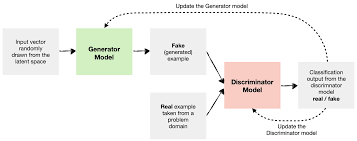






### Train Function

As the training is repetitive, i place the train gan function inside the a full function for ease of running later

In [14]:
def train_gan(d, g, latent_dim, data, epochs=100, learning_rate=2e-4, beta_1=0.5, use_multiprocessing=True, workers=16, callbacks=None):
    gan = CGAN(discriminator=d,generator=g,latent_dim=128)
    gan.compile(
        d_optimizer=tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
        g_optimizer=tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
        loss_fn=tf.keras.losses.BinaryCrossentropy(),
    )
    gan_hist = gan.fit(
        dataset,
        epochs=100,
        use_multiprocessing=True,
        workers=16,
        callbacks=callbacks
    )
    return gan_hist, gan


### Setting the full scores data

In [15]:
full_scores = pd.DataFrame()

### Defining the variables

In [16]:
sizeOfBatch = 64
AUTO = tf.data.AUTOTUNE
sizeOfBuffer = 1024
noise = 128
numberClass = 10
latent_dim = 128

### Creating the dataset

In [17]:
dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
dataset = dataset.shuffle(buffer_size=sizeOfBuffer).batch(sizeOfBatch, num_parallel_calls=AUTO).prefetch(AUTO)

### Training Loop and Callbacks

#### Model Training

- Below defines the CGAN Model
- Standard approaches of training both discriminator and generator once each 
- Real and fake d loss was track together with d accuracy and g loss here

In [18]:
class CGAN(Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(CGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.noise = latent_dim
        self.d_real_loss_metric = tf.keras.metrics.Mean(name="d_real_loss")
        self.d_fake_loss_metric = tf.keras.metrics.Mean(name="d_fake_loss")
        self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")
        self.d_acc_metric = tf.keras.metrics.BinaryAccuracy(name="d_acc")

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(CGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    def train_step(self, data):
        real_images, ohl = data
        batch_size = tf.shape(real_images)[0]

        # Generate the noise and iamges
        latent_noise_vector = tf.random.normal(shape=(batch_size, self.noise))
        generated_images = self.generator([latent_noise_vector, ohl])
        combined_images = tf.concat([generated_images, real_images], axis=0)
        combined_condition = tf.concat([ohl, ohl], axis=0)
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Training the discriminator
        with tf.GradientTape() as tape:
            first_predictions = self.discriminator(
                [combined_images, combined_condition])
            d_loss = self.loss_fn(labels, first_predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )
        
        # Training the discriminator
        latent_noise_vector = tf.random.normal(shape=(batch_size, self.noise))

        misleading_labels = tf.ones((batch_size, 1))

        with tf.GradientTape() as tape:
            fake_images = self.generator([latent_noise_vector, ohl])
            second_predictions = self.discriminator([fake_images, ohl])
            g_loss = self.loss_fn(misleading_labels, second_predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights))

        self.d_real_loss_metric.update_state(d_loss)
        self.d_fake_loss_metric.update_state(d_loss) 
        self.g_loss_metric.update_state(g_loss)
        self.d_acc_metric.update_state(labels, first_predictions)  

        return {
            "d_real_loss": self.d_real_loss_metric.result(),
            "d_fake_loss": self.d_fake_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
            "d_acc": self.d_acc_metric.result(),
            "d_realO": tf.reduce_mean(first_predictions[:batch_size]), 
            "d_fakeO": tf.reduce_mean(first_predictions[batch_size:])   
        }


#### Callback

- Two callback of image generation and checkpoint to save models was created here

In [19]:
class CGANImageGenerationCallback(tf.keras.callbacks.Callback):
    def __init__(self, num_img=10, noise=128, num_classes=10, display_freq=10, vmin=0, vmax=1):
        self.num_img = num_img  
        self.noise_dim = noise  
        self.num_classes = num_classes
        self.display_freq = display_freq  
        self.vmin = vmin 
        self.vmax = vmax  
        self.constant_noise = tf.random.normal(shape=(self.num_img, self.noise_dim))  
        self.conditions = tf.keras.utils.to_categorical(np.arange(self.num_img) % self.num_classes, num_classes)  

    def generate_plot(self):
        generated_images = self.model.generator([self.constant_noise, self.conditions])
        generated_images = (generated_images - self.vmin) / (self.vmax - self.vmin)  

        fig = plt.figure(figsize=(12, 6))
        gs = gridspec.GridSpec(2, self.num_img // 2)  
        for i in range(self.num_img):
            ax = plt.subplot(gs[i])
            ax.imshow(generated_images[i, :, :, :])
            ax.axis('off')
        fig.patch.set_facecolor('#f0f0f0')
        plt.suptitle("Generated Images", fontsize=16)
        plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
        plt.show()

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.display_freq == 0:
            self.generate_plot()

In [20]:
class ModelCheckpointCallback(tf.keras.callbacks.Callback):
    def __init__(self, save_freq=10, model_dir=None):
        self.save_freq = save_freq
        self.model_dir = model_dir

    # Saving the weights
    def save(self, epoch=None):
        if epoch is not None:
            name = f'generator-{epoch}.h5'
            full_path = os.path.join(self.model_dir, name)
            os.makedirs(self.model_dir, exist_ok=True)
            self.model.generator.save(filepath=full_path, save_format='h5')
    
    # Saving after end 
    def on_train_end(self, logs=None):
        if not os.path.exists(self.model_dir):
            os.makedirs(self.model_dir)
        self.save('final')

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.save_freq == 0:
            self.save(epoch)



### Testing Model (From GAN)

##### Generator

__Key Ideas__

 1. **Input and Reshape Layers**:
- **Dense Layer**: 
    - **Units**: 256 * 4 * 4
    - **Input**: `latent_dim` (the dimension of the latent space).

- **LeakyReLU**:
    - **Alpha**: 0.2

- **Reshape**:
    - **New Shape**: (4, 4, 256)

 2. **Convolutional Layers and Upsampling**:
- **UpSampling2D** (3 times):

- **Conv2D and LeakyReLU Pairs** (3 times):
    - **Filters**: 128 (for each Conv2D layer)
    - **Kernel Size**: (3, 3) (for each Conv2D layer)
    - **Padding**: 'same' (keeps the spatial dimensions constant after the operation)
    - **Activation (LeakyReLU)**: Alpha set to 0.2

 3. **Output Layer**:
- **Conv2D**:
    - **Filters**: 3 (representing RGB channels)
    - **Kernel Size**: (3, 3)
    - **Activation**: 'tanh'
    - **Padding**: 'same'

In [21]:
def build_generator(noise_dim, num_conditions = 10):
    noise_input = Input(shape=(noise_dim,))
    conditions_input = Input(shape=(num_conditions,))

    merged_input = Concatenate()([noise_input, conditions_input])

    model = Sequential()
    n_nodes = 256 *4 * 4
    model.add(Dense(n_nodes, input_dim=noise_dim + num_conditions))  # Adjust input dimension to combined noise and condition input
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((4, 4, 256)))

    model.add(UpSampling2D())
    model.add(Conv2D(128, (3,3), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(UpSampling2D())
    model.add(Conv2DTranspose(3, kernel_size=4, strides=2, padding='same', activation='tanh', name='Output_Layer'))
    generator_output = model(merged_input)

    final_model = Model(inputs=[noise_input, conditions_input], outputs=generator_output, name='generator_cgan_1')

    return final_model


##### Discriminator
__Key Ideas__

 1. **Input Layer**:
   - **Conv2D**:
     - **Filters**: 64
     - **Kernel Size**: (3, 3)
     - **Padding**: 'same'
     - **Input Shape**: `in_shape` (the shape of the input images).

   - **LeakyReLU**:
     - **Alpha**: 0.2, allows a small gradient when the unit is inactive, promoting gradient flow during backpropagation.

2. **Convolutional Layers**:
   - Sequentially adding sets of Conv2D and LeakyReLU layers, increasing the number of filters and reducing the spatial dimensions of the feature maps using strides.
   - **First Set**:
     - **Conv2D**:
       - **Filters**: 128
       - **Kernel Size**: (3, 3)
       - **Strides**: (2, 2), reduces the spatial dimensions by half.
       - **Padding**: 'same'
     - **LeakyReLU**: Alpha set to 0.2

   - **Second Set**:
     - **Conv2D**:
       - **Filters**: 128
       - **Kernel Size**: (3, 3)
       - **Strides**: (2, 2)
       - **Padding**: 'same'
     - **LeakyReLU**: Alpha set to 0.2
3. **Flattening and Dense Output Layer**:
   - **Flatten**: Converts the 3D feature maps to a 1D feature vector.
   - **Dropout**: 
     - **Rate**: 0.4, randomly sets a fraction of input units to 0, helping to prevent overfitting.
   - **Dense**:
     - **Units**: 1, the output layer with a single neuron for binary classification.
     - **Activation**: 'sigmoid'



In [22]:
def build_discriminator(image_size=(32,32,3)):
    imgSizeI = Input(shape=image_size)
    weights_init = RandomNormal(mean=0, stddev=0.02)
    conditions = Input(shape=(10,))

    model = Sequential()
    model.add(Conv2D(64, (3,3), strides=(2,2), padding='same', input_shape=image_size))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model = model(imgSizeI)
    model = GlobalAveragePooling2D()(model)
    merged_layer = Concatenate()([model, conditions])
    model = Dense(512, activation='relu')(merged_layer)
    model = Dense(1, activation='sigmoid', name='Output_Layer')(model)

    model = Model(inputs=[imgSizeI, conditions],
                          outputs=model, name='discriminator_cgan_2')
    return model

#### Creating Checkpoint

In [23]:
callbacks = [CGANImageGenerationCallback(num_img=10, noise=128,  vmin=-1, vmax=1), ModelCheckpointCallback(model_dir='baselineCGAN-1')]

#### Training

In [24]:
discriminator_cgan1 = build_discriminator()
generator_cgan1 = build_generator(128)

In [25]:
tf.keras.backend.clear_session()
K.clear_session()

Epoch 1/100
782/782 [==============================] - ETA: 0s - d_real_loss: 0.5828 - d_fake_loss: 0.5828 - g_loss: 0.9869 - d_acc: 0.7180 - d_realO: 0.4212 - d_fakeO: 0.5823

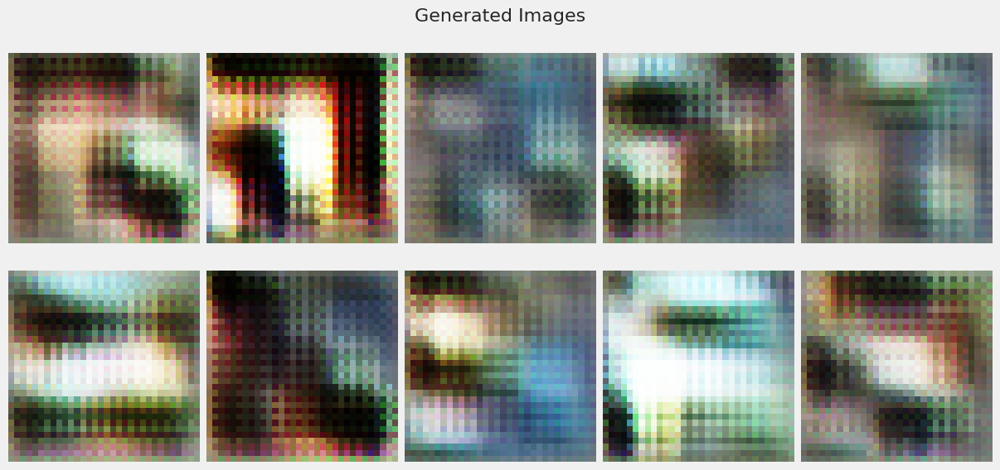

782/782 [==============================] - 8s 6ms/step - d_real_loss: 0.5828 - d_fake_loss: 0.5828 - g_loss: 0.9869 - d_acc: 0.7180 - d_realO: 0.4213 - d_fakeO: 0.5822
Epoch 2/100
782/782 [==============================] - 4s 6ms/step - d_real_loss: 0.6505 - d_fake_loss: 0.6505 - g_loss: 0.8089 - d_acc: 0.6408 - d_realO: 0.4691 - d_fakeO: 0.5299
Epoch 3/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6601 - d_fake_loss: 0.6601 - g_loss: 0.7836 - d_acc: 0.6178 - d_realO: 0.4757 - d_fakeO: 0.5240
Epoch 4/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6909 - d_fake_loss: 0.6909 - g_loss: 0.7232 - d_acc: 0.5286 - d_realO: 0.4948 - d_fakeO: 0.5048
Epoch 5/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6909 - d_fake_loss: 0.6909 - g_loss: 0.7134 - d_acc: 0.5256 - d_realO: 0.4966 - d_fakeO: 0.5038
Epoch 6/100
782/782 [==============================] - 4s 6ms/step - d_real_loss: 0.6875 - d_fake_loss: 0.6875 -

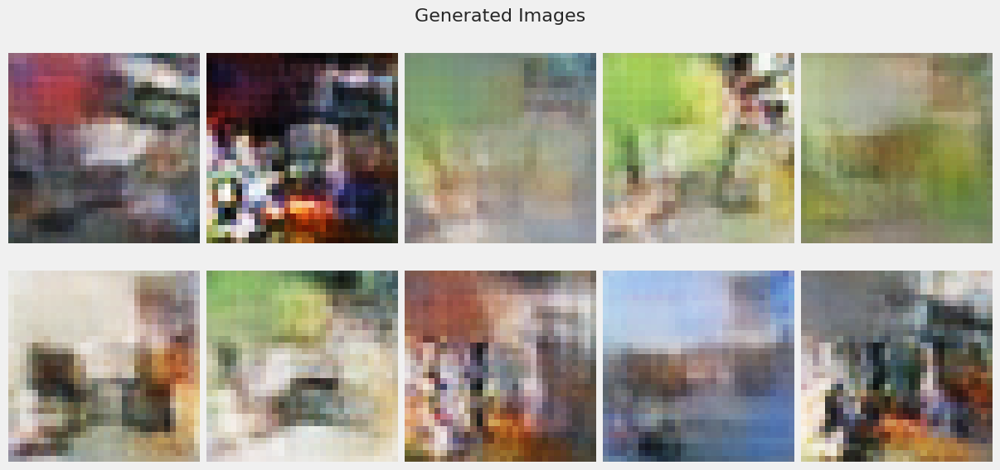

782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.6867 - d_fake_loss: 0.6867 - g_loss: 0.7133 - d_acc: 0.5460 - d_realO: 0.4952 - d_fakeO: 0.5048
Epoch 12/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6848 - d_fake_loss: 0.6848 - g_loss: 0.7168 - d_acc: 0.5515 - d_realO: 0.4942 - d_fakeO: 0.5061
Epoch 13/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6828 - d_fake_loss: 0.6828 - g_loss: 0.7204 - d_acc: 0.5558 - d_realO: 0.4928 - d_fakeO: 0.5073
Epoch 14/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6814 - d_fake_loss: 0.6814 - g_loss: 0.7254 - d_acc: 0.5607 - d_realO: 0.4917 - d_fakeO: 0.5083
Epoch 15/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6795 - d_fake_loss: 0.6795 - g_loss: 0.7265 - d_acc: 0.5636 - d_realO: 0.4905 - d_fakeO: 0.5096
Epoch 16/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6769 - d_fake_loss: 0.6

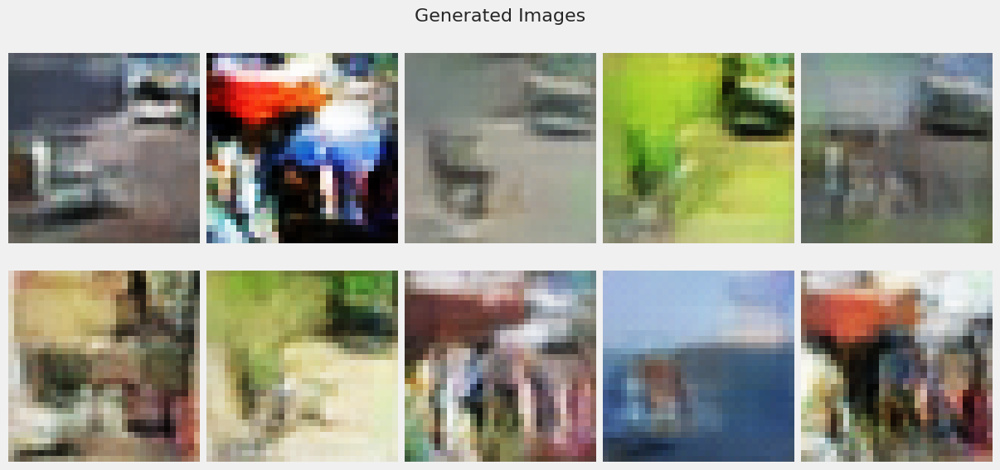

782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.6640 - d_fake_loss: 0.6640 - g_loss: 0.7539 - d_acc: 0.5881 - d_realO: 0.4796 - d_fakeO: 0.5206
Epoch 22/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6619 - d_fake_loss: 0.6619 - g_loss: 0.7571 - d_acc: 0.5913 - d_realO: 0.4779 - d_fakeO: 0.5219
Epoch 23/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6585 - d_fake_loss: 0.6585 - g_loss: 0.7647 - d_acc: 0.5948 - d_realO: 0.4754 - d_fakeO: 0.5244
Epoch 24/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6553 - d_fake_loss: 0.6553 - g_loss: 0.7689 - d_acc: 0.6015 - d_realO: 0.4734 - d_fakeO: 0.5267
Epoch 25/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6517 - d_fake_loss: 0.6517 - g_loss: 0.7738 - d_acc: 0.6093 - d_realO: 0.4711 - d_fakeO: 0.5291
Epoch 26/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6484 - d_fake_loss: 0.6

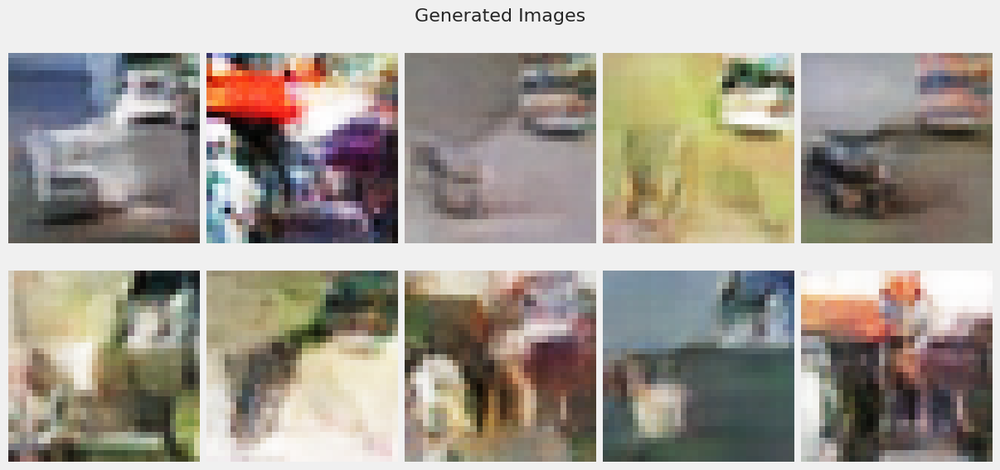

782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.6368 - d_fake_loss: 0.6368 - g_loss: 0.8075 - d_acc: 0.6227 - d_realO: 0.4586 - d_fakeO: 0.5413
Epoch 32/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6334 - d_fake_loss: 0.6334 - g_loss: 0.8133 - d_acc: 0.6291 - d_realO: 0.4568 - d_fakeO: 0.5436
Epoch 33/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6311 - d_fake_loss: 0.6311 - g_loss: 0.8176 - d_acc: 0.6328 - d_realO: 0.4547 - d_fakeO: 0.5455
Epoch 34/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6294 - d_fake_loss: 0.6294 - g_loss: 0.8241 - d_acc: 0.6328 - d_realO: 0.4530 - d_fakeO: 0.5471
Epoch 35/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6258 - d_fake_loss: 0.6258 - g_loss: 0.8314 - d_acc: 0.6365 - d_realO: 0.4506 - d_fakeO: 0.5495
Epoch 36/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.6219 - d_fake_loss: 0.6

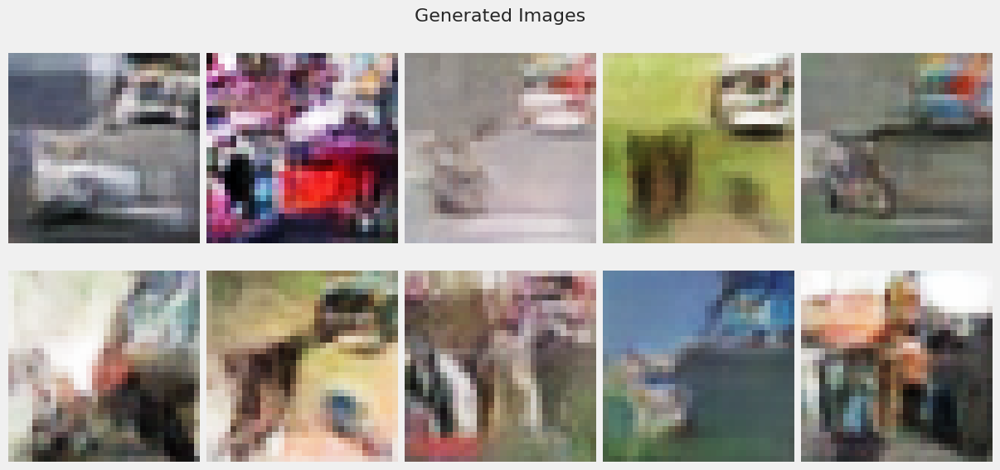

782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.6046 - d_fake_loss: 0.6046 - g_loss: 0.8818 - d_acc: 0.6630 - d_realO: 0.4344 - d_fakeO: 0.5657
Epoch 42/100
782/782 [==============================] - 4s 6ms/step - d_real_loss: 0.6033 - d_fake_loss: 0.6033 - g_loss: 0.8843 - d_acc: 0.6630 - d_realO: 0.4331 - d_fakeO: 0.5664
Epoch 43/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5997 - d_fake_loss: 0.5997 - g_loss: 0.8925 - d_acc: 0.6659 - d_realO: 0.4306 - d_fakeO: 0.5699
Epoch 44/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5972 - d_fake_loss: 0.5972 - g_loss: 0.8985 - d_acc: 0.6691 - d_realO: 0.4287 - d_fakeO: 0.5717
Epoch 45/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5936 - d_fake_loss: 0.5936 - g_loss: 0.9044 - d_acc: 0.6703 - d_realO: 0.4260 - d_fakeO: 0.5742
Epoch 46/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5943 - d_fake_loss: 0.5

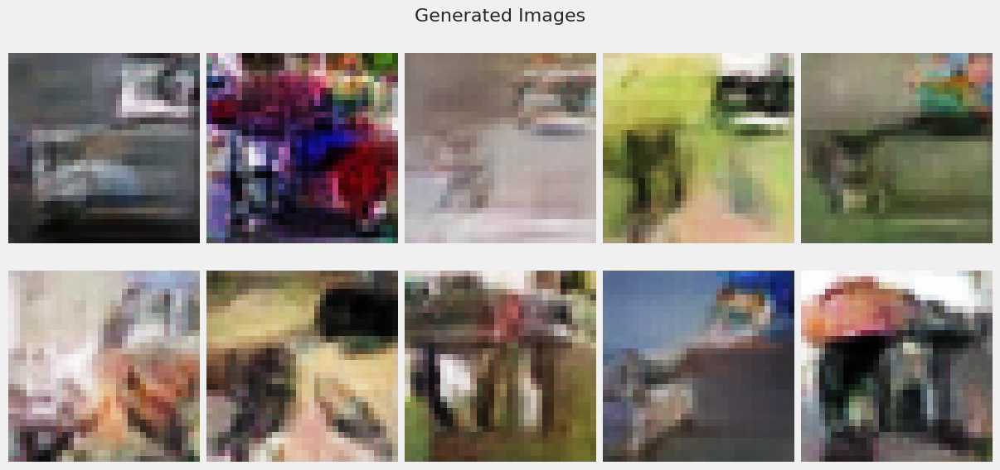

782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.5835 - d_fake_loss: 0.5835 - g_loss: 0.9317 - d_acc: 0.6782 - d_realO: 0.4173 - d_fakeO: 0.5827
Epoch 52/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5855 - d_fake_loss: 0.5855 - g_loss: 0.9352 - d_acc: 0.6774 - d_realO: 0.4176 - d_fakeO: 0.5824
Epoch 53/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5775 - d_fake_loss: 0.5775 - g_loss: 0.9495 - d_acc: 0.6851 - d_realO: 0.4125 - d_fakeO: 0.5875
Epoch 54/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5744 - d_fake_loss: 0.5744 - g_loss: 0.9577 - d_acc: 0.6890 - d_realO: 0.4100 - d_fakeO: 0.5903
Epoch 55/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5777 - d_fake_loss: 0.5777 - g_loss: 0.9529 - d_acc: 0.6834 - d_realO: 0.4117 - d_fakeO: 0.5881
Epoch 56/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5736 - d_fake_loss: 0.5

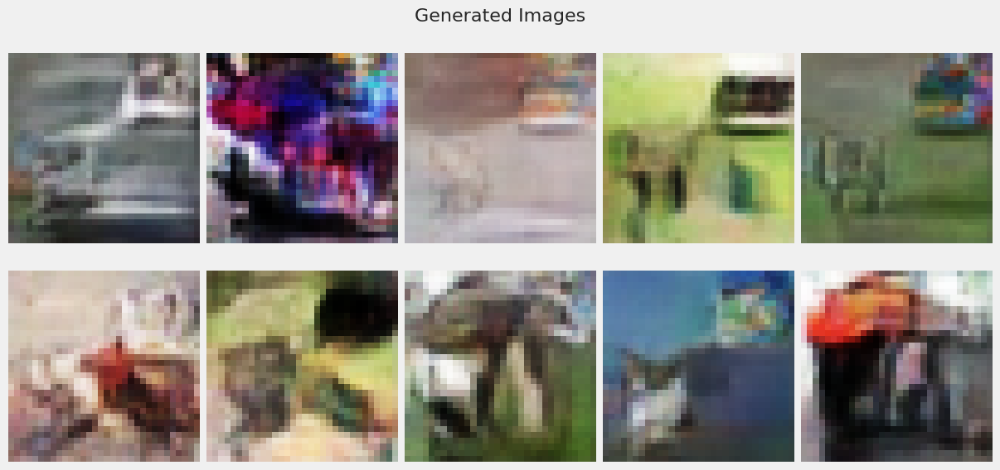

782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.5625 - d_fake_loss: 0.5625 - g_loss: 0.9912 - d_acc: 0.6974 - d_realO: 0.3998 - d_fakeO: 0.6004
Epoch 62/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5680 - d_fake_loss: 0.5680 - g_loss: 0.9845 - d_acc: 0.6933 - d_realO: 0.4026 - d_fakeO: 0.5972
Epoch 63/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5602 - d_fake_loss: 0.5602 - g_loss: 1.0031 - d_acc: 0.7001 - d_realO: 0.3975 - d_fakeO: 0.6027
Epoch 64/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5623 - d_fake_loss: 0.5623 - g_loss: 0.9941 - d_acc: 0.6988 - d_realO: 0.3993 - d_fakeO: 0.6009
Epoch 65/100
782/782 [==============================] - 4s 6ms/step - d_real_loss: 0.5564 - d_fake_loss: 0.5564 - g_loss: 1.0068 - d_acc: 0.7045 - d_realO: 0.3953 - d_fakeO: 0.6052
Epoch 66/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5565 - d_fake_loss: 0.5

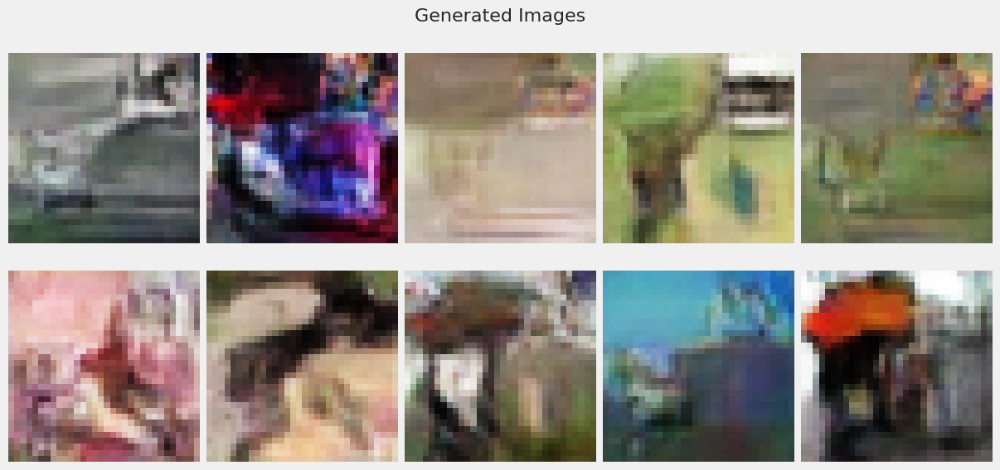

782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.5488 - d_fake_loss: 0.5488 - g_loss: 1.0177 - d_acc: 0.7115 - d_realO: 0.3909 - d_fakeO: 0.6092
Epoch 72/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5475 - d_fake_loss: 0.5475 - g_loss: 1.0288 - d_acc: 0.7111 - d_realO: 0.3886 - d_fakeO: 0.6118
Epoch 73/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5456 - d_fake_loss: 0.5456 - g_loss: 1.0403 - d_acc: 0.7113 - d_realO: 0.3860 - d_fakeO: 0.6140
Epoch 74/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5384 - d_fake_loss: 0.5384 - g_loss: 1.0606 - d_acc: 0.7197 - d_realO: 0.3804 - d_fakeO: 0.6194
Epoch 75/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5360 - d_fake_loss: 0.5360 - g_loss: 1.0806 - d_acc: 0.7221 - d_realO: 0.3777 - d_fakeO: 0.6230
Epoch 76/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5275 - d_fake_loss: 0.5

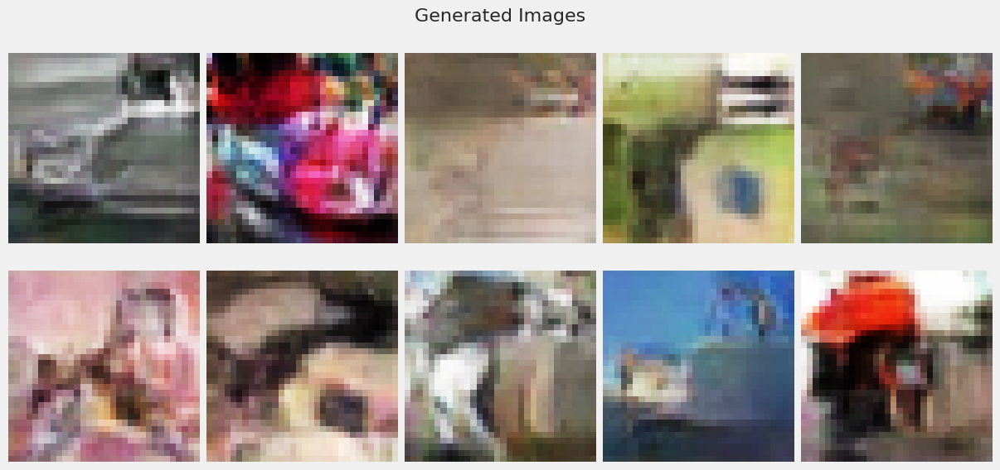

782/782 [==============================] - 6s 8ms/step - d_real_loss: 0.5306 - d_fake_loss: 0.5306 - g_loss: 1.0941 - d_acc: 0.7247 - d_realO: 0.3728 - d_fakeO: 0.6274
Epoch 82/100
782/782 [==============================] - 6s 7ms/step - d_real_loss: 0.5267 - d_fake_loss: 0.5267 - g_loss: 1.0899 - d_acc: 0.7293 - d_realO: 0.3720 - d_fakeO: 0.6283
Epoch 83/100
782/782 [==============================] - 6s 7ms/step - d_real_loss: 0.5230 - d_fake_loss: 0.5230 - g_loss: 1.1141 - d_acc: 0.7316 - d_realO: 0.3678 - d_fakeO: 0.6318
Epoch 84/100
782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.5261 - d_fake_loss: 0.5261 - g_loss: 1.0957 - d_acc: 0.7304 - d_realO: 0.3709 - d_fakeO: 0.6294
Epoch 85/100
782/782 [==============================] - 5s 7ms/step - d_real_loss: 0.5223 - d_fake_loss: 0.5223 - g_loss: 1.1013 - d_acc: 0.7324 - d_realO: 0.3684 - d_fakeO: 0.6318
Epoch 86/100
782/782 [==============================] - 4s 6ms/step - d_real_loss: 0.5152 - d_fake_loss: 0.5

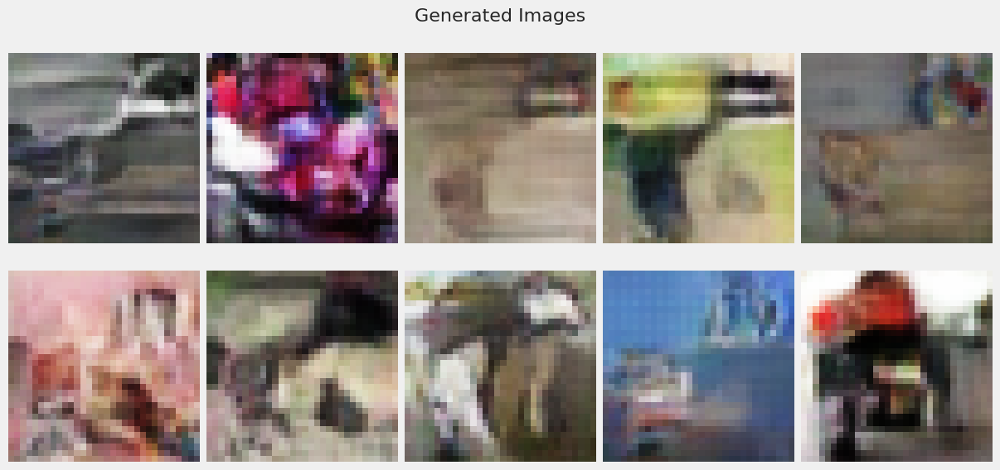

782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.5109 - d_fake_loss: 0.5109 - g_loss: 1.1392 - d_acc: 0.7427 - d_realO: 0.3592 - d_fakeO: 0.6405
Epoch 92/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5095 - d_fake_loss: 0.5095 - g_loss: 1.1374 - d_acc: 0.7429 - d_realO: 0.3590 - d_fakeO: 0.6414
Epoch 93/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5068 - d_fake_loss: 0.5068 - g_loss: 1.1492 - d_acc: 0.7462 - d_realO: 0.3560 - d_fakeO: 0.6445
Epoch 94/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5062 - d_fake_loss: 0.5062 - g_loss: 1.1437 - d_acc: 0.7458 - d_realO: 0.3568 - d_fakeO: 0.6435
Epoch 95/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5018 - d_fake_loss: 0.5018 - g_loss: 1.1563 - d_acc: 0.7478 - d_realO: 0.3537 - d_fakeO: 0.6464
Epoch 96/100
782/782 [==============================] - 4s 5ms/step - d_real_loss: 0.5029 - d_fake_loss: 0.5

In [26]:
gan_1= train_gan(discriminator_cgan1, generator_cgan1, noise,  dataset, epochs=15, callbacks=callbacks)

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- Looking at the accuracy, we can see that the discriminator ended with a  75% accuracy while it may not be the best, it did show that it is not able to fully determine real and fake as it started from 0.6
- Model Collapse and did not perform very well


</div>

87910968/87910968 [==============================] - 11s 0us/step


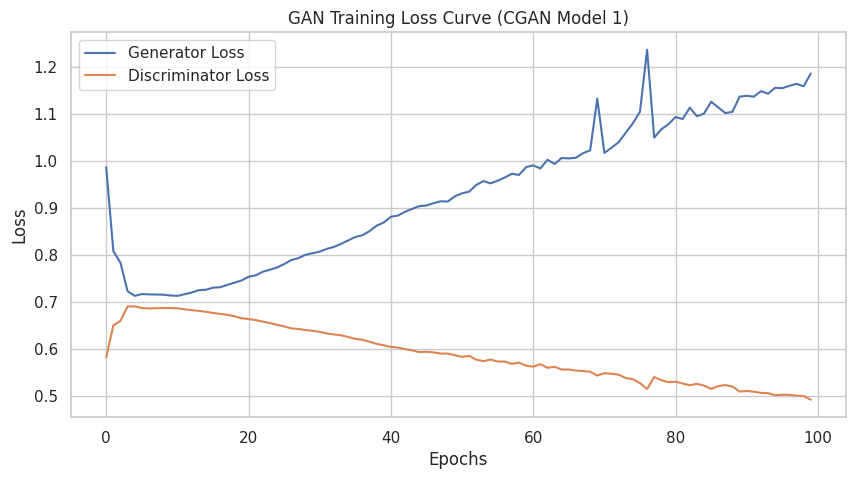

In [27]:
gan_history_1 = gan_1[0].history
generator = gan_1[1].generator  
gan_history_1['d_loss'] = [(real_loss + fake_loss) / 2 for real_loss, fake_loss in zip(gan_history_1['d_real_loss'], gan_history_1['d_fake_loss'])]
evaluator = Evaluation(generator, latent_dim, 512, 10000, 1024)
evaluator.plot_loss_curve(gan_history_1, title='GAN Training Loss Curve (CGAN Model 1)')


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- Discriminator loss
    - For the discriminator loss, it starts high then drop to relatively low and rises quickly and continues to increase steadily as the epochs increases
- Generator loss
    - For the generator loss, it increases with a spike and drops and proceeded to drop slowly


</div>

In [28]:
tf.keras.backend.clear_session()
K.clear_session()
scores1 = evaluator.compute_metrics(x_train, cgan=True)
print('FID Score:', scores1[0])
print('KID Score:', scores1[1])

[0 0 0 ... 9 9 9]
313/313 [==============================] - 0s 1ms/step
FID Score: 55.370707797769285
KID Score: 0.036374082712800515


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- FID Score of 55 
- KID Score is 0.04
    
Both are not too good 

</div>

#### Visualise the Images

4/4 [==============================] - 0s 11ms/step
Class 0 - 100 Generated Images


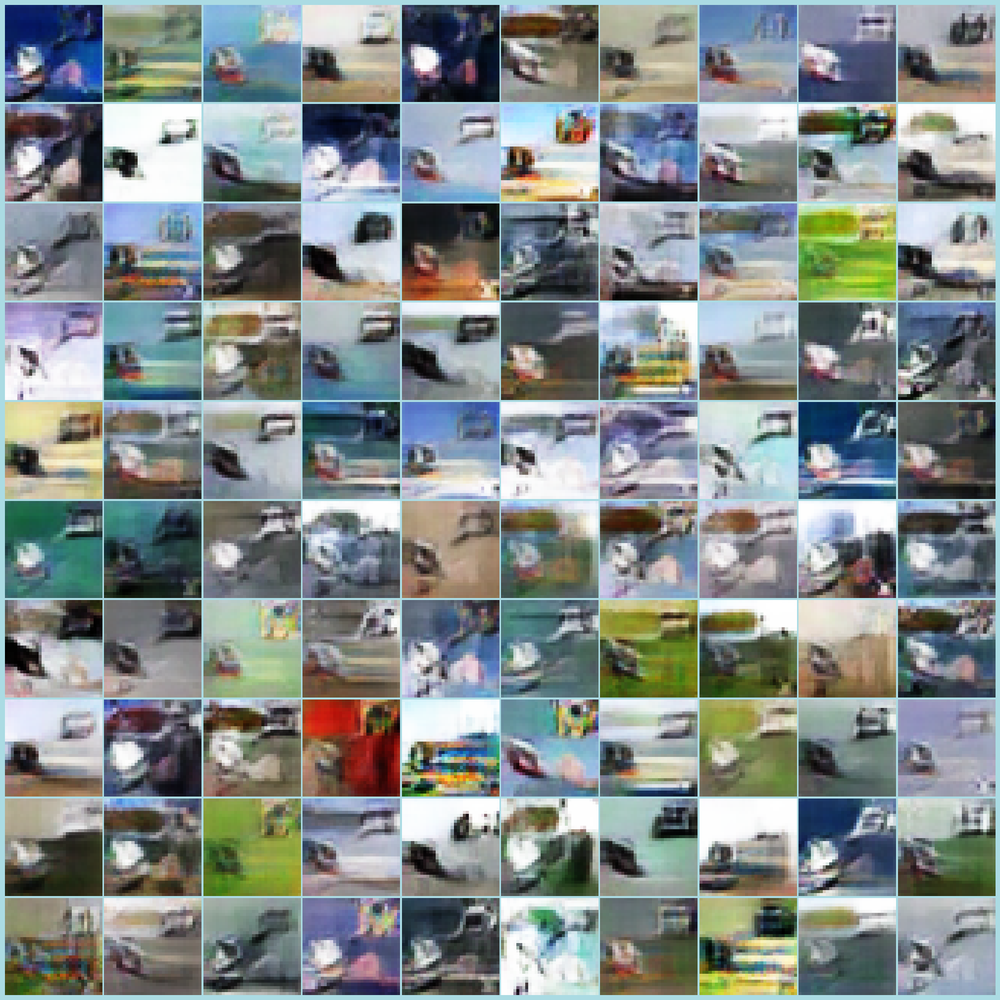

4/4 [==============================] - 0s 1ms/step
Class 1 - 100 Generated Images


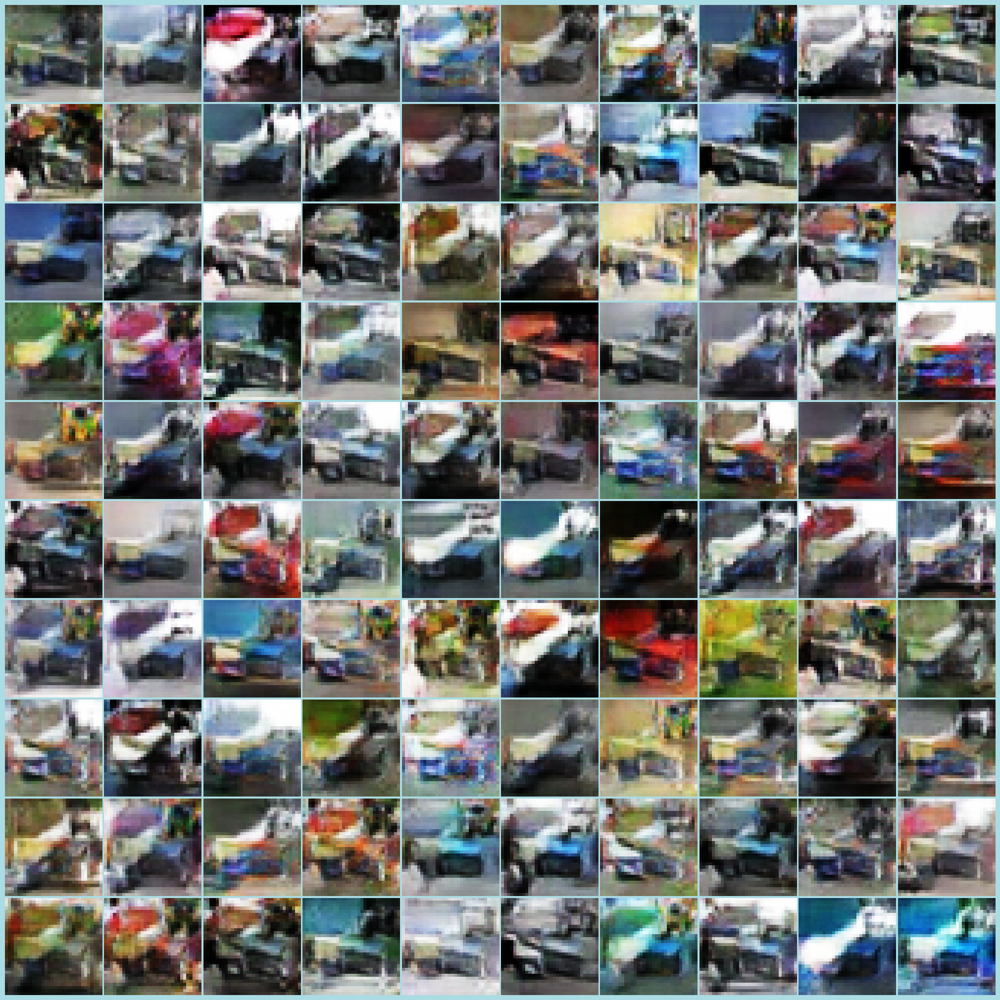

4/4 [==============================] - 0s 2ms/step
Class 2 - 100 Generated Images


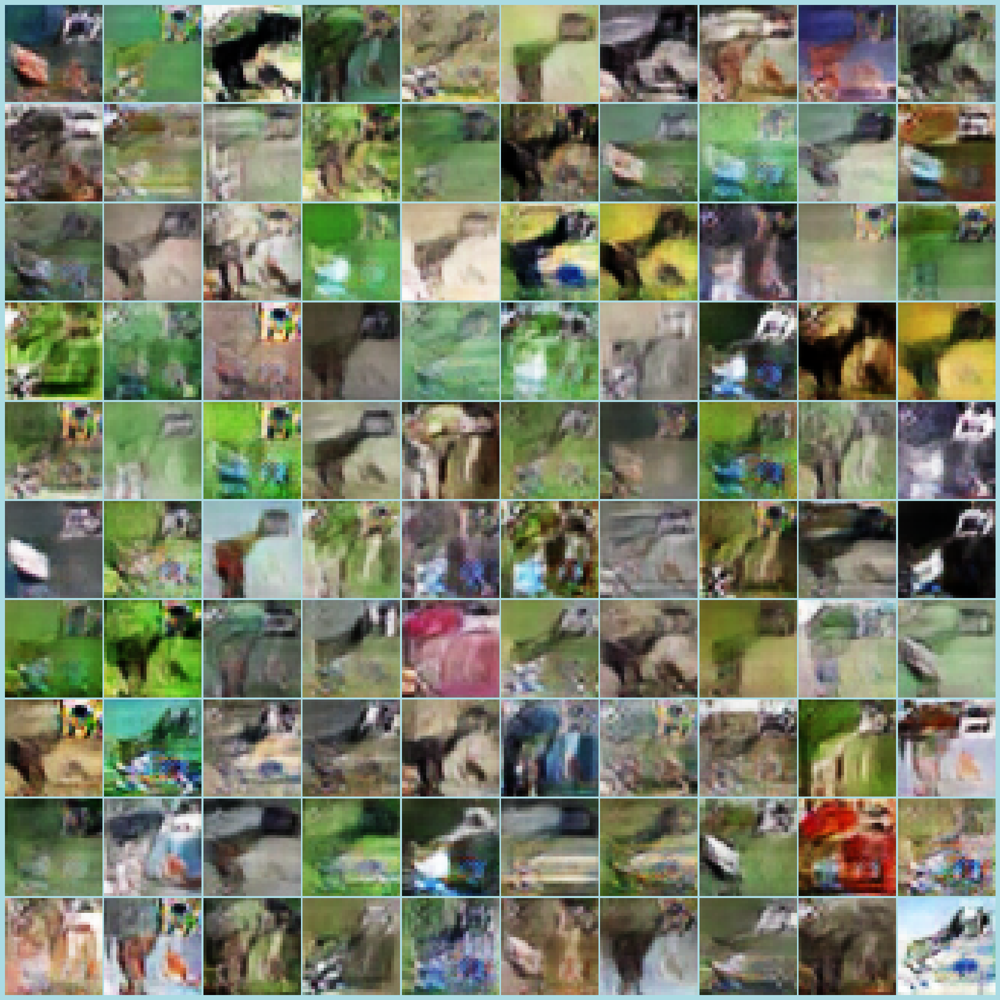

4/4 [==============================] - 0s 1ms/step
Class 3 - 100 Generated Images


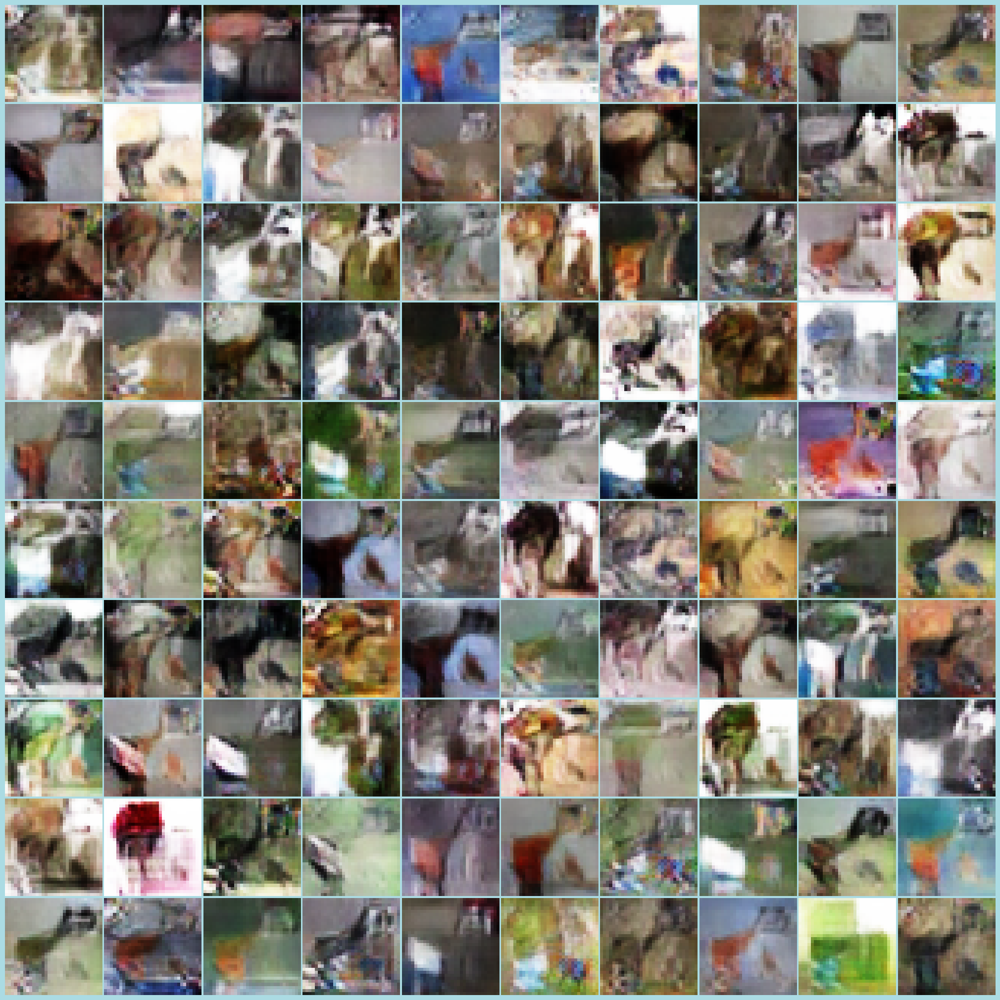

4/4 [==============================] - 0s 2ms/step
Class 4 - 100 Generated Images


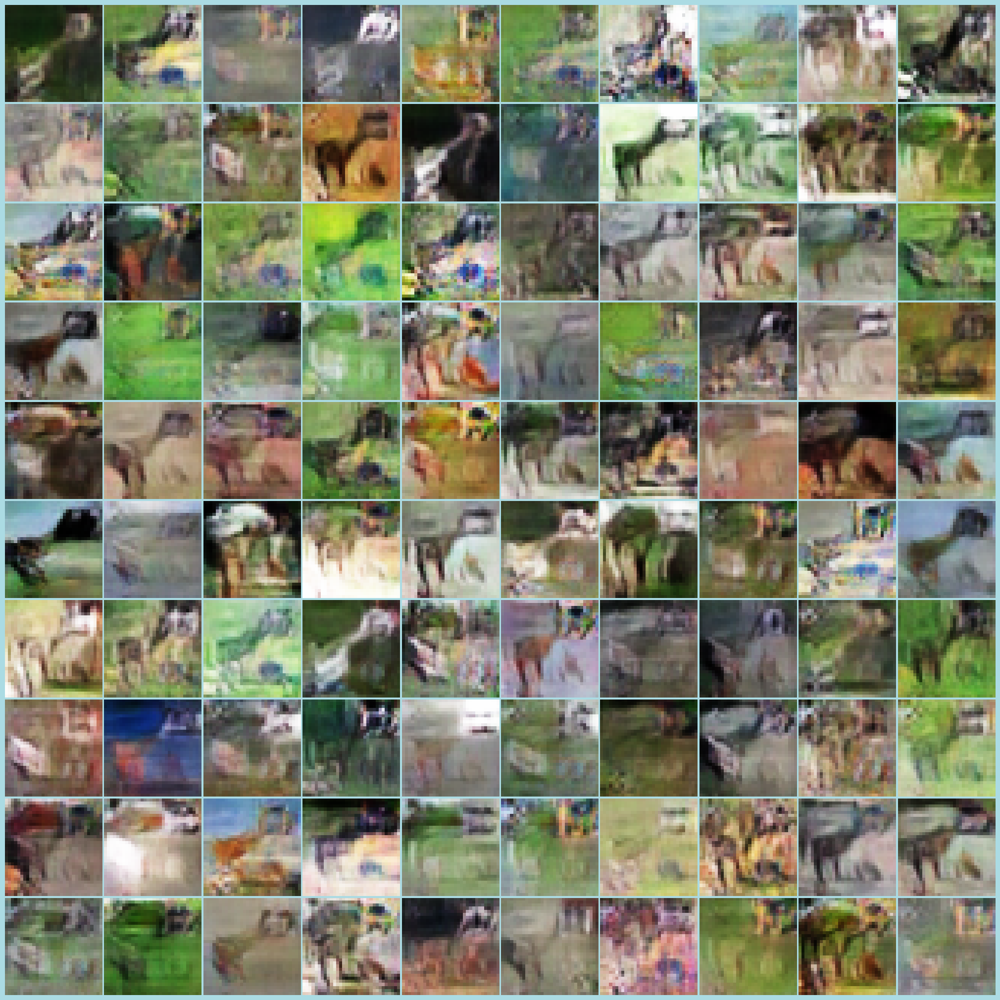

4/4 [==============================] - 0s 1ms/step
Class 5 - 100 Generated Images


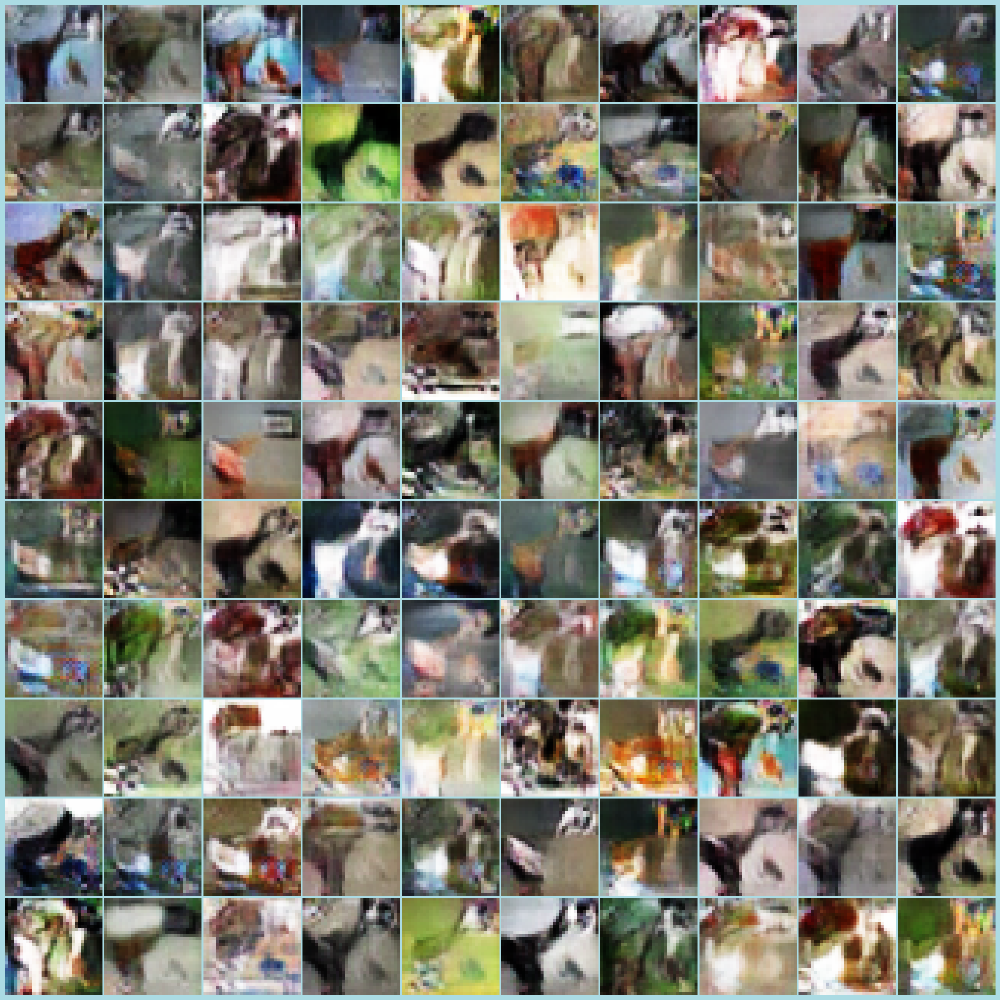

4/4 [==============================] - 0s 2ms/step
Class 6 - 100 Generated Images


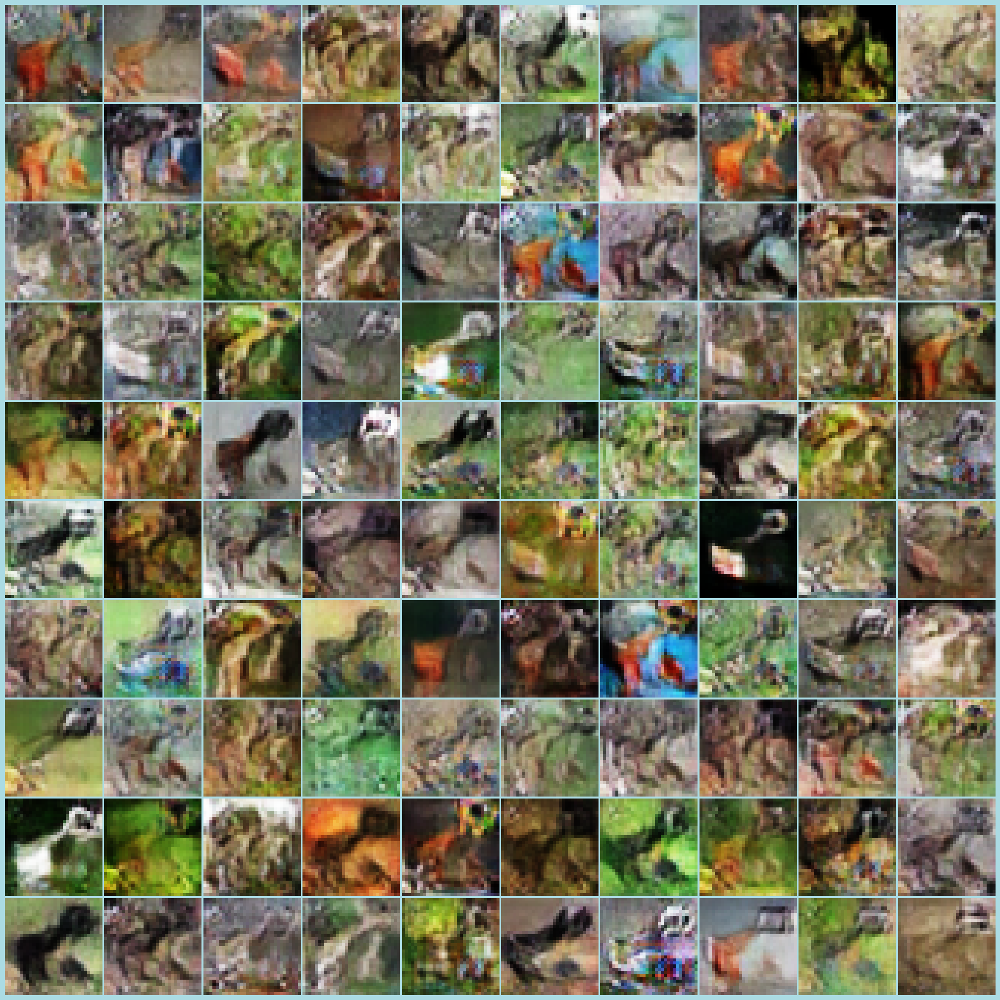

4/4 [==============================] - 0s 1ms/step
Class 7 - 100 Generated Images


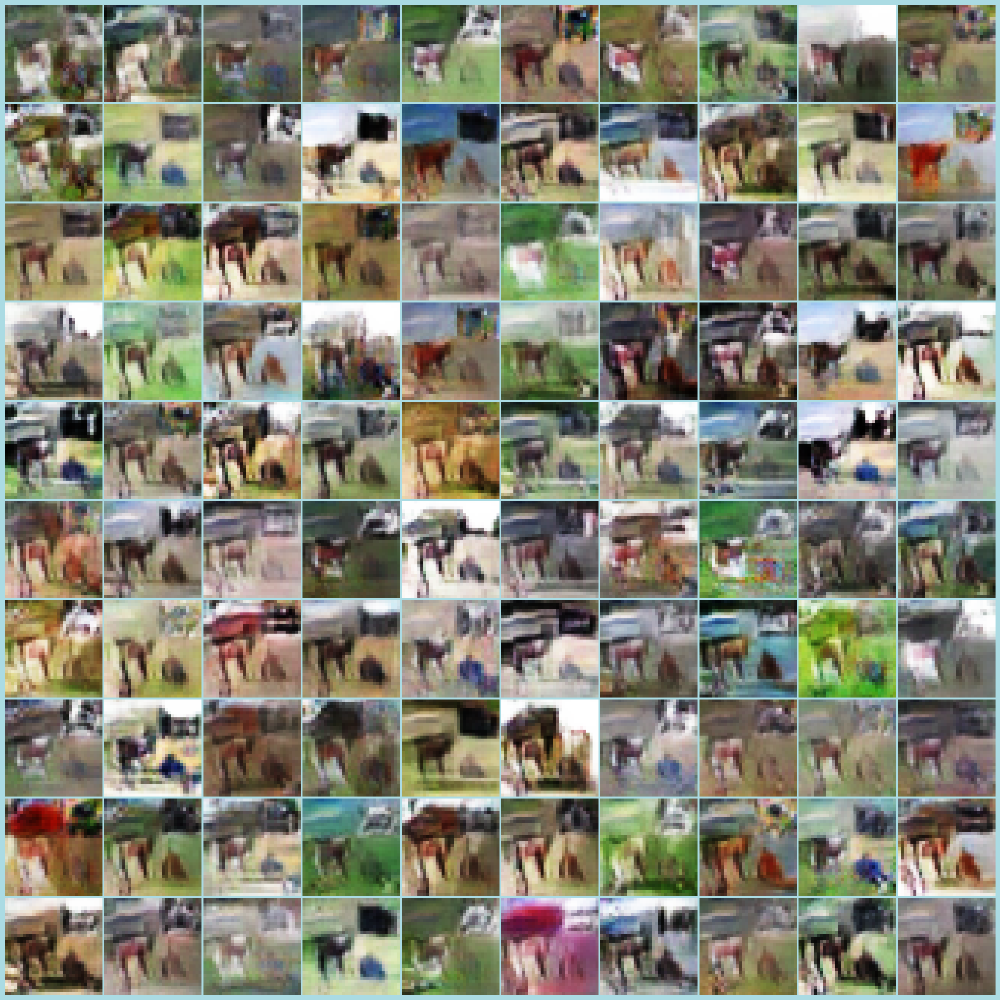

4/4 [==============================] - 0s 1ms/step
Class 8 - 100 Generated Images


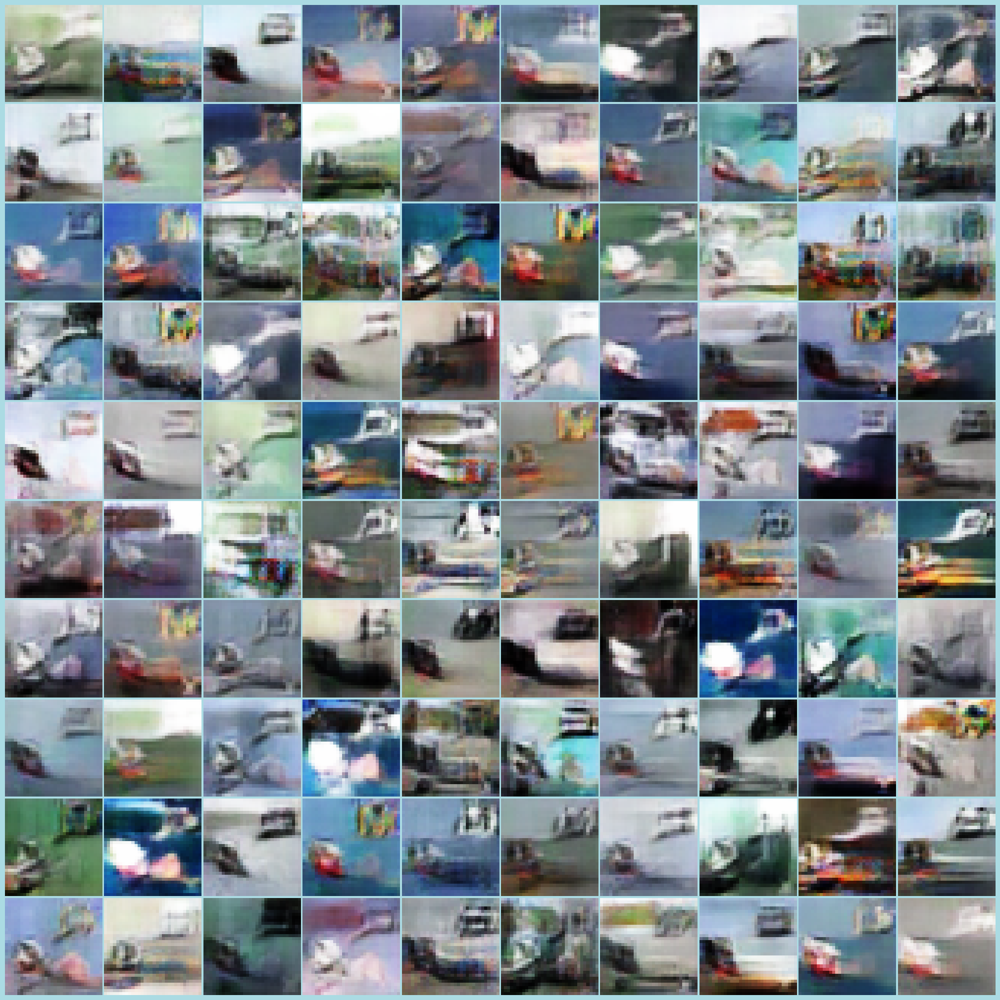

4/4 [==============================] - 0s 2ms/step
Class 9 - 100 Generated Images


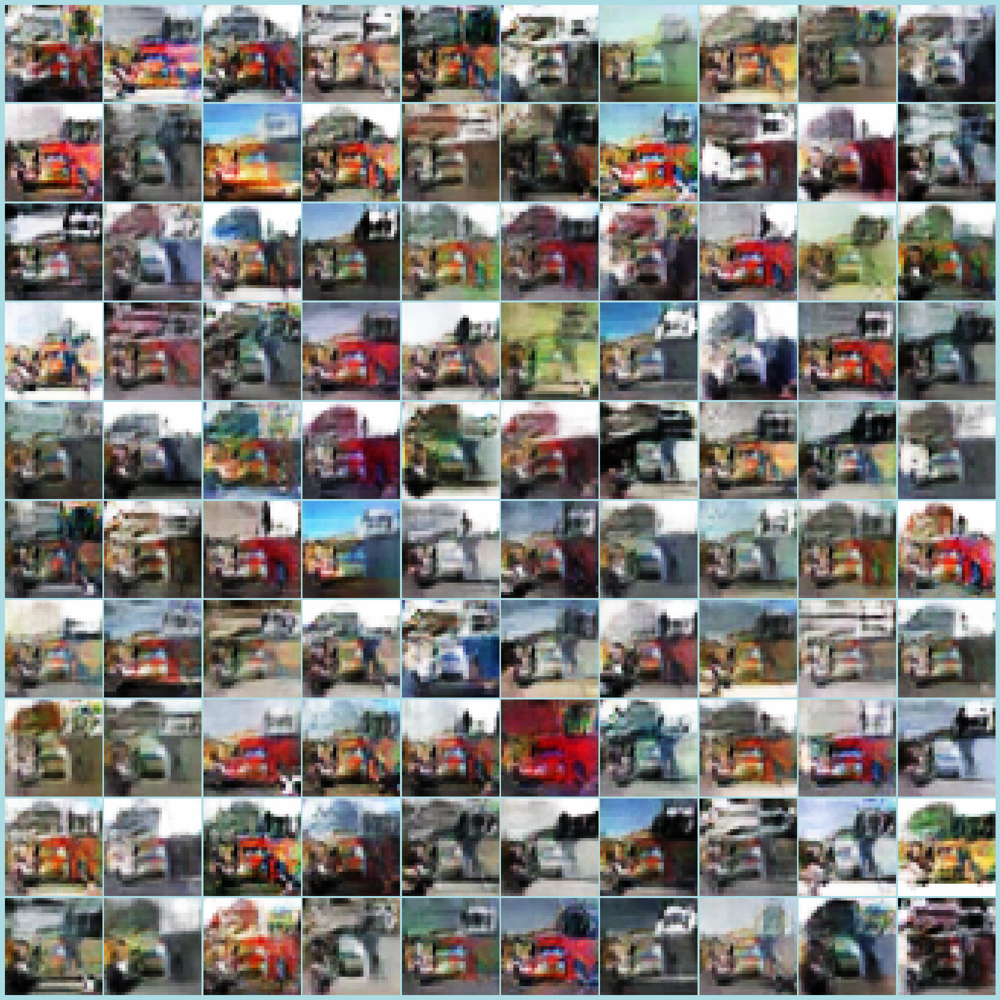

In [29]:
generate_1000_cgan(generator)

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- 1000 images provided similar idea compared to comparing it with a classifier but model really collapse

</div>

### First Model

##### Generator

__Key Ideas__

1. **Input and Dense Layer**:
   - **Dense Layer**: 
     - **Units**: 2 * 2 * 512
     - **Input**: `noise` dimension + 10 (for the conditional input).
     - **Activation**: 'relu'
     - **Kernel Initializer**: Random Normal (mean=0, stddev=0.02)

2. **Batch Normalization and Activation (PReLU)**:
   - **BatchNormalization**: Momentum set to 0.8
   - **PReLU**: Parametric ReLU used after each BatchNormalization layer

3. **Reshape Layer**:
   - **Reshape**: Converts the Dense layer's output to be compatible with the Conv2DTranspose layers, reshaping to (2, 2, 512).

4. **Conv2DTranspose Layers**:
   - **1st Conv2DTranspose**:
     - **Filters**: 256
     - **Kernel Size**: 4
     - **Strides**: 2
     - **Padding**: 'same'
     - **Kernel Initializer**: Random Normal (mean=0, stddev=0.02)
   
   - **2nd Conv2DTranspose**:
     - **Filters**: 128
     - **Kernel Size**: 4
     - **Strides**: 2
     - **Padding**: 'same'
     - **Kernel Initializer**: Random Normal (mean=0, stddev=0.02)
     
   - **3rd Conv2DTranspose**:
     - **Filters**: 64
     - **Kernel Size**: 4
     - **Strides**: 2
     - **Padding**: 'same'
     - **Kernel Initializer**: Random Normal (mean=0, stddev=0.02)

5. **Output Layer**:
   - **Conv2DTranspose**:
     - **Filters**: 3 (for generating RGB images)
     - **Kernel Size**: 4
     - **Strides**: 2
     - **Padding**: 'same'
     - **Activation**: 'tanh'
     - **Name**: 'Output_Layer'

6. **Merging Input (Noise and Condition)**:
   - **Noise Input**: Input layer for noise vector
   - **Condition Input**: Input layer for conditions
   - **Merged Input**: Concatenation of Noise and Condition inputs


In [30]:
def build_generator(noise):
    weights_init = RandomNormal(mean=0, stddev=0.02)

    model = Sequential(name='generator_cgan_1')
    model.add(Dense(2*2*512, input_dim=noise + 10, activation='relu', kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(PReLU())
    model.add(Reshape((2, 2, 512)))
    model.add(Conv2DTranspose(256, kernel_size=4, strides=2, padding='same', kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(PReLU())

    model.add(Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(PReLU())

    model.add(Conv2DTranspose(64, kernel_size=4, strides=2, padding='same', kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(PReLU())
    model.add(Conv2DTranspose(3, kernel_size=4, strides=2, padding='same', activation='tanh', name='Output_Layer'))
    noise_input = Input(shape=(noise,))
    conditions_input = Input(shape=(10,))
    merged_input = Concatenate()([noise_input, conditions_input])
    generator_output = model(merged_input)

    final_model = Model(inputs=[noise_input, conditions_input], outputs=generator_output, name='generator_cgan_1')
    return final_model

##### Discriminator
__Key Ideas__

1. **Input Layers**:
   - **Image Input**: Input layer for the image with shape `image_size` (32, 32, 3).
   - **Conditions Input**: Input layer for the conditions with shape (10,).

2. **Convolutional Layers**:
   - **1st Conv2D Layer**:
     - **Filters**: 64
     - **Kernel Size**: 4
     - **Strides**: 2
     - **Padding**: 'same'
     - **Kernel Initializer**: Random Normal (mean=0, stddev=0.02)
     - Followed by BatchNormalization (momentum=0.8) and LeakyReLU (alpha=0.2)
   
   - **2nd Conv2D Layer**:
     - **Filters**: 128
     - **Kernel Size**: 4
     - **Strides**: 2
     - **Padding**: 'same'
     - **Kernel Initializer**: Random Normal (mean=0, stddev=0.02)
     - Followed by BatchNormalization (momentum=0.8) and LeakyReLU (alpha=0.2)
     
   - **3rd Conv2D Layer**:
     - **Filters**: 256
     - **Kernel Size**: 4
     - **Strides**: 2
     - **Padding**: 'same'
     - **Kernel Initializer**: Random Normal (mean=0, stddev=0.02)
     - Followed by BatchNormalization (momentum=0.8) and LeakyReLU (alpha=0.2)

   - **4th Conv2D Layer**:
     - **Filters**: 512
     - **Kernel Size**: 4
     - **Strides**: 2
     - **Padding**: 'same'
     - **Kernel Initializer**: Random Normal (mean=0, stddev=0.02)
     - Followed by BatchNormalization (momentum=0.8) and LeakyReLU (alpha=0.2)

3. **Global Average Pooling**:
   - **GlobalAveragePooling2D**: Reduces the spatial dimensions to a vector.

4. **Merging Layer (Features and Conditions)**:
   - **Concatenate**: Merging the output of the GlobalAveragePooling2D layer with the conditions input.

5. **Dense Layers**:
   - **1st Dense Layer**:
     - **Units**: 512
     - **Activation**: 'relu'
   
   - **Output Layer (Dense)**:
     - **Units**: 1 (for binary classification, real or fake)
     - **Activation**: 'sigmoid'
     - **Name**: 'Output_Layer'


In [31]:
def build_discriminator(image_size=(32,32,3)):
    imgSizeI = Input(shape=image_size)
    weights_init = RandomNormal(mean=0, stddev=0.02)
    conditions = Input(shape=(10,))

    model = Sequential()
    model.add(Conv2D(64, kernel_size=4, strides=2, padding='same',kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, kernel_size=4, strides=2, padding='same',kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, kernel_size=4, strides=2, padding='same',kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, kernel_size=4, strides=2, padding='same',kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model = model(imgSizeI)
    model = GlobalAveragePooling2D()(model)
    merged_layer = Concatenate()([model, conditions])
    model = Dense(512, activation='relu')(merged_layer)
    model = Dense(1, activation='sigmoid', name='Output_Layer')(model)

    model = Model(inputs=[imgSizeI, conditions],
                          outputs=model, name='discriminator_cgan_2')
    return model

#### Creating Checkpoint

In [32]:
callbacks = [CGANImageGenerationCallback(num_img=10, noise=128,  vmin=-1, vmax=1), ModelCheckpointCallback(model_dir='baselineCGAN-1')]

#### Training

In [33]:
discriminator_cgan1 = build_discriminator()
generator_cgan1 = build_generator(128)

In [34]:
tf.keras.backend.clear_session()
K.clear_session()

Epoch 1/100
782/782 [==============================] - ETA: 0s - d_real_loss: 0.2785 - d_fake_loss: 0.2785 - g_loss: 3.5768 - d_acc: 0.9074 - d_realO: 0.1572 - d_fakeO: 0.8512

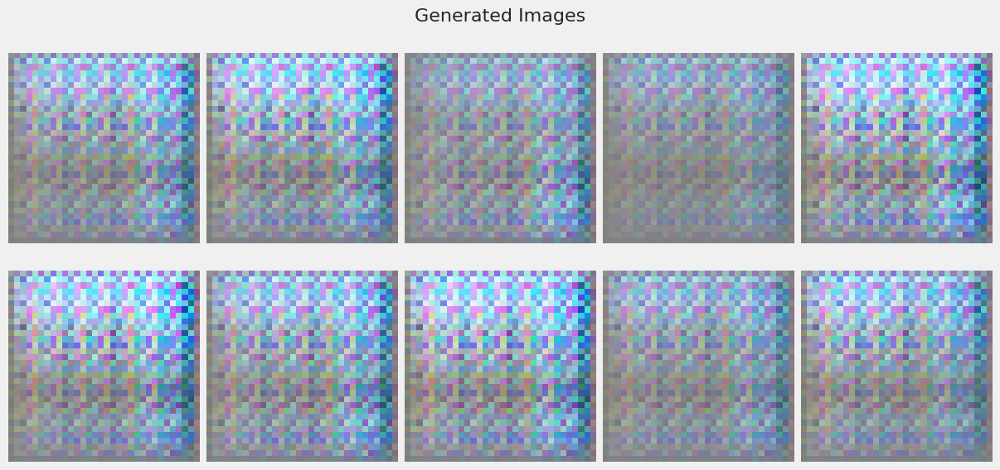

782/782 [==============================] - 10s 10ms/step - d_real_loss: 0.2785 - d_fake_loss: 0.2785 - g_loss: 3.5768 - d_acc: 0.9074 - d_realO: 0.1571 - d_fakeO: 0.8512
Epoch 2/100
782/782 [==============================] - 7s 9ms/step - d_real_loss: 0.3015 - d_fake_loss: 0.3015 - g_loss: 2.9339 - d_acc: 0.8869 - d_realO: 0.1759 - d_fakeO: 0.8111
Epoch 3/100
782/782 [==============================] - 7s 9ms/step - d_real_loss: 0.3173 - d_fake_loss: 0.3173 - g_loss: 2.6000 - d_acc: 0.8773 - d_realO: 0.1994 - d_fakeO: 0.8010
Epoch 4/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2812 - d_fake_loss: 0.2812 - g_loss: 2.8145 - d_acc: 0.8914 - d_realO: 0.1758 - d_fakeO: 0.8283
Epoch 5/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2734 - d_fake_loss: 0.2734 - g_loss: 3.0158 - d_acc: 0.8941 - d_realO: 0.1680 - d_fakeO: 0.8334
Epoch 6/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2876 - d_fake_loss: 0.2

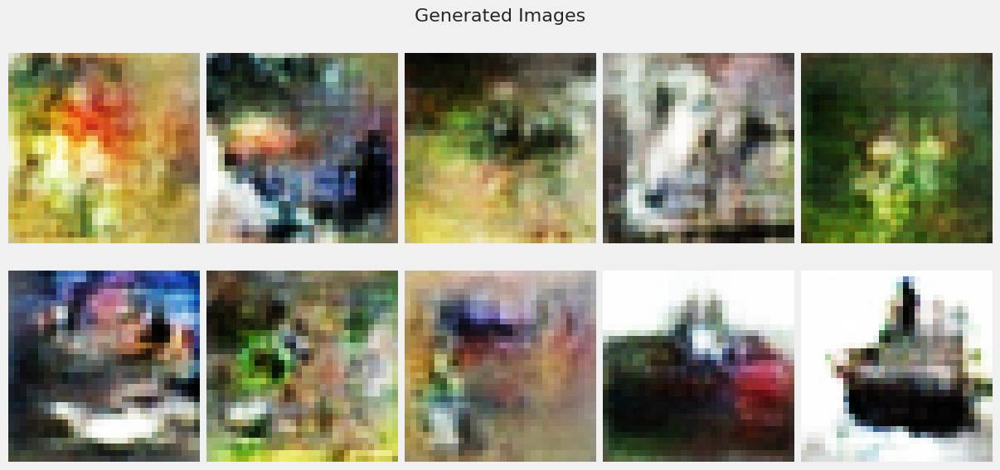

782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2830 - d_fake_loss: 0.2830 - g_loss: 2.9100 - d_acc: 0.8807 - d_realO: 0.1779 - d_fakeO: 0.8222
Epoch 12/100
782/782 [==============================] - 8s 10ms/step - d_real_loss: 0.2875 - d_fake_loss: 0.2875 - g_loss: 2.8346 - d_acc: 0.8777 - d_realO: 0.1813 - d_fakeO: 0.8188
Epoch 13/100
782/782 [==============================] - 8s 11ms/step - d_real_loss: 0.3278 - d_fake_loss: 0.3278 - g_loss: 2.6050 - d_acc: 0.8603 - d_realO: 0.2063 - d_fakeO: 0.7928
Epoch 14/100
782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.3185 - d_fake_loss: 0.3185 - g_loss: 2.5575 - d_acc: 0.8606 - d_realO: 0.2036 - d_fakeO: 0.7968
Epoch 15/100
782/782 [==============================] - 8s 10ms/step - d_real_loss: 0.3214 - d_fake_loss: 0.3214 - g_loss: 2.4816 - d_acc: 0.8601 - d_realO: 0.2056 - d_fakeO: 0.7938
Epoch 16/100
782/782 [==============================] - 7s 9ms/step - d_real_loss: 0.3232 - d_fake_los

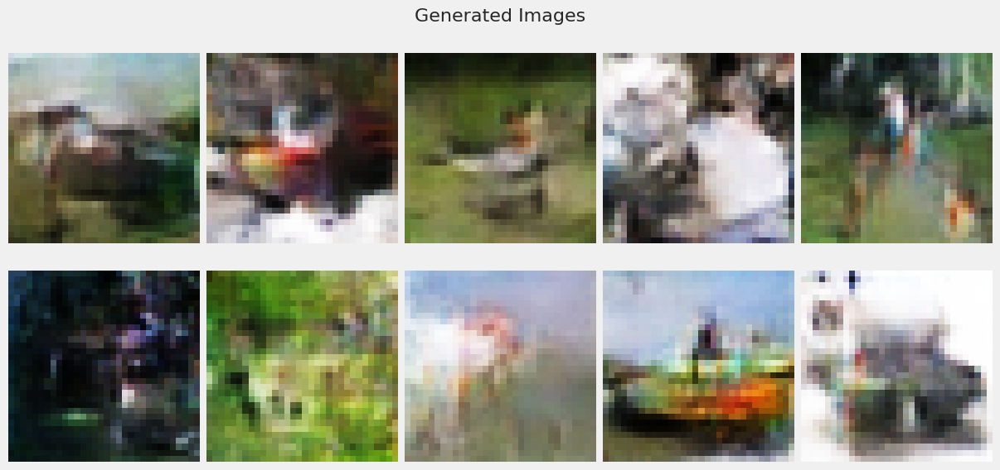

782/782 [==============================] - 8s 10ms/step - d_real_loss: 0.2954 - d_fake_loss: 0.2954 - g_loss: 2.6062 - d_acc: 0.8717 - d_realO: 0.1887 - d_fakeO: 0.8118
Epoch 22/100
782/782 [==============================] - 7s 9ms/step - d_real_loss: 0.2887 - d_fake_loss: 0.2887 - g_loss: 2.6666 - d_acc: 0.8760 - d_realO: 0.1844 - d_fakeO: 0.8156
Epoch 23/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2891 - d_fake_loss: 0.2891 - g_loss: 2.6626 - d_acc: 0.8772 - d_realO: 0.1843 - d_fakeO: 0.8165
Epoch 24/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2865 - d_fake_loss: 0.2865 - g_loss: 2.6948 - d_acc: 0.8757 - d_realO: 0.1828 - d_fakeO: 0.8174
Epoch 25/100
782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.2776 - d_fake_loss: 0.2776 - g_loss: 2.7725 - d_acc: 0.8810 - d_realO: 0.1767 - d_fakeO: 0.8237
Epoch 26/100
782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.2754 - d_fake_lo

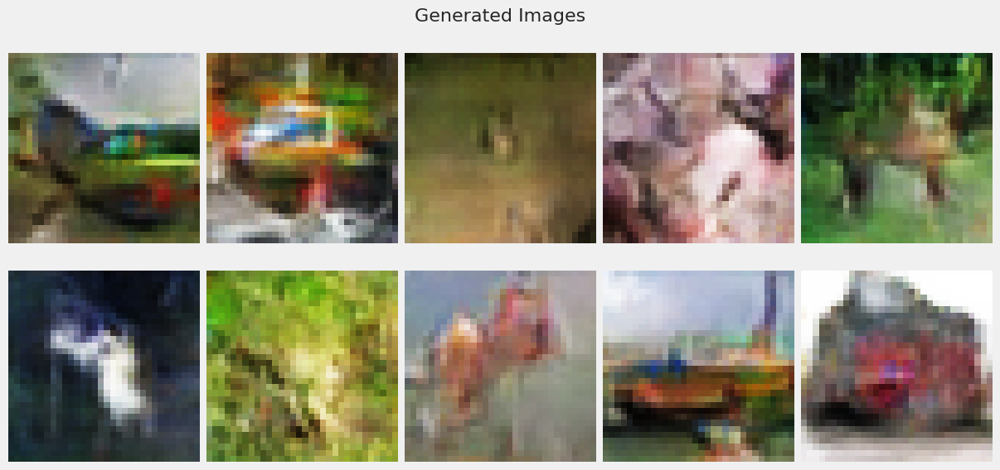

782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.2424 - d_fake_loss: 0.2424 - g_loss: 3.1834 - d_acc: 0.8978 - d_realO: 0.1543 - d_fakeO: 0.8462
Epoch 32/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2384 - d_fake_loss: 0.2384 - g_loss: 3.2784 - d_acc: 0.8985 - d_realO: 0.1513 - d_fakeO: 0.8490
Epoch 33/100
782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.2302 - d_fake_loss: 0.2302 - g_loss: 3.3526 - d_acc: 0.9041 - d_realO: 0.1459 - d_fakeO: 0.8548
Epoch 34/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2397 - d_fake_loss: 0.2397 - g_loss: 3.3934 - d_acc: 0.9017 - d_realO: 0.1472 - d_fakeO: 0.8532
Epoch 35/100
782/782 [==============================] - 8s 11ms/step - d_real_loss: 0.2147 - d_fake_loss: 0.2147 - g_loss: 3.5253 - d_acc: 0.9113 - d_realO: 0.1369 - d_fakeO: 0.8622
Epoch 36/100
782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.2217 - d_fake_

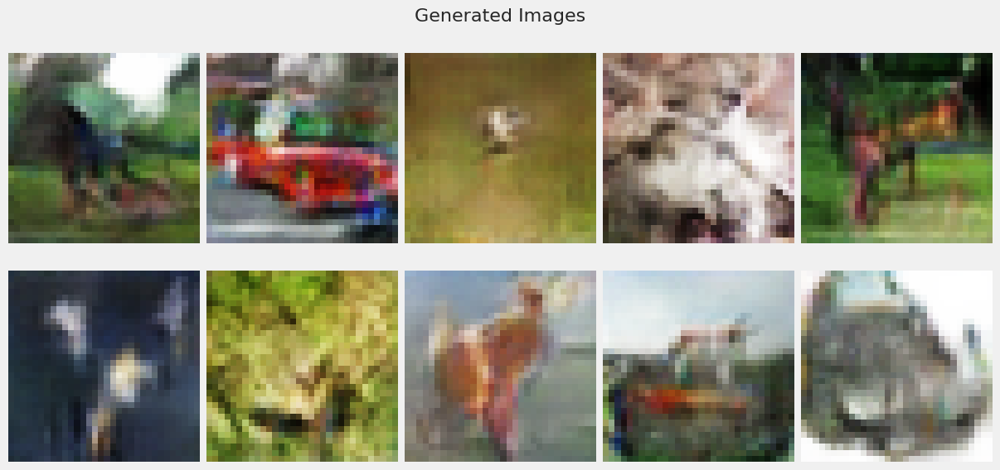

782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1977 - d_fake_loss: 0.1977 - g_loss: 3.9857 - d_acc: 0.9193 - d_realO: 0.1229 - d_fakeO: 0.8772
Epoch 42/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1905 - d_fake_loss: 0.1905 - g_loss: 4.1264 - d_acc: 0.9229 - d_realO: 0.1179 - d_fakeO: 0.8823
Epoch 43/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1878 - d_fake_loss: 0.1878 - g_loss: 4.1641 - d_acc: 0.9247 - d_realO: 0.1157 - d_fakeO: 0.8846
Epoch 44/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.1848 - d_fake_loss: 0.1848 - g_loss: 4.2045 - d_acc: 0.9272 - d_realO: 0.1139 - d_fakeO: 0.8865
Epoch 45/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.1801 - d_fake_loss: 0.1801 - g_loss: 4.2995 - d_acc: 0.9287 - d_realO: 0.1112 - d_fakeO: 0.8891
Epoch 46/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1779 - d_fak

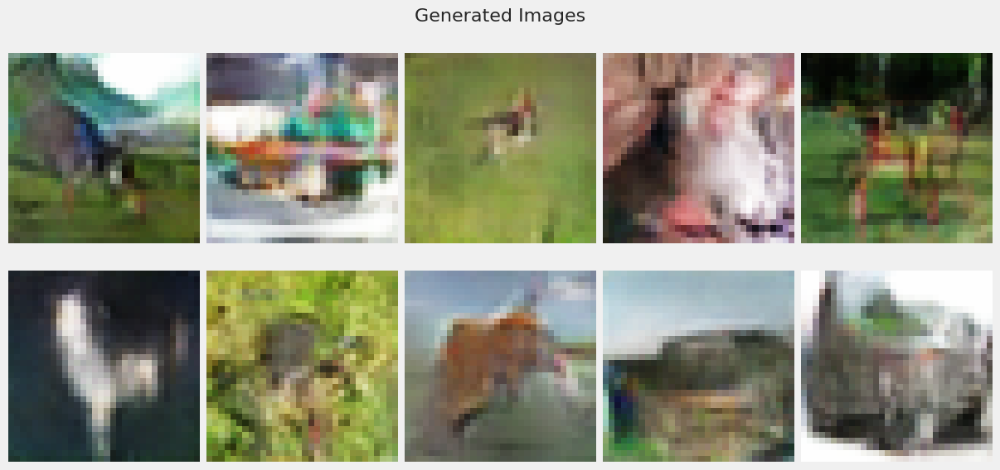

782/782 [==============================] - 6s 7ms/step - d_real_loss: 0.1617 - d_fake_loss: 0.1617 - g_loss: 4.7721 - d_acc: 0.9367 - d_realO: 0.0986 - d_fakeO: 0.9017
Epoch 52/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1587 - d_fake_loss: 0.1587 - g_loss: 4.8381 - d_acc: 0.9368 - d_realO: 0.0976 - d_fakeO: 0.9027
Epoch 53/100
782/782 [==============================] - 5s 7ms/step - d_real_loss: 0.1536 - d_fake_loss: 0.1536 - g_loss: 4.8847 - d_acc: 0.9401 - d_realO: 0.0940 - d_fakeO: 0.9064
Epoch 54/100
782/782 [==============================] - 5s 7ms/step - d_real_loss: 0.1559 - d_fake_loss: 0.1559 - g_loss: 4.9430 - d_acc: 0.9394 - d_realO: 0.0939 - d_fakeO: 0.9060
Epoch 55/100
782/782 [==============================] - 5s 7ms/step - d_real_loss: 0.1567 - d_fake_loss: 0.1567 - g_loss: 4.8888 - d_acc: 0.9395 - d_realO: 0.0945 - d_fakeO: 0.9063
Epoch 56/100
782/782 [==============================] - 5s 7ms/step - d_real_loss: 0.1550 - d_fake_loss: 0.

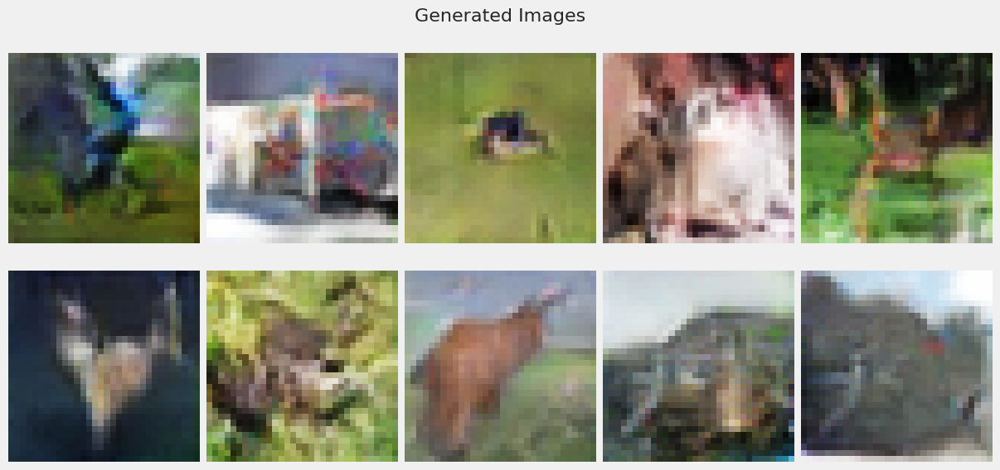

782/782 [==============================] - 6s 8ms/step - d_real_loss: 0.1491 - d_fake_loss: 0.1491 - g_loss: 5.2710 - d_acc: 0.9422 - d_realO: 0.0895 - d_fakeO: 0.9113
Epoch 62/100
782/782 [==============================] - 5s 7ms/step - d_real_loss: 0.1502 - d_fake_loss: 0.1502 - g_loss: 5.2441 - d_acc: 0.9410 - d_realO: 0.0902 - d_fakeO: 0.9104
Epoch 63/100
782/782 [==============================] - 8s 10ms/step - d_real_loss: 0.1433 - d_fake_loss: 0.1433 - g_loss: 5.3052 - d_acc: 0.9442 - d_realO: 0.0864 - d_fakeO: 0.9138
Epoch 64/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.1424 - d_fake_loss: 0.1424 - g_loss: 5.3953 - d_acc: 0.9450 - d_realO: 0.0858 - d_fakeO: 0.9144
Epoch 65/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1406 - d_fake_loss: 0.1406 - g_loss: 5.4181 - d_acc: 0.9458 - d_realO: 0.0841 - d_fakeO: 0.9163
Epoch 66/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1451 - d_fake_loss

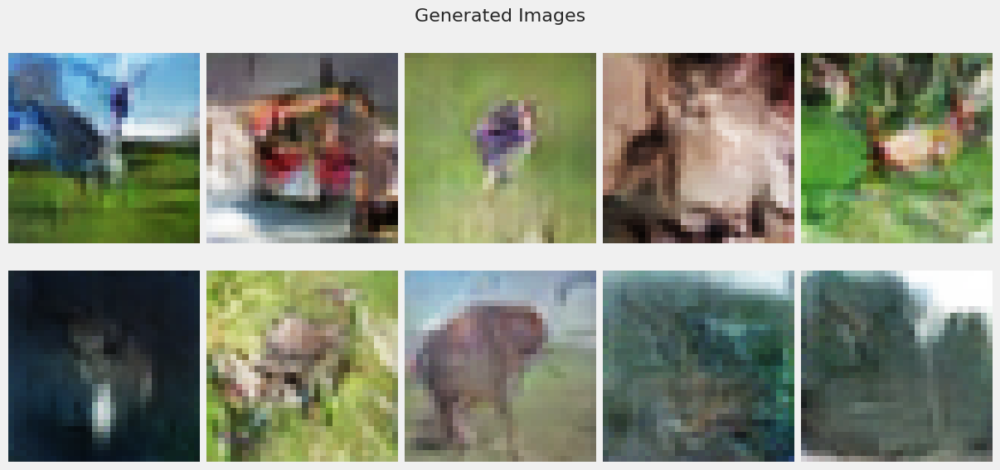

782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1332 - d_fake_loss: 0.1332 - g_loss: 5.6451 - d_acc: 0.9483 - d_realO: 0.0801 - d_fakeO: 0.9203
Epoch 72/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1371 - d_fake_loss: 0.1371 - g_loss: 5.6811 - d_acc: 0.9476 - d_realO: 0.0817 - d_fakeO: 0.9185
Epoch 73/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1329 - d_fake_loss: 0.1329 - g_loss: 5.7666 - d_acc: 0.9502 - d_realO: 0.0781 - d_fakeO: 0.9219
Epoch 74/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1349 - d_fake_loss: 0.1349 - g_loss: 5.7581 - d_acc: 0.9481 - d_realO: 0.0795 - d_fakeO: 0.9208
Epoch 75/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1319 - d_fake_loss: 0.1319 - g_loss: 5.8135 - d_acc: 0.9488 - d_realO: 0.0790 - d_fakeO: 0.9216
Epoch 76/100
782/782 [==============================] - 11s 15ms/step - d_real_loss: 0.1336 - d_fake_

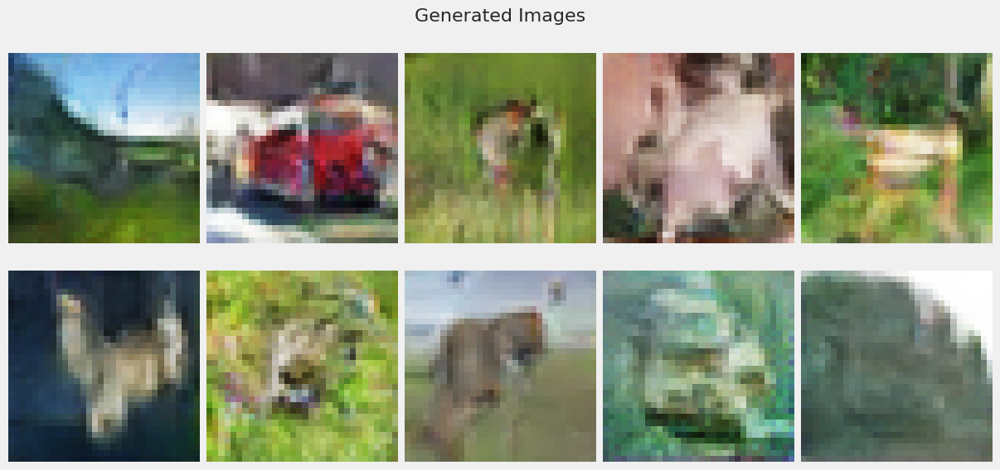

782/782 [==============================] - 12s 16ms/step - d_real_loss: 0.1266 - d_fake_loss: 0.1266 - g_loss: 5.9928 - d_acc: 0.9507 - d_realO: 0.0752 - d_fakeO: 0.9252
Epoch 82/100
782/782 [==============================] - 12s 15ms/step - d_real_loss: 0.1211 - d_fake_loss: 0.1211 - g_loss: 6.0393 - d_acc: 0.9542 - d_realO: 0.0715 - d_fakeO: 0.9288
Epoch 83/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1214 - d_fake_loss: 0.1214 - g_loss: 6.0675 - d_acc: 0.9537 - d_realO: 0.0725 - d_fakeO: 0.9279
Epoch 84/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.1223 - d_fake_loss: 0.1223 - g_loss: 6.0965 - d_acc: 0.9538 - d_realO: 0.0723 - d_fakeO: 0.9284
Epoch 85/100
782/782 [==============================] - 12s 15ms/step - d_real_loss: 0.1221 - d_fake_loss: 0.1221 - g_loss: 6.1593 - d_acc: 0.9537 - d_realO: 0.0719 - d_fakeO: 0.9285
Epoch 86/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1177 - d_fake

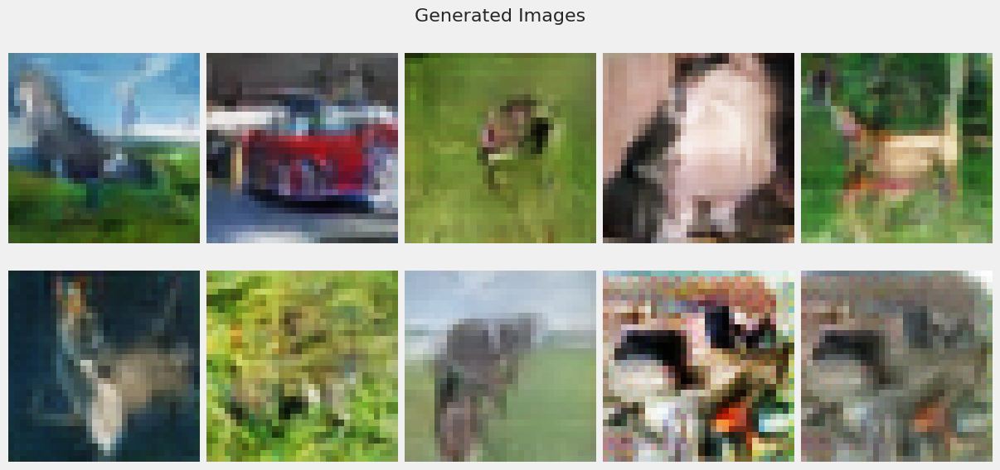

782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.1159 - d_fake_loss: 0.1159 - g_loss: 6.3006 - d_acc: 0.9555 - d_realO: 0.0684 - d_fakeO: 0.9322
Epoch 92/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1195 - d_fake_loss: 0.1195 - g_loss: 6.3457 - d_acc: 0.9551 - d_realO: 0.0701 - d_fakeO: 0.9304
Epoch 93/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1217 - d_fake_loss: 0.1217 - g_loss: 6.3024 - d_acc: 0.9542 - d_realO: 0.0711 - d_fakeO: 0.9295
Epoch 94/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1156 - d_fake_loss: 0.1156 - g_loss: 6.4350 - d_acc: 0.9561 - d_realO: 0.0683 - d_fakeO: 0.9325
Epoch 95/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.1181 - d_fake_loss: 0.1181 - g_loss: 6.3873 - d_acc: 0.9549 - d_realO: 0.0689 - d_fakeO: 0.9316
Epoch 96/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1141 - d_fake_

In [35]:
gan_1= train_gan(discriminator_cgan1, generator_cgan1, noise,  dataset, epochs=15, callbacks=callbacks)

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- Looking at the accuracy, we can see that the discriminator ended with a  96% accuracy while it may not be the best, it did show that it is not able to fully determine real and fake as it started from 91%
- No model collapse


</div>

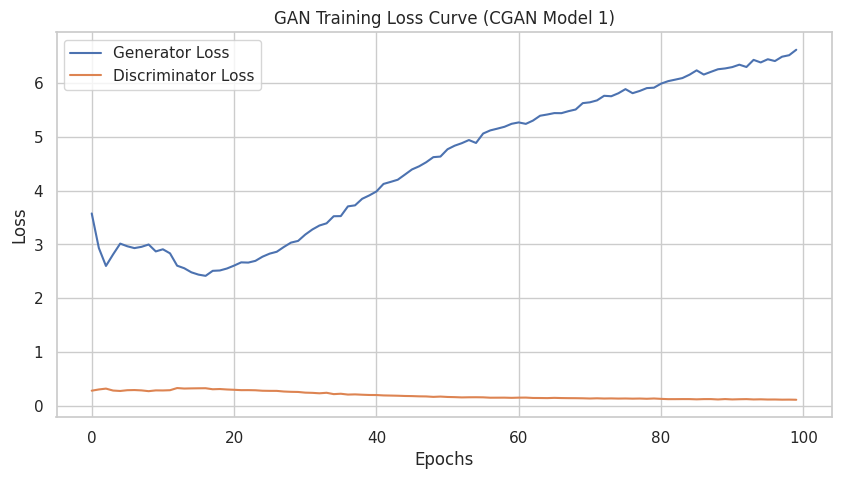

In [36]:
gan_history_1 = gan_1[0].history
generator = gan_1[1].generator  
gan_history_1['d_loss'] = [(real_loss + fake_loss) / 2 for real_loss, fake_loss in zip(gan_history_1['d_real_loss'], gan_history_1['d_fake_loss'])]
evaluator = Evaluation(generator, latent_dim, 512, 10000, 1024)
evaluator.plot_loss_curve(gan_history_1, title='GAN Training Loss Curve (CGAN Model 1)')


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- Discriminator loss
    - For the discriminator loss, it starts relatively low increases sharply
- Generator loss
    - For the generator loss, it drops and proceeded to decrease slowly

</div>

In [37]:
tf.keras.backend.clear_session()
K.clear_session()
scores1 = evaluator.compute_metrics(x_train, cgan=True)
print('FID Score:', scores1[0])
print('KID Score:', scores1[1])

[0 0 0 ... 9 9 9]
313/313 [==============================] - 1s 2ms/step
FID Score: 36.4500941897237
KID Score: 0.020337533910001593


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- FID Score of 36
- KID Score is 0.02
    
It did improve and currently the best model
</div>

#### Visualise the Images

4/4 [==============================] - 0s 16ms/step
Class 0 - 100 Generated Images


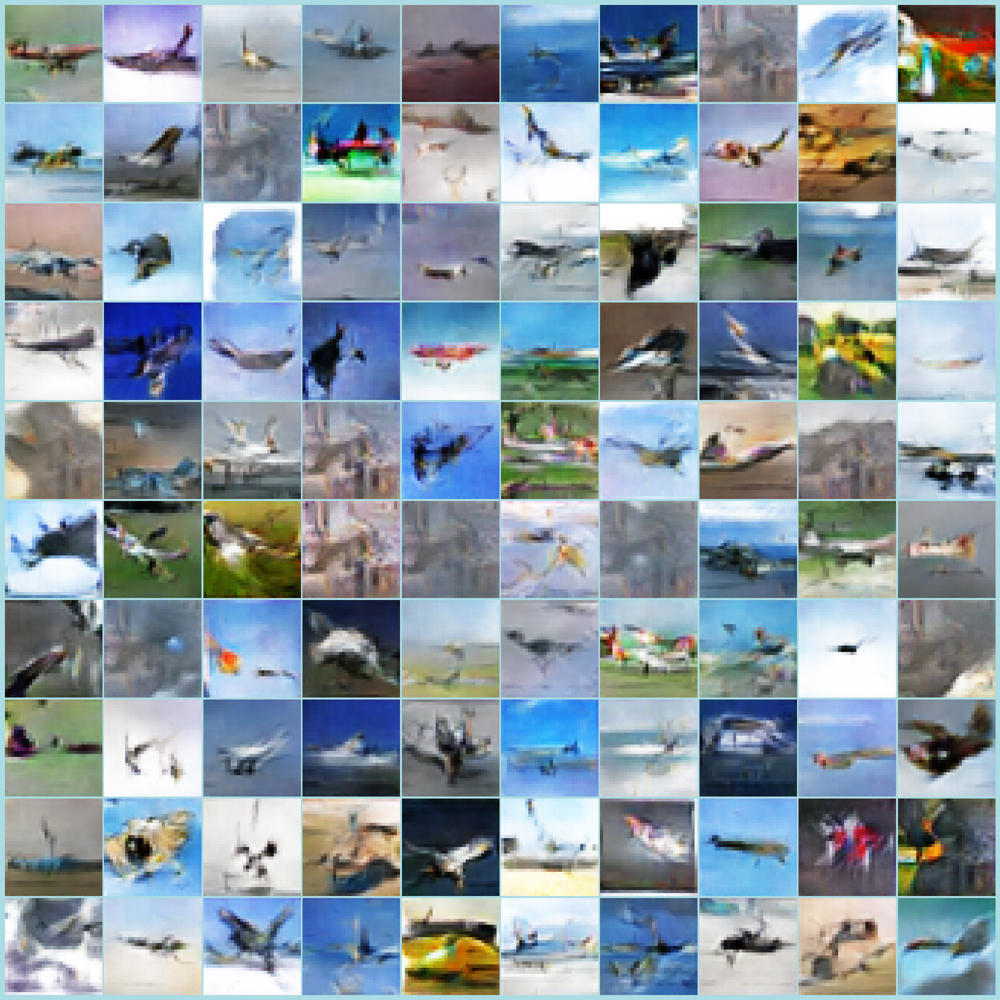

4/4 [==============================] - 0s 2ms/step
Class 1 - 100 Generated Images


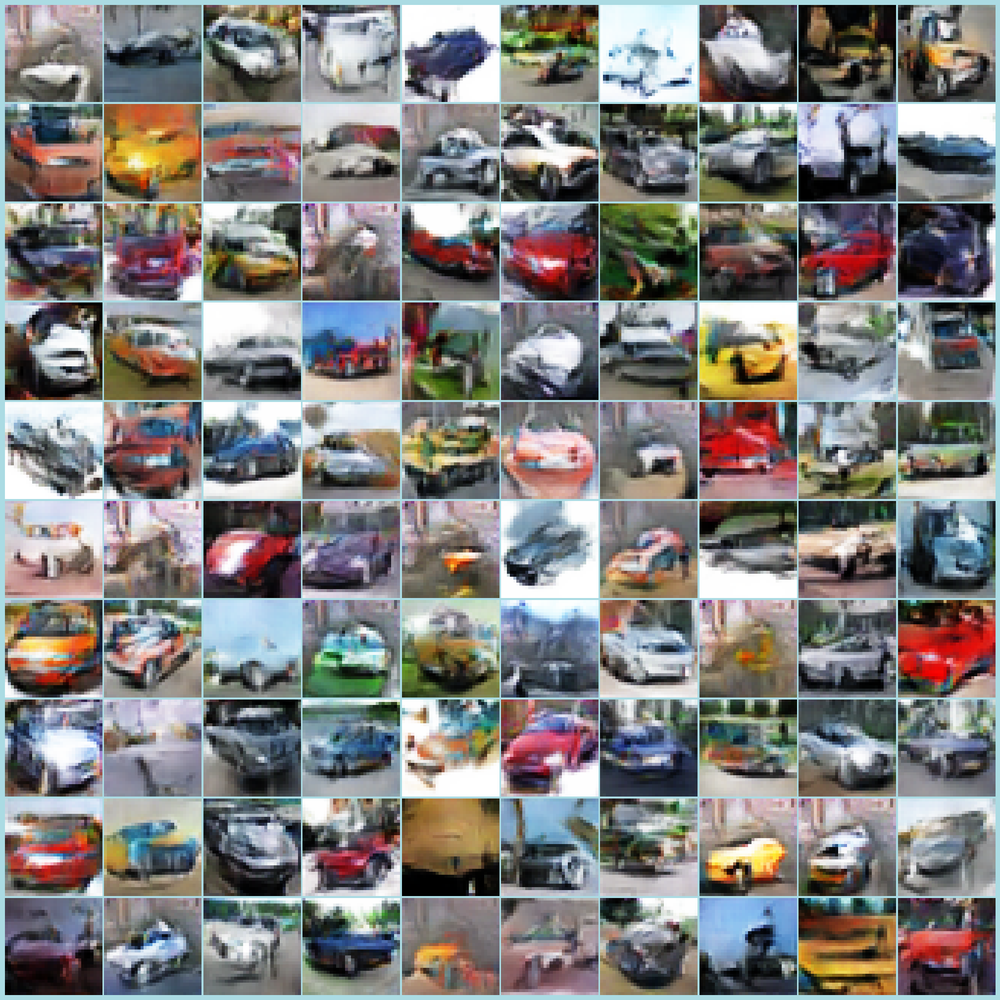

4/4 [==============================] - 0s 2ms/step
Class 2 - 100 Generated Images


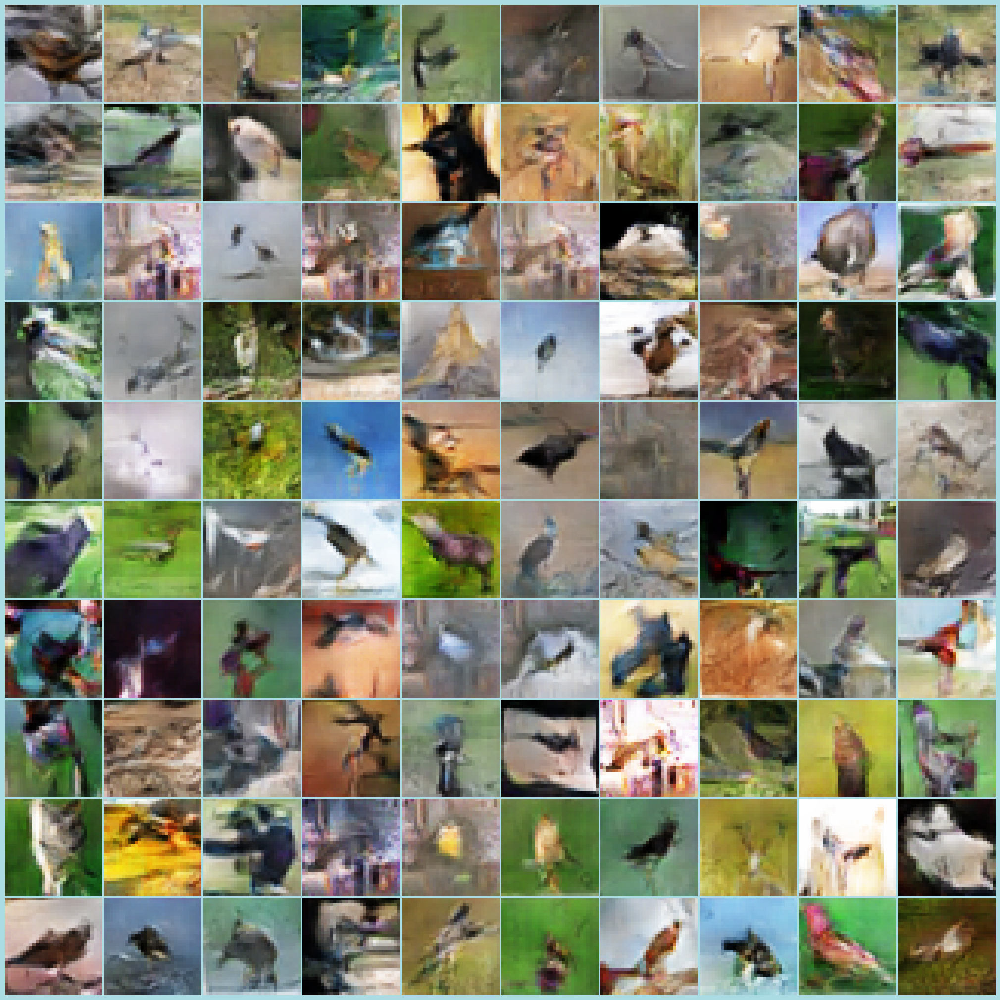

4/4 [==============================] - 0s 3ms/step
Class 3 - 100 Generated Images


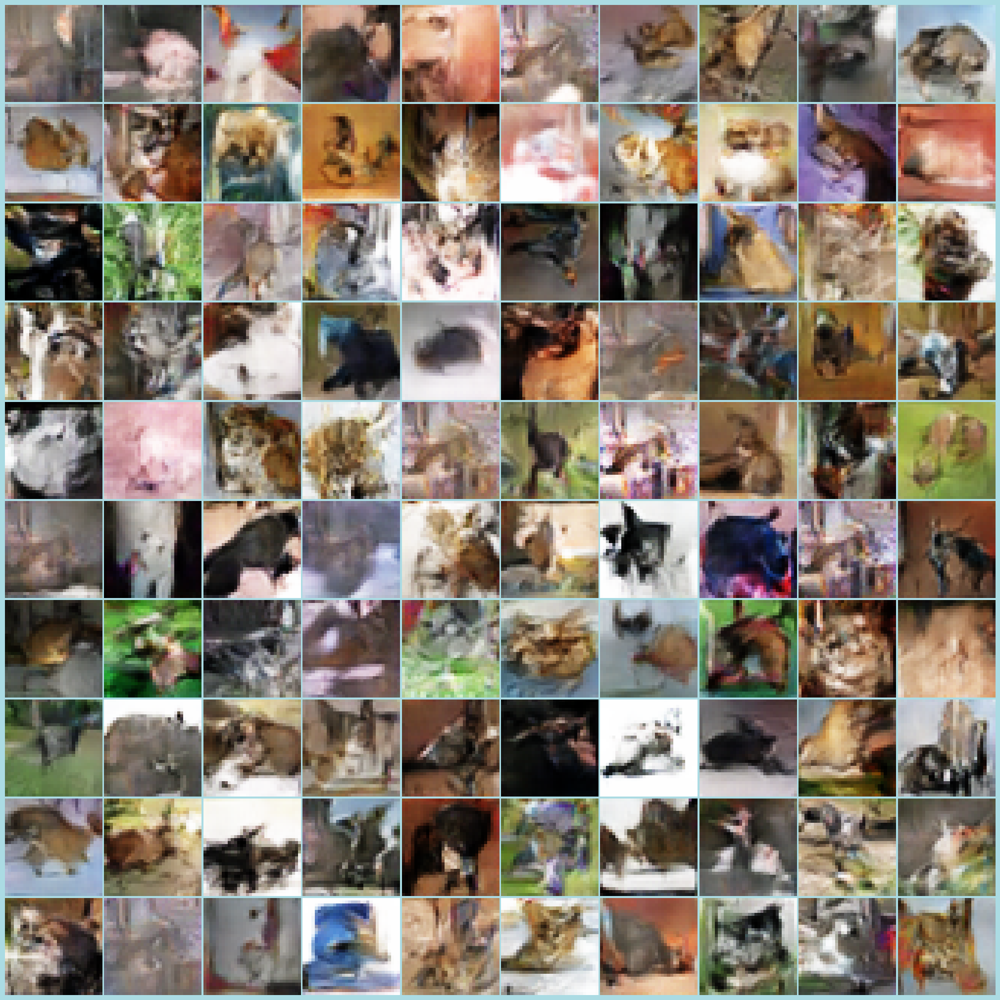

4/4 [==============================] - 0s 2ms/step
Class 4 - 100 Generated Images


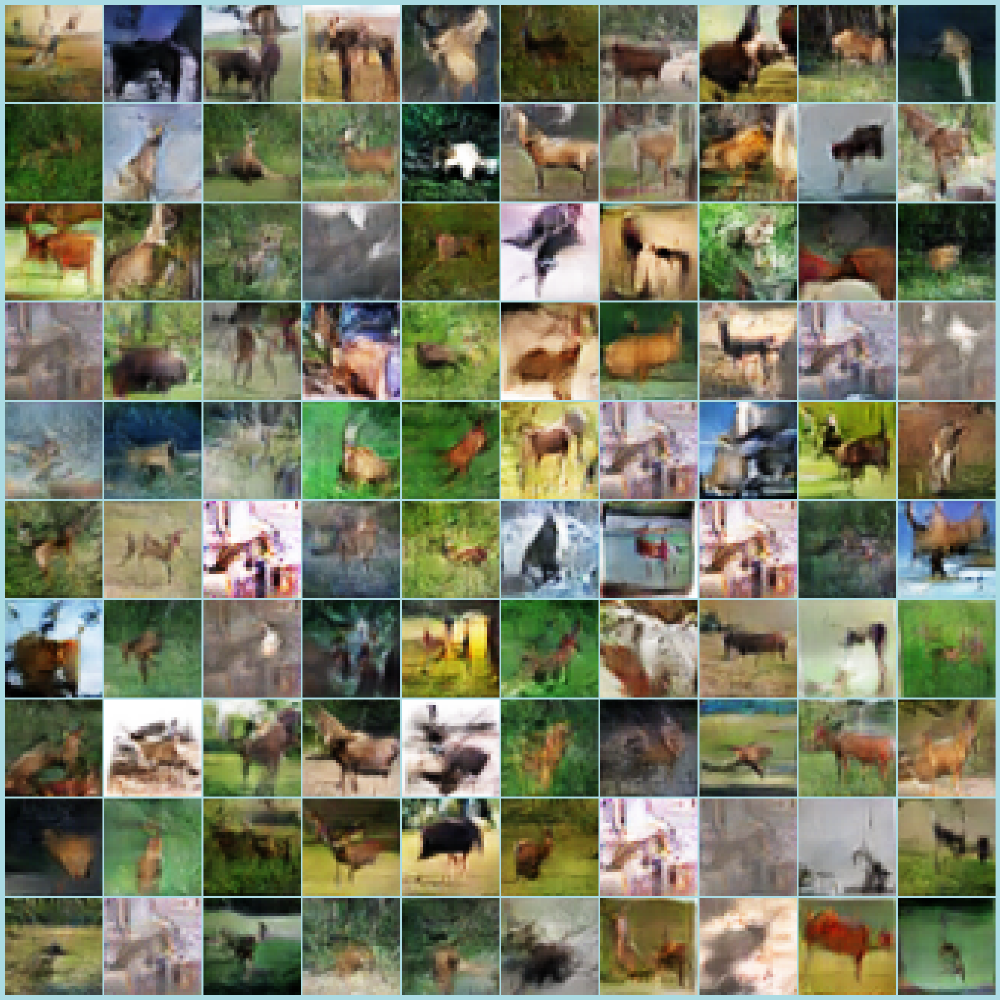

4/4 [==============================] - 0s 2ms/step
Class 5 - 100 Generated Images


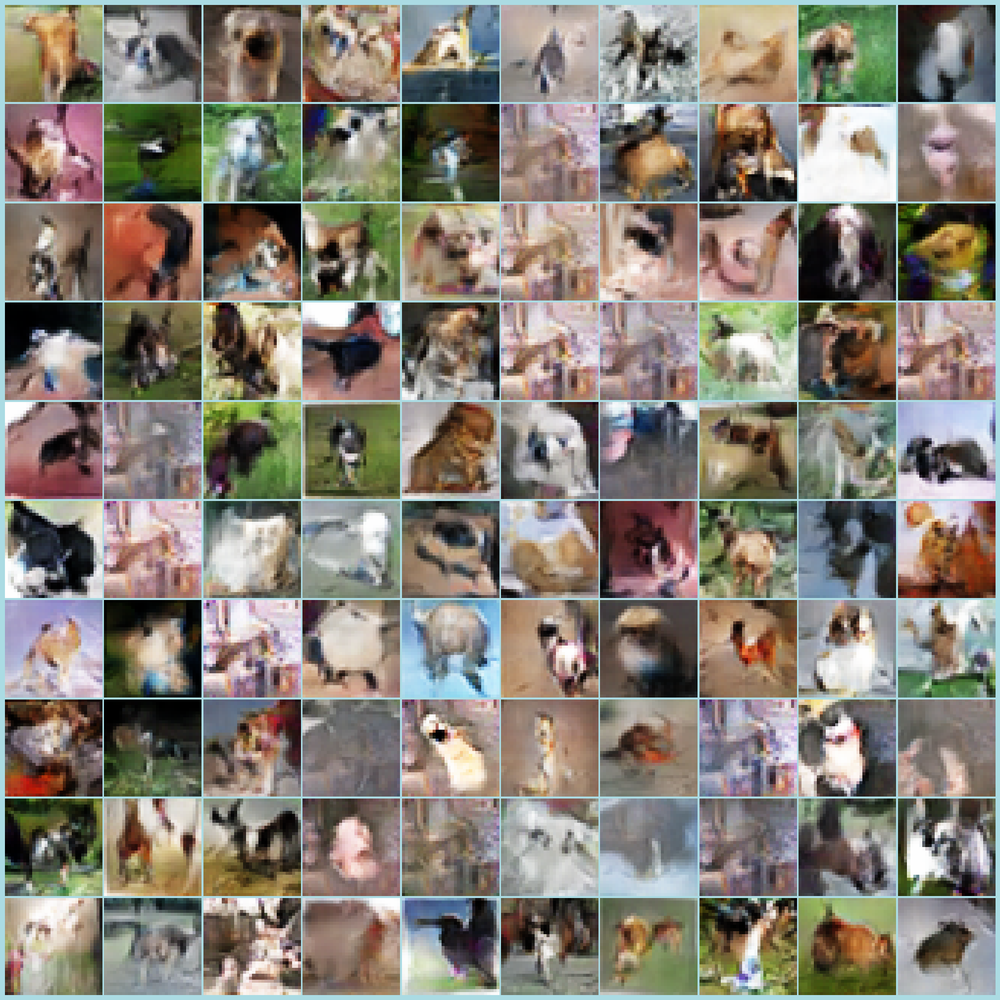

4/4 [==============================] - 0s 3ms/step
Class 6 - 100 Generated Images


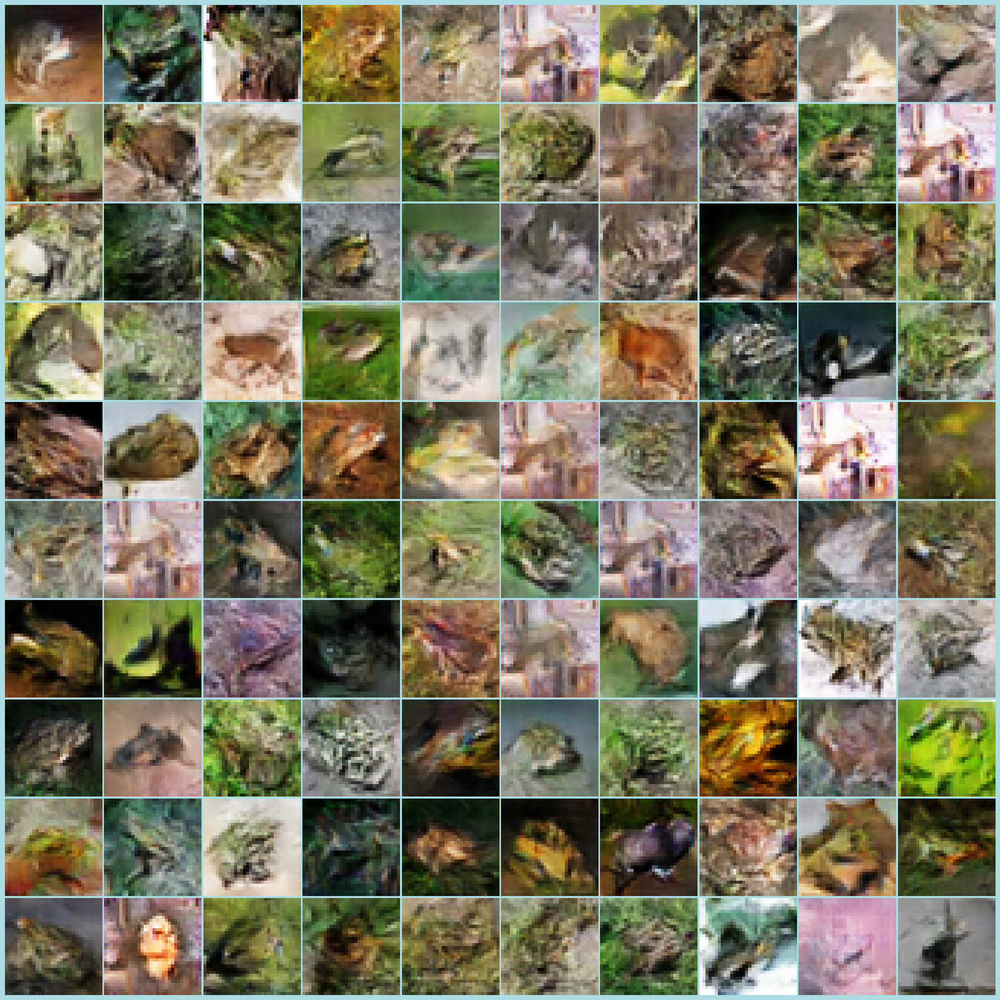

4/4 [==============================] - 0s 2ms/step
Class 7 - 100 Generated Images


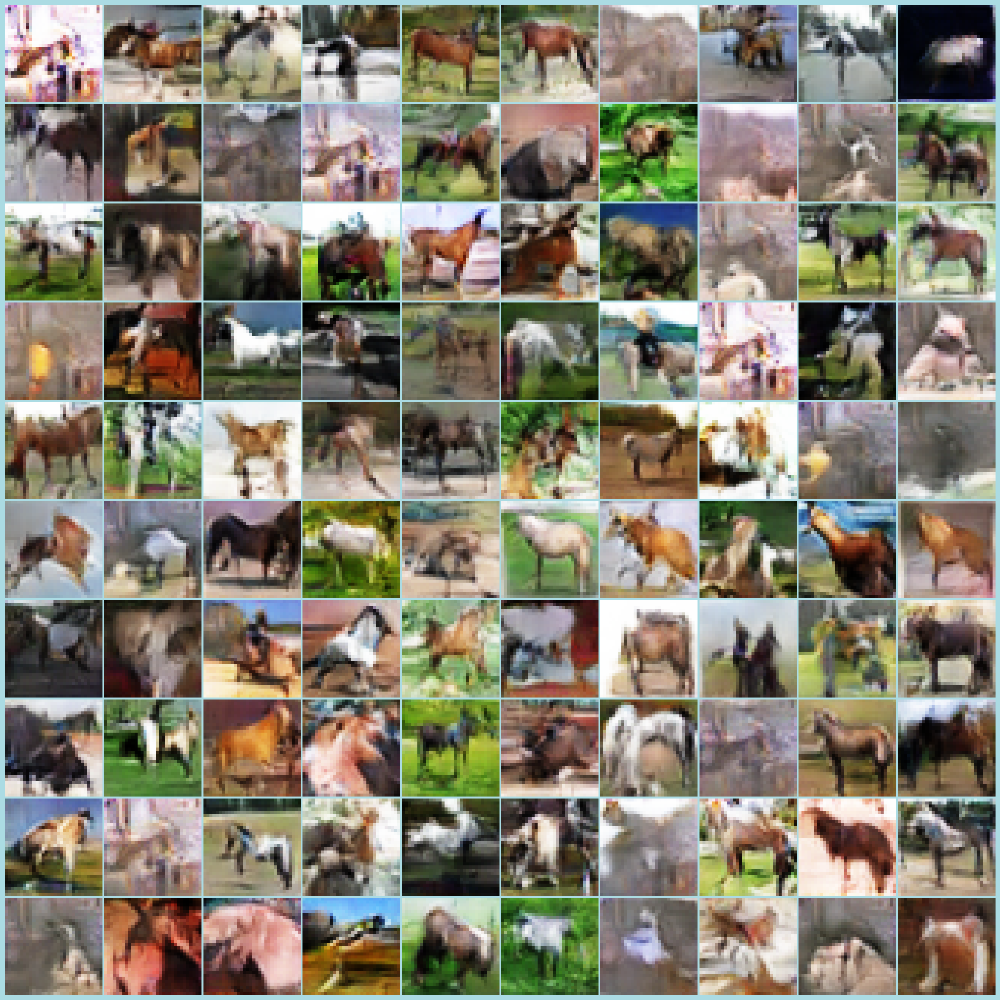

4/4 [==============================] - 0s 2ms/step
Class 8 - 100 Generated Images


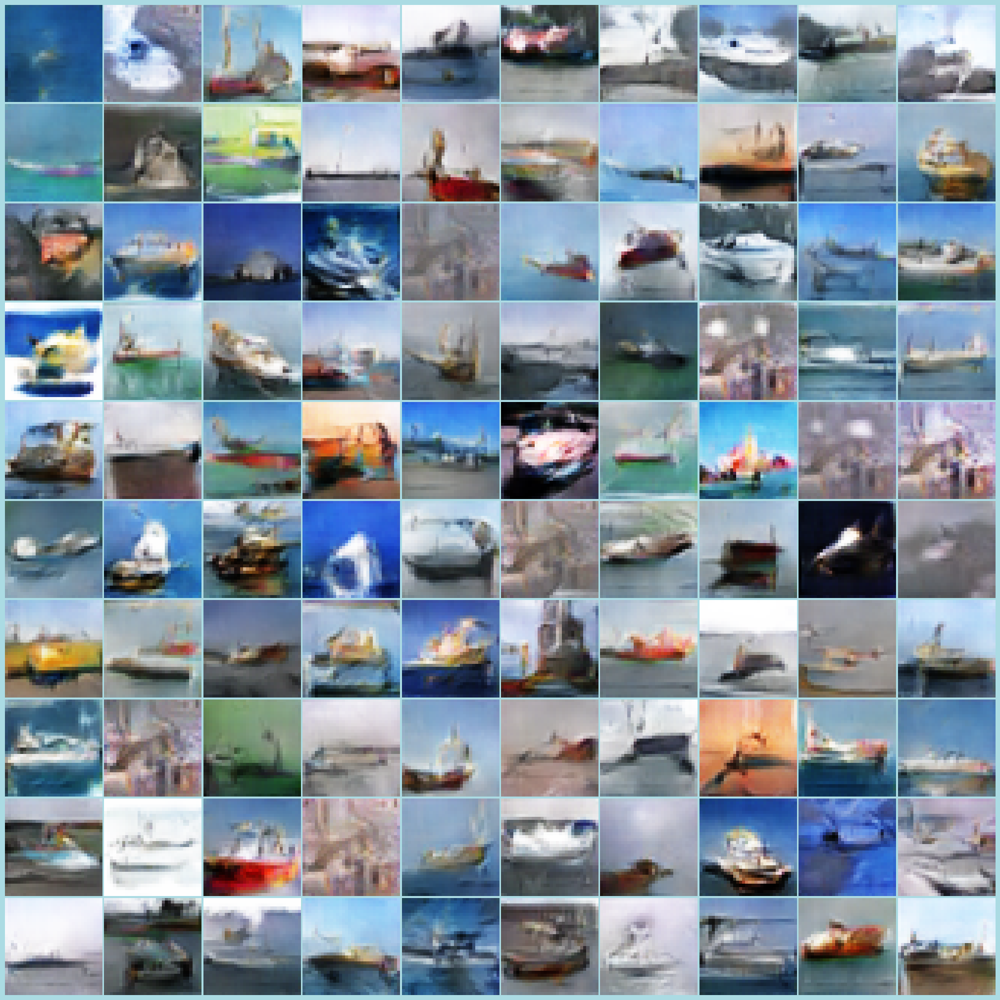

4/4 [==============================] - 0s 2ms/step
Class 9 - 100 Generated Images


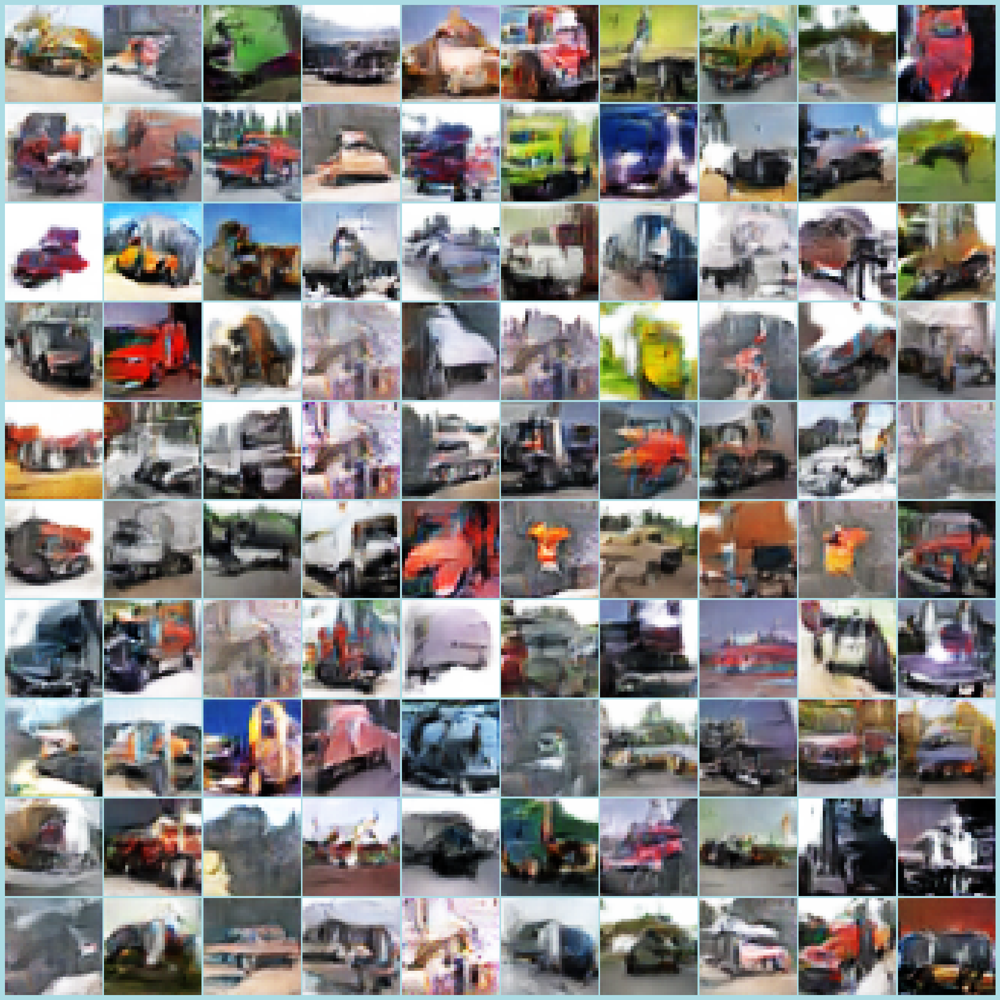

In [38]:
generate_1000_cgan(generator)

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- 1000 images provided similar idea compared to comparing it with a classifier

</div>

#### Storing the scores

In [39]:
new_row = {'Model':'Baseline CGAN 1', 'FID':scores1[0], 'KID': scores1[1], 'd_loss':gan_history_1['d_loss'][-1], 'g_loss':gan_history_1['g_loss'][-1] }
new_df = pd.DataFrame([new_row])
full_scores = pd.concat([full_scores, new_df], ignore_index=True)
full_scores

,Model,FID,KID,d_loss,g_loss
0,Baseline CGAN 1,36.450094,0.020338,0.110001,6.623448


### Second Model

##### Generator

__Key Differences__
1. Use of Spectral Normalization to stabilize the training of the generator.

__Key Ideas__

1. **Input and Dense Layer**:
    - **Dense Layer**: 
        - **Units**: The layer has 2*2*512 units.
        - **Input**: Takes an input of dimension `noise + 10` (noise dimension plus condition vector).
        - **Kernel Initializer**: Utilizes `RandomNormal` with a mean of 0 and a standard deviation of 0.02 for weight initialization.
    - **BatchNormalization**: 
        - **Momentum**: Utilizes a momentum factor of 0.8.
    - **PReLU Activation**: Advanced activation function that allows the model to learn the most beneficial activation pattern.

2. **Transposed Convolution Layers**:
    - **First Conv2DTranspose Layer**:
        - **Filters**: 256.
        - **Kernel Size**: 4x4.
        - **Strides**: 2.
        - **Padding**: 'same'.
        - **Spectral Normalization**: Applied for stabilizing training.
        - **BatchNormalization and PReLU Activation** as above.
    - **Second Conv2DTranspose Layer**:
        - Same as the first layer but with 128 filters.
    - **Third Conv2DTranspose Layer**:
        - Same as above but with 64 filters.


In [40]:
def build_generator_c(noise):
    weights_init = RandomNormal(mean=0, stddev=0.02)
    model = Sequential()

    model.add(Dense(2*2*512, input_dim=noise + 10, activation='relu', kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(PReLU())
    model.add(Reshape((2, 2, 512)))

    model.add(SpectralNormalization(Conv2DTranspose(256, kernel_size=4, strides=2, padding='same', kernel_initializer=weights_init)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(PReLU())

    model.add(SpectralNormalization(Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', kernel_initializer=weights_init)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(PReLU())

    model.add(SpectralNormalization(Conv2DTranspose(64, kernel_size=4, strides=2, padding='same', kernel_initializer=weights_init)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(PReLU())

    model.add(Conv2DTranspose(3, kernel_size=4, strides=2, padding='same', activation='tanh', name='Output_Layer'))

    noise_input = Input(shape=(noise,))
    conditions_input = Input(shape=(10,))
    merged_input = Concatenate()([noise_input, conditions_input])
    generator_output = model(merged_input)

    final_model = Model(inputs=[noise_input, conditions_input], outputs=generator_output, name='generator_cgan_2')
    
    return final_model

##### Discriminator
__Key Ideas__

__Key Ideas__

1. **Input Layers**:
    - **Image Input**: Receives input of shape `image_size`, representing the real or generated images.
    - **Conditions Input**: Receives a 10-dimensional condition vector.

2. **Convolutional Layers**:
    - Sequentially apply convolutional layers with increasing filter sizes (64, 128, 256, 512).
    - **Kernel Size**: 4x4 for all convolutional layers.
    - **Strides**: 2 for all convolutional layers, reducing the spatial dimensions by half each time.
    - **Padding**: 'same', ensuring the output dimensions are only affected by the strides.
    - **BatchNormalization**: Applied after each convolutional layer with a momentum of 0.8.
    - **LeakyReLU Activation**: Utilizes an alpha value of 0.2 for allowing a small gradient when the unit is inactive, promoting gradient flow during training.

3. **GlobalAveragePooling2D Layer**:
    - Reduces the spatial dimensions to a single 512-dimensional vector per image.

4. **Merged Layer**:
    - **Concatenate**: Merges the feature representation from the GlobalAveragePooling2D layer with the condition vector.


In [41]:
def build_discriminator_c(image_size):
    img_input = Input(shape=image_size, name='Image_Input')
    weights_init = RandomNormal(mean=0, stddev=0.02)
    conditions = Input(shape=(10,), name='Conditions_y')

    model = Sequential(name='Inner_Model')
    model.add(Conv2D(64, kernel_size=4, strides=2, padding='same',
               kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, kernel_size=4, strides=2, padding='same',
               kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, kernel_size=4, strides=2, padding='same',
               kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, kernel_size=4, strides=2, padding='same',
               kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))

    model = model(img_input)

    model = GlobalAveragePooling2D()(model)

    merged_layer = Concatenate()([model, conditions])
    model = Dense(512, activation='relu')(merged_layer)
    model = Dense(1, activation='sigmoid', name='Output_Layer')(model)

    model = Model(inputs=[img_input, conditions],
                          outputs=model, name='discriminator_cgan_2')
    return model

#### Creating Checkpoint

In [42]:
callbacks = [CGANImageGenerationCallback(num_img=10, noise=128,  vmin=-1, vmax=1), ModelCheckpointCallback(model_dir='baselineCGAN-2')]

#### Training

In [43]:
discriminator_cgan2 = build_discriminator()
generator_cgan2 = build_generator(128)

In [44]:
tf.keras.backend.clear_session()
K.clear_session()

Epoch 1/100
779/782 [============================>.] - ETA: 0s - d_real_loss: 0.2489 - d_fake_loss: 0.2489 - g_loss: 3.7265 - d_acc: 0.9166 - d_realO: 0.1422 - d_fakeO: 0.8679

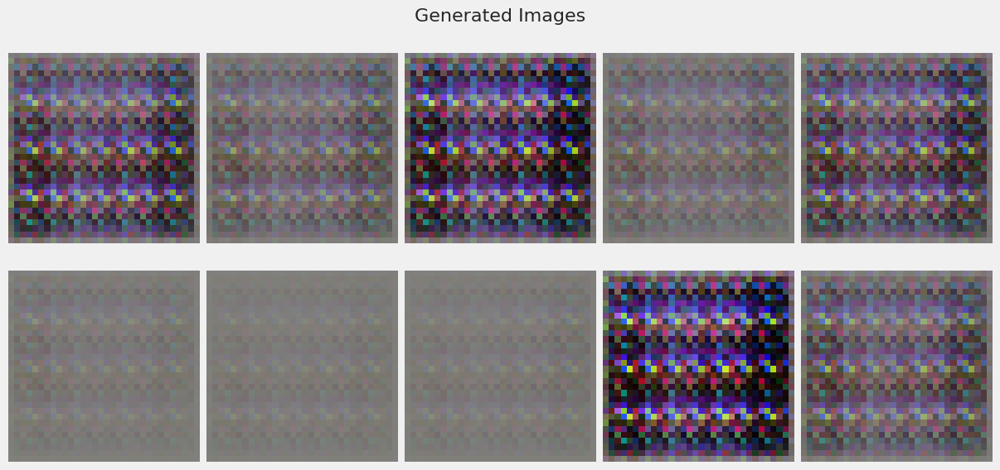

782/782 [==============================] - 12s 13ms/step - d_real_loss: 0.2487 - d_fake_loss: 0.2487 - g_loss: 3.7283 - d_acc: 0.9166 - d_realO: 0.1416 - d_fakeO: 0.8679
Epoch 2/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.2549 - d_fake_loss: 0.2549 - g_loss: 3.5038 - d_acc: 0.9108 - d_realO: 0.1470 - d_fakeO: 0.8514
Epoch 3/100
782/782 [==============================] - 12s 15ms/step - d_real_loss: 0.2751 - d_fake_loss: 0.2751 - g_loss: 2.9931 - d_acc: 0.8980 - d_realO: 0.1649 - d_fakeO: 0.8323
Epoch 4/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2803 - d_fake_loss: 0.2803 - g_loss: 2.8242 - d_acc: 0.8930 - d_realO: 0.1735 - d_fakeO: 0.8291
Epoch 5/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.2697 - d_fake_loss: 0.2697 - g_loss: 2.9834 - d_acc: 0.8940 - d_realO: 0.1696 - d_fakeO: 0.8351
Epoch 6/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2851 - d_fake_loss

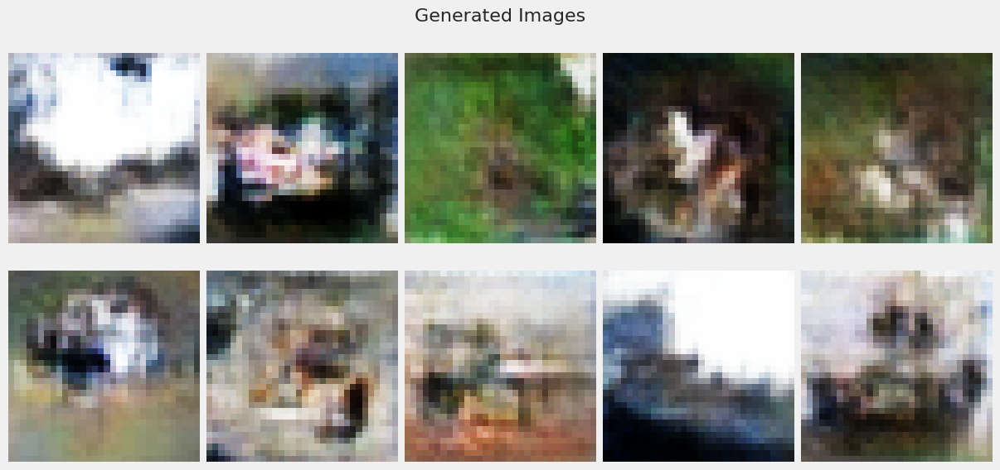

782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.3024 - d_fake_loss: 0.3024 - g_loss: 2.6973 - d_acc: 0.8724 - d_realO: 0.1898 - d_fakeO: 0.8100
Epoch 12/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.3004 - d_fake_loss: 0.3004 - g_loss: 2.6708 - d_acc: 0.8706 - d_realO: 0.1916 - d_fakeO: 0.8086
Epoch 13/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.3203 - d_fake_loss: 0.3203 - g_loss: 2.5155 - d_acc: 0.8611 - d_realO: 0.2031 - d_fakeO: 0.7975
Epoch 14/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.3184 - d_fake_loss: 0.3184 - g_loss: 2.4634 - d_acc: 0.8610 - d_realO: 0.2040 - d_fakeO: 0.7970
Epoch 15/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.3103 - d_fake_loss: 0.3103 - g_loss: 2.5119 - d_acc: 0.8653 - d_realO: 0.1993 - d_fakeO: 0.8019
Epoch 16/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.3304 - d_fake_

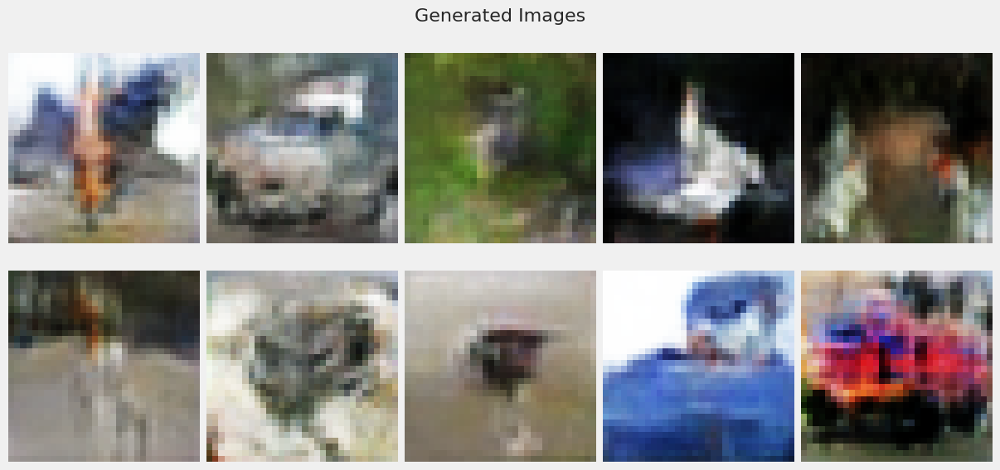

782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2955 - d_fake_loss: 0.2955 - g_loss: 2.5796 - d_acc: 0.8741 - d_realO: 0.1871 - d_fakeO: 0.8137
Epoch 22/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2826 - d_fake_loss: 0.2826 - g_loss: 2.6823 - d_acc: 0.8786 - d_realO: 0.1800 - d_fakeO: 0.8208
Epoch 23/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2726 - d_fake_loss: 0.2726 - g_loss: 2.7645 - d_acc: 0.8827 - d_realO: 0.1745 - d_fakeO: 0.8262
Epoch 24/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2714 - d_fake_loss: 0.2714 - g_loss: 2.8267 - d_acc: 0.8839 - d_realO: 0.1720 - d_fakeO: 0.8291
Epoch 25/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2923 - d_fake_loss: 0.2923 - g_loss: 2.7257 - d_acc: 0.8741 - d_realO: 0.1850 - d_fakeO: 0.8146
Epoch 26/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2691 - d_fake_los

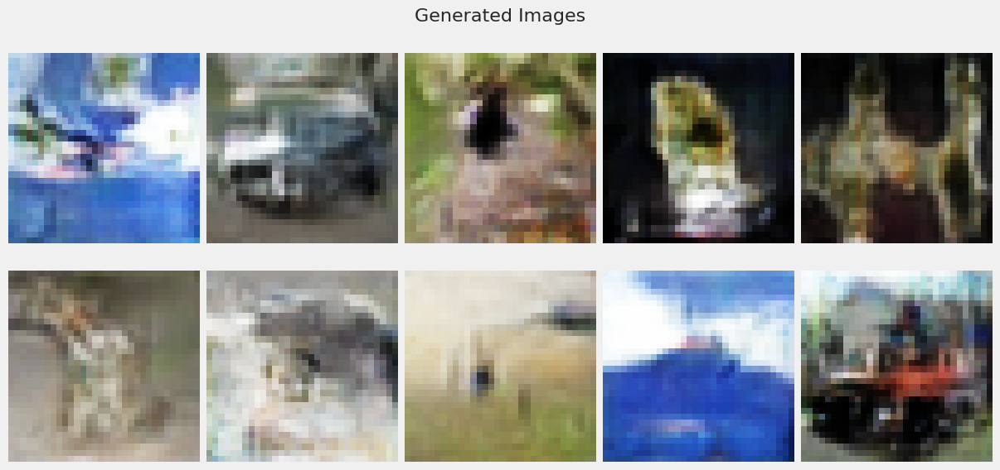

782/782 [==============================] - 11s 15ms/step - d_real_loss: 0.2452 - d_fake_loss: 0.2452 - g_loss: 3.1346 - d_acc: 0.8962 - d_realO: 0.1564 - d_fakeO: 0.8440
Epoch 32/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2506 - d_fake_loss: 0.2506 - g_loss: 3.1640 - d_acc: 0.8946 - d_realO: 0.1583 - d_fakeO: 0.8425
Epoch 33/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2394 - d_fake_loss: 0.2394 - g_loss: 3.2839 - d_acc: 0.8996 - d_realO: 0.1516 - d_fakeO: 0.8486
Epoch 34/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2340 - d_fake_loss: 0.2340 - g_loss: 3.3359 - d_acc: 0.9024 - d_realO: 0.1477 - d_fakeO: 0.8534
Epoch 35/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2277 - d_fake_loss: 0.2277 - g_loss: 3.4277 - d_acc: 0.9055 - d_realO: 0.1435 - d_fakeO: 0.8567
Epoch 36/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.2245 - d_fake_l

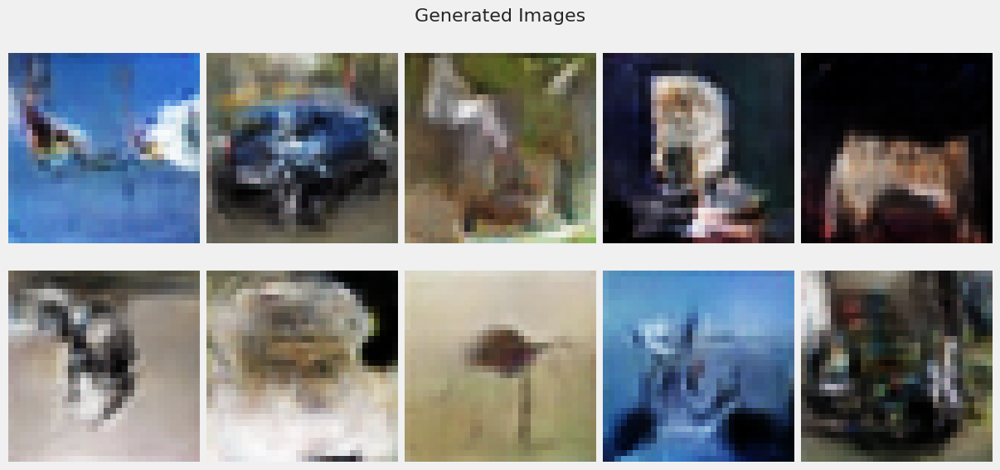

782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.2002 - d_fake_loss: 0.2002 - g_loss: 3.9111 - d_acc: 0.9181 - d_realO: 0.1249 - d_fakeO: 0.8758
Epoch 42/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1994 - d_fake_loss: 0.1994 - g_loss: 3.9099 - d_acc: 0.9187 - d_realO: 0.1241 - d_fakeO: 0.8761
Epoch 43/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1943 - d_fake_loss: 0.1943 - g_loss: 3.9949 - d_acc: 0.9218 - d_realO: 0.1209 - d_fakeO: 0.8794
Epoch 44/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1957 - d_fake_loss: 0.1957 - g_loss: 4.0507 - d_acc: 0.9208 - d_realO: 0.1208 - d_fakeO: 0.8794
Epoch 45/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1965 - d_fake_loss: 0.1965 - g_loss: 4.0537 - d_acc: 0.9208 - d_realO: 0.1211 - d_fakeO: 0.8796
Epoch 46/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1897 - d_fake_l

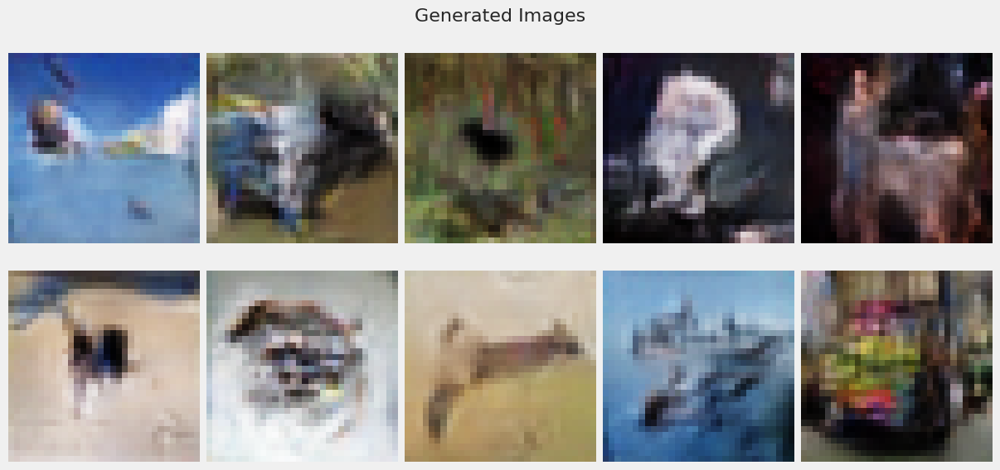

782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1727 - d_fake_loss: 0.1727 - g_loss: 4.4841 - d_acc: 0.9305 - d_realO: 0.1063 - d_fakeO: 0.8940
Epoch 52/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1678 - d_fake_loss: 0.1678 - g_loss: 4.5715 - d_acc: 0.9327 - d_realO: 0.1034 - d_fakeO: 0.8974
Epoch 53/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1694 - d_fake_loss: 0.1694 - g_loss: 4.5968 - d_acc: 0.9331 - d_realO: 0.1036 - d_fakeO: 0.8966
Epoch 54/100
782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.1703 - d_fake_loss: 0.1703 - g_loss: 4.6150 - d_acc: 0.9325 - d_realO: 0.1034 - d_fakeO: 0.8972
Epoch 55/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1627 - d_fake_loss: 0.1627 - g_loss: 4.7030 - d_acc: 0.9351 - d_realO: 0.1004 - d_fakeO: 0.9001
Epoch 56/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1706 - d_fake_l

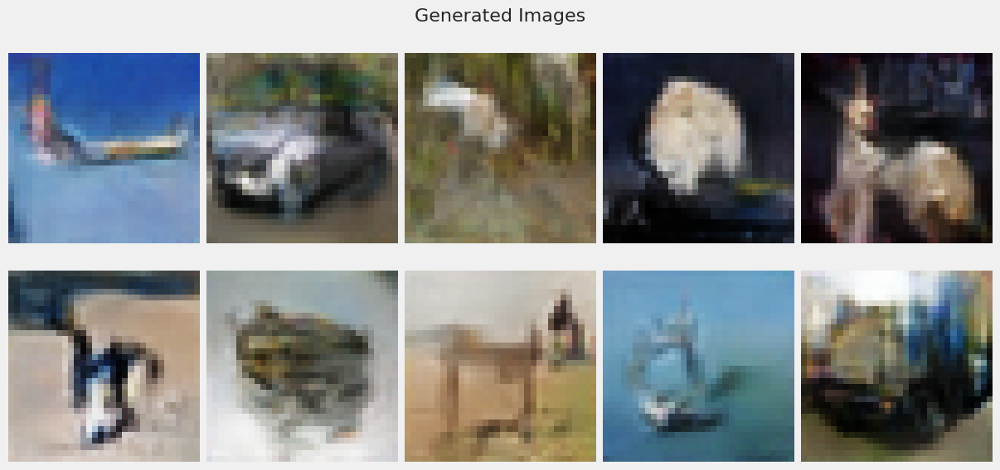

782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1523 - d_fake_loss: 0.1523 - g_loss: 5.0042 - d_acc: 0.9411 - d_realO: 0.0921 - d_fakeO: 0.9083
Epoch 62/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.1514 - d_fake_loss: 0.1514 - g_loss: 5.0870 - d_acc: 0.9413 - d_realO: 0.0914 - d_fakeO: 0.9092
Epoch 63/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1541 - d_fake_loss: 0.1541 - g_loss: 5.0679 - d_acc: 0.9396 - d_realO: 0.0929 - d_fakeO: 0.9077
Epoch 64/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1469 - d_fake_loss: 0.1469 - g_loss: 5.1615 - d_acc: 0.9432 - d_realO: 0.0896 - d_fakeO: 0.9108
Epoch 65/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1526 - d_fake_loss: 0.1526 - g_loss: 5.2040 - d_acc: 0.9397 - d_realO: 0.0913 - d_fakeO: 0.9091
Epoch 66/100
782/782 [==============================] - 12s 15ms/step - d_real_loss: 0.1435 - d_fake

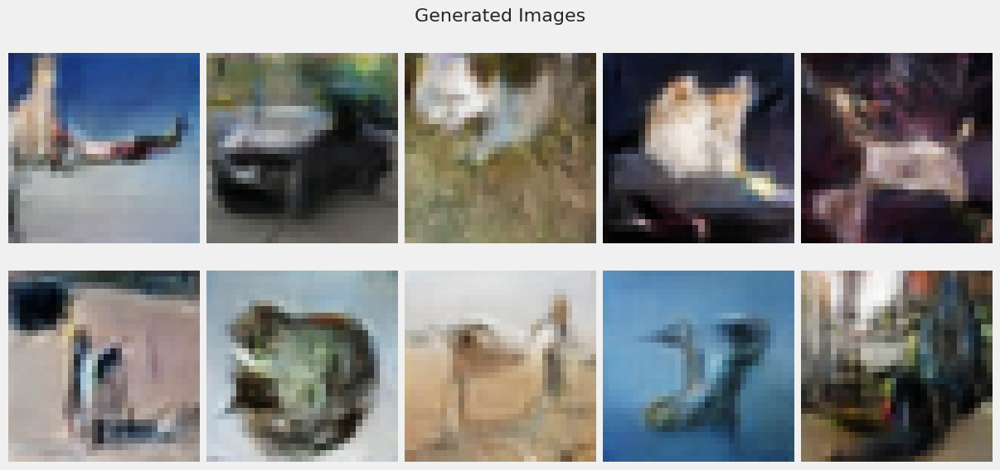

782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1399 - d_fake_loss: 0.1399 - g_loss: 5.4028 - d_acc: 0.9459 - d_realO: 0.0838 - d_fakeO: 0.9167
Epoch 72/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1365 - d_fake_loss: 0.1365 - g_loss: 5.5152 - d_acc: 0.9477 - d_realO: 0.0814 - d_fakeO: 0.9189
Epoch 73/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1309 - d_fake_loss: 0.1309 - g_loss: 5.5472 - d_acc: 0.9503 - d_realO: 0.0792 - d_fakeO: 0.9213
Epoch 74/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1358 - d_fake_loss: 0.1358 - g_loss: 5.6146 - d_acc: 0.9479 - d_realO: 0.0807 - d_fakeO: 0.9198
Epoch 75/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.1324 - d_fake_loss: 0.1324 - g_loss: 5.6883 - d_acc: 0.9487 - d_realO: 0.0793 - d_fakeO: 0.9213
Epoch 76/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1306 - d_fake_l

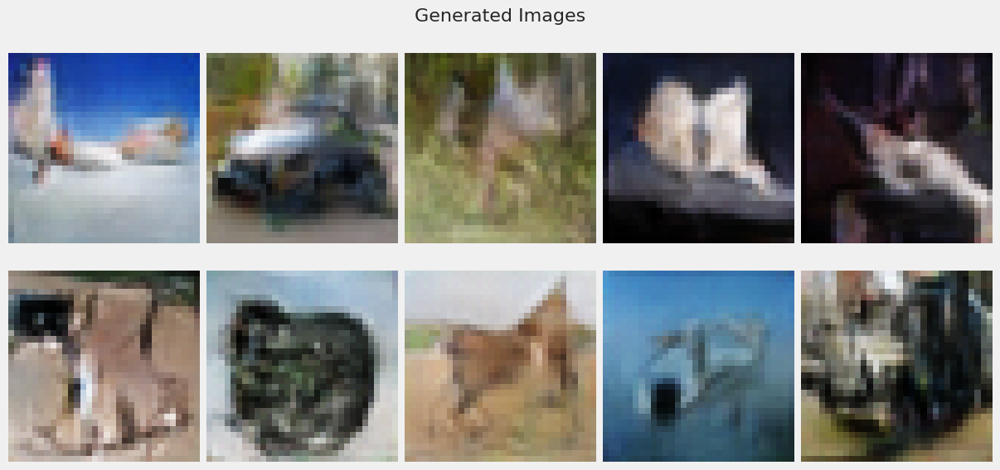

782/782 [==============================] - 12s 16ms/step - d_real_loss: 0.1256 - d_fake_loss: 0.1256 - g_loss: 5.8589 - d_acc: 0.9527 - d_realO: 0.0739 - d_fakeO: 0.9267
Epoch 82/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.1264 - d_fake_loss: 0.1264 - g_loss: 5.8714 - d_acc: 0.9519 - d_realO: 0.0746 - d_fakeO: 0.9259
Epoch 83/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1228 - d_fake_loss: 0.1228 - g_loss: 6.0069 - d_acc: 0.9533 - d_realO: 0.0728 - d_fakeO: 0.9275
Epoch 84/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1160 - d_fake_loss: 0.1160 - g_loss: 6.0831 - d_acc: 0.9562 - d_realO: 0.0694 - d_fakeO: 0.9312
Epoch 85/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1250 - d_fake_loss: 0.1250 - g_loss: 6.0192 - d_acc: 0.9528 - d_realO: 0.0729 - d_fakeO: 0.9274
Epoch 86/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1218 - d_fake_l

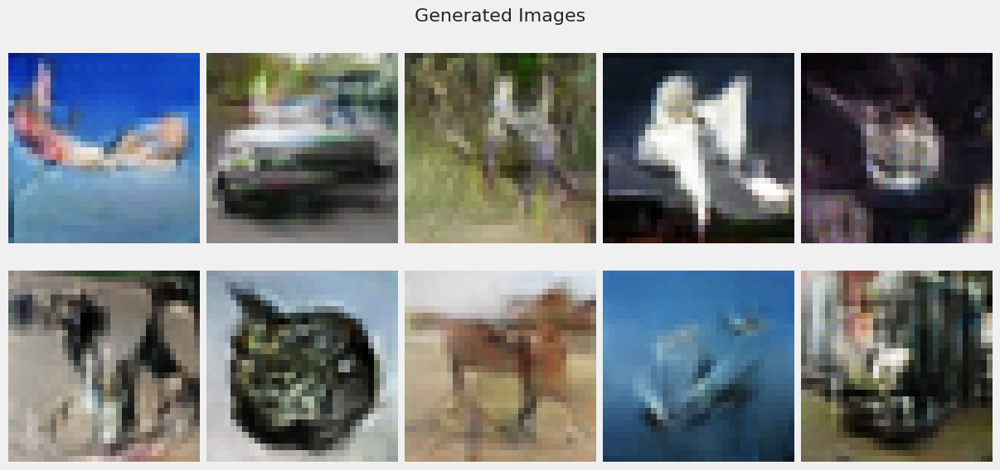

782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1117 - d_fake_loss: 0.1117 - g_loss: 6.2727 - d_acc: 0.9579 - d_realO: 0.0662 - d_fakeO: 0.9345
Epoch 92/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1167 - d_fake_loss: 0.1167 - g_loss: 6.3048 - d_acc: 0.9559 - d_realO: 0.0675 - d_fakeO: 0.9328
Epoch 93/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1156 - d_fake_loss: 0.1156 - g_loss: 6.3032 - d_acc: 0.9564 - d_realO: 0.0674 - d_fakeO: 0.9333
Epoch 94/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1185 - d_fake_loss: 0.1185 - g_loss: 6.2651 - d_acc: 0.9552 - d_realO: 0.0688 - d_fakeO: 0.9314
Epoch 95/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1177 - d_fake_loss: 0.1177 - g_loss: 6.2782 - d_acc: 0.9556 - d_realO: 0.0687 - d_fakeO: 0.9320
Epoch 96/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1121 - d_fake_lo

In [45]:
gan_2= train_gan(discriminator_cgan2, generator_cgan2, noise, 'Baseline CGAN 2', dataset, callbacks=callbacks)

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- Looking at the accuracy, we can see that the discriminator ended with a  95% 
- No model collapse


</div>

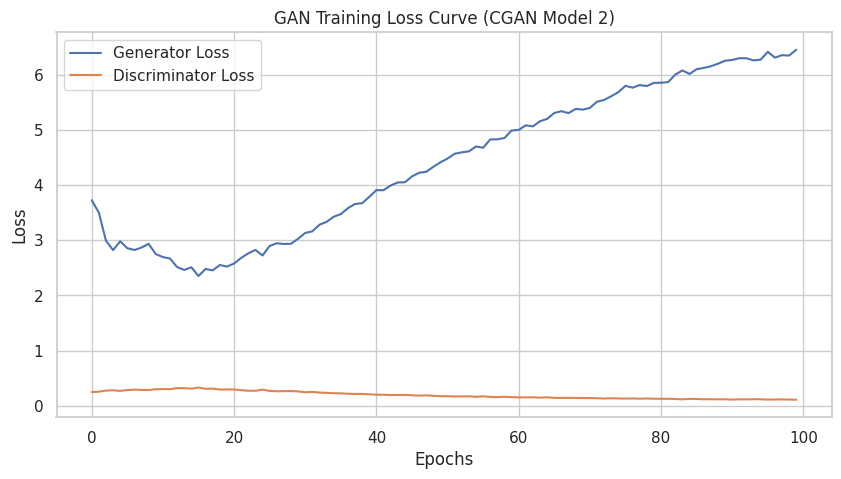

In [46]:
gan_history_2 = gan_2[0].history
generator = gan_2[1].generator  
gan_history_2['d_loss'] = [(real_loss + fake_loss) / 2 for real_loss, fake_loss in zip(gan_history_2['d_real_loss'], gan_history_2['d_fake_loss'])]
evaluator = Evaluation(generator, latent_dim, 512, 10000, 1024)
evaluator.plot_loss_curve(gan_history_2, title='GAN Training Loss Curve (CGAN Model 2)')

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- Discriminator loss
    - For the discriminator loss, it starts relatively low and rises quickly and continues to increase steadily as the epochs increases
- Generator loss
    - For the generator loss, it maintains pretty constant here


</div>

In [47]:
tf.keras.backend.clear_session()
K.clear_session()
scores1 = evaluator.compute_metrics(x_train, cgan=True)
print('FID Score:', scores1[0])
print('KID Score:', scores1[1])

[0 0 0 ... 9 9 9]
313/313 [==============================] - 1s 2ms/step
FID Score: 38.60990676971198
KID Score: 0.023634487098442403


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- FID Score of 39
- KID Score is 0.02
    
It did not improved further compared to the previous two models

</div>

#### Storing the scores

In [48]:
new_row = {'Model':'Baseline CGAN 2', 'FID':scores1[0], 'KID': scores1[1], 'd_loss':gan_history_2['d_loss'][-1], 'g_loss':gan_history_2['g_loss'][-1] }
new_df = pd.DataFrame([new_row])
full_scores = pd.concat([full_scores, new_df], ignore_index=True)
full_scores

,Model,FID,KID,d_loss,g_loss
0,Baseline CGAN 1,36.450094,0.020338,0.110001,6.623448
1,Baseline CGAN 2,38.609907,0.023634,0.108867,6.457820


### Third Model

##### Generator

__Key Difference__
1. Added skip conntection

__Key Ideas__

1. **Input and Dense Layer**:
    - **Dense Layer**: 
        - **Units**: The layer has 2 * 2 * 512 units
        - **Input**: Takes an input of dimension `latent_dim` representing the latent space
        - **Kernel Initializer**: Utilizes `RandomNormal` with a standard deviation of 0.02 
2. **Reshape Layer**:
    - **New Shape**: Reshapes the output of the Dense layer into an 2x2x512 tensor.

3. **Normalization and Activation**:
    - **Spectral Normalization**
    - **BatchNormalization**: 
    - **PreLu**:
4. **Transposed Convolution Layers**:
    - **Conv2DTranspose (First Layer)**:
        - **Filters**: 256
        - **Kernel Size**: 5x5
        - **Strides**: 2
        - **Padding**: 'same'

    - **Conv2DTranspose (Second Layer)**:
        - **Filters**: 128
        - **Kernel Size**: 5x5
        - **Strides**: 2
        - **Padding**: 'same'

    - **Conv2DTranspose (Third Layer)**:
        - **Filters**: 3 (corresponding to RGB channels)
        - **Kernel Size**: 5x5
        - **Strides**: 2
        - **Padding**: 'same'
        - **Activation**: 'tanh'


In [49]:
def build_generator_c(noise):
    weights_init = RandomNormal(mean=0, stddev=0.02)
    model = Sequential()

    noise_input = Input(shape=(noise,))
    conditions_input = Input(shape=(10,))
    merged_input = Concatenate()([noise_input, conditions_input])
    x = Dense(2*2*512, activation='relu', kernel_initializer=weights_init)(merged_input)
    x = BatchNormalization(momentum=0.8)(x)
    x = PReLU()(x)
    x = Reshape((2, 2, 512))(x)
    x1 = SpectralNormalization(Conv2DTranspose(256, kernel_size=4, strides=2, padding='same', kernel_initializer=weights_init))(x)
    x1 = BatchNormalization(momentum=0.8)(x1)
    x1 = PReLU()(x1)
    x1 = Add()([x, x1])
    x2 = SpectralNormalization(Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', kernel_initializer=weights_init))(x1)
    x2 = BatchNormalization(momentum=0.8)(x2)
    x2 = PReLU()(x2)

    x2 = Add()([x1, x2])

    x3 = SpectralNormalization(Conv2DTranspose(64, kernel_size=4, strides=2, padding='same', kernel_initializer=weights_init))(x2)
    x3 = BatchNormalization(momentum=0.8)(x3)
    x3 = PReLU()(x3)

    x3 = Add()([x2, x3])

    x4 = Conv2DTranspose(3, kernel_size=4, strides=2, padding='same', activation='tanh', name='Output_Layer')(x3)

    final_model = Model(inputs=[noise_input, conditions_input], outputs=x4, name='generator_cgan_2')
    
    return final_model

##### Discriminator
__Key Ideas__
(Same as above)

In [50]:
def build_discriminator_c(image_size):
    img_input = Input(shape=image_size, name='Image_Input')
    weights_init = RandomNormal(mean=0, stddev=0.02)
    conditions = Input(shape=(10,), name='Conditions_y')

    model = Sequential(name='Inner_Model')
    model.add(Conv2D(64, kernel_size=4, strides=2, padding='same',
               kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, kernel_size=4, strides=2, padding='same',
               kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, kernel_size=4, strides=2, padding='same',
               kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, kernel_size=4, strides=2, padding='same',
               kernel_initializer=weights_init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    model = model(img_input)
    model = GlobalAveragePooling2D()(model)
    merged_layer = Concatenate()([model, conditions])
    model = Dense(512, activation='relu')(merged_layer)
    model = Dense(1, activation='sigmoid', name='Output_Layer')(model)

    model = Model(inputs=[img_input, conditions],
                          outputs=model, name='discriminator_cgan_2')
    return model

#### Creating Checkpoint

In [51]:
callbacks = [CGANImageGenerationCallback(num_img=10, noise=128,  vmin=-1, vmax=1), ModelCheckpointCallback(model_dir='baselineCGAN-2')]

#### Training

In [52]:
discriminator_cgan3 = build_discriminator()
generator_cgan3 = build_generator(128)

In [53]:
tf.keras.backend.clear_session()
K.clear_session()

Epoch 1/100
779/782 [============================>.] - ETA: 0s - d_real_loss: 0.2477 - d_fake_loss: 0.2477 - g_loss: 3.6134 - d_acc: 0.9140 - d_realO: 0.1449 - d_fakeO: 0.8664

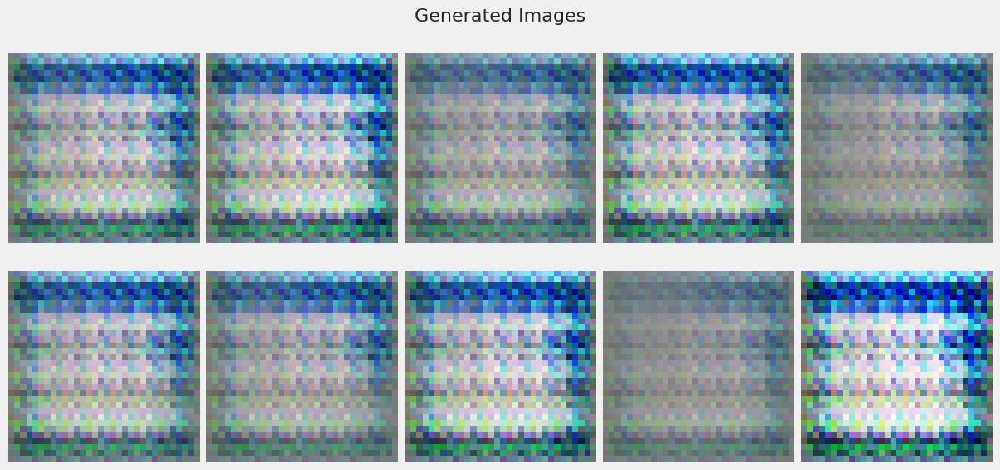

782/782 [==============================] - 12s 14ms/step - d_real_loss: 0.2475 - d_fake_loss: 0.2475 - g_loss: 3.6123 - d_acc: 0.9141 - d_realO: 0.1448 - d_fakeO: 0.8662
Epoch 2/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2325 - d_fake_loss: 0.2325 - g_loss: 3.6747 - d_acc: 0.9181 - d_realO: 0.1295 - d_fakeO: 0.8616
Epoch 3/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.2876 - d_fake_loss: 0.2876 - g_loss: 3.0865 - d_acc: 0.8959 - d_realO: 0.1719 - d_fakeO: 0.8259
Epoch 4/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.2637 - d_fake_loss: 0.2637 - g_loss: 3.0712 - d_acc: 0.8985 - d_realO: 0.1618 - d_fakeO: 0.8397
Epoch 5/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2576 - d_fake_loss: 0.2576 - g_loss: 2.9922 - d_acc: 0.8993 - d_realO: 0.1598 - d_fakeO: 0.8445
Epoch 6/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2637 - d_fake_loss:

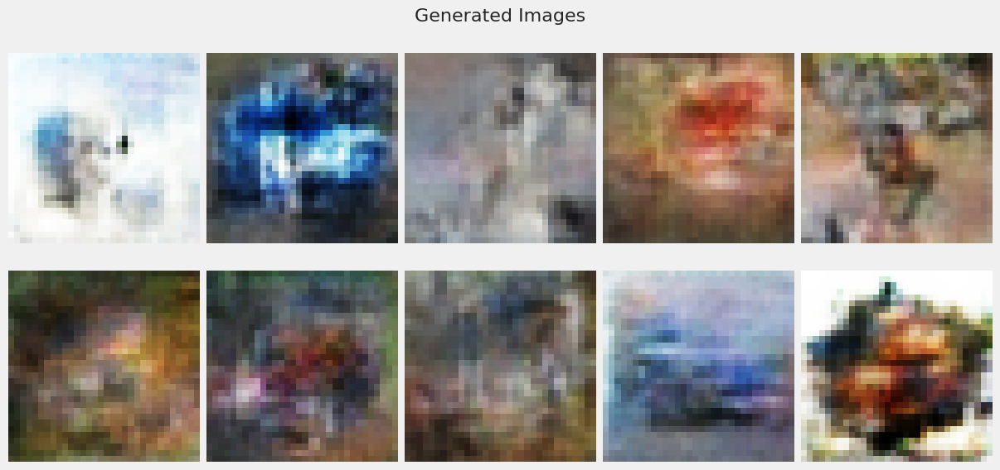

782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.2914 - d_fake_loss: 0.2914 - g_loss: 2.7140 - d_acc: 0.8757 - d_realO: 0.1853 - d_fakeO: 0.8148
Epoch 12/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.3091 - d_fake_loss: 0.3091 - g_loss: 2.6140 - d_acc: 0.8655 - d_realO: 0.1960 - d_fakeO: 0.8039
Epoch 13/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.3139 - d_fake_loss: 0.3139 - g_loss: 2.5555 - d_acc: 0.8620 - d_realO: 0.2018 - d_fakeO: 0.7994
Epoch 14/100
782/782 [==============================] - 12s 15ms/step - d_real_loss: 0.3362 - d_fake_loss: 0.3362 - g_loss: 2.3981 - d_acc: 0.8528 - d_realO: 0.2155 - d_fakeO: 0.7853
Epoch 15/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.3327 - d_fake_loss: 0.3327 - g_loss: 2.3797 - d_acc: 0.8543 - d_realO: 0.2132 - d_fakeO: 0.7876
Epoch 16/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.3264 - d_fake

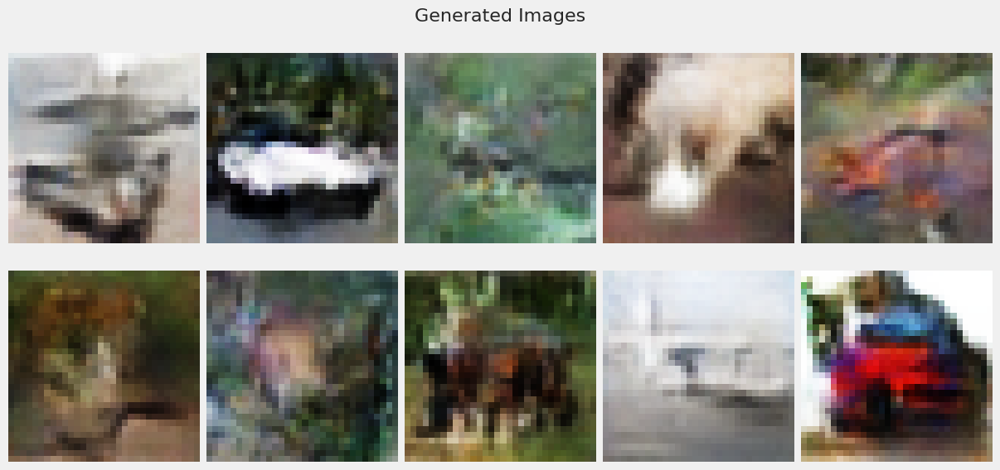

782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.2945 - d_fake_loss: 0.2945 - g_loss: 2.5736 - d_acc: 0.8730 - d_realO: 0.1891 - d_fakeO: 0.8119
Epoch 22/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.3027 - d_fake_loss: 0.3027 - g_loss: 2.5351 - d_acc: 0.8695 - d_realO: 0.1923 - d_fakeO: 0.8088
Epoch 23/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.2869 - d_fake_loss: 0.2869 - g_loss: 2.6644 - d_acc: 0.8762 - d_realO: 0.1826 - d_fakeO: 0.8184
Epoch 24/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.2821 - d_fake_loss: 0.2821 - g_loss: 2.7016 - d_acc: 0.8796 - d_realO: 0.1806 - d_fakeO: 0.8204
Epoch 25/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.2730 - d_fake_loss: 0.2730 - g_loss: 2.7766 - d_acc: 0.8845 - d_realO: 0.1741 - d_fakeO: 0.8266
Epoch 26/100
782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.2674 - d_fake

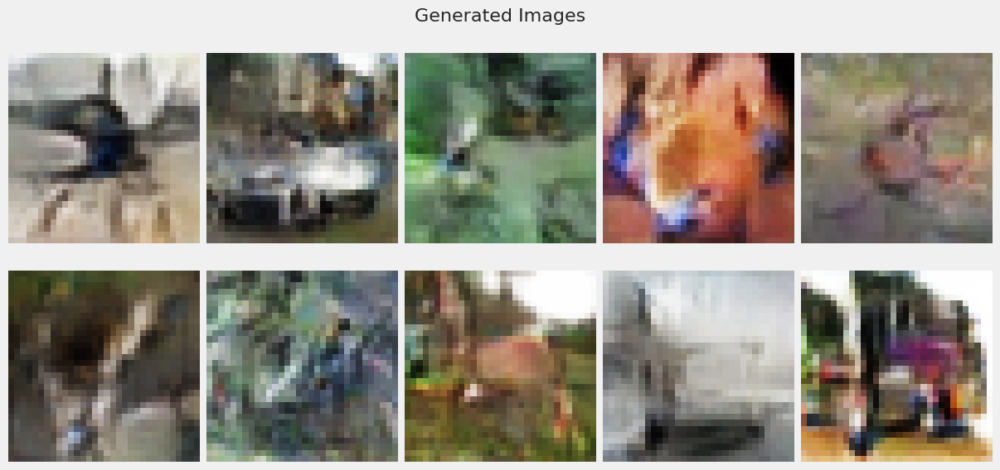

782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2444 - d_fake_loss: 0.2444 - g_loss: 3.1318 - d_acc: 0.8981 - d_realO: 0.1550 - d_fakeO: 0.8458
Epoch 32/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2281 - d_fake_loss: 0.2281 - g_loss: 3.3134 - d_acc: 0.9054 - d_realO: 0.1446 - d_fakeO: 0.8557
Epoch 33/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.2243 - d_fake_loss: 0.2243 - g_loss: 3.4097 - d_acc: 0.9069 - d_realO: 0.1416 - d_fakeO: 0.8590
Epoch 34/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.2298 - d_fake_loss: 0.2298 - g_loss: 3.4086 - d_acc: 0.9033 - d_realO: 0.1443 - d_fakeO: 0.8562
Epoch 35/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.2247 - d_fake_loss: 0.2247 - g_loss: 3.4539 - d_acc: 0.9067 - d_realO: 0.1411 - d_fakeO: 0.8593
Epoch 36/100
782/782 [==============================] - 12s 15ms/step - d_real_loss: 0.2118 - d_fake_

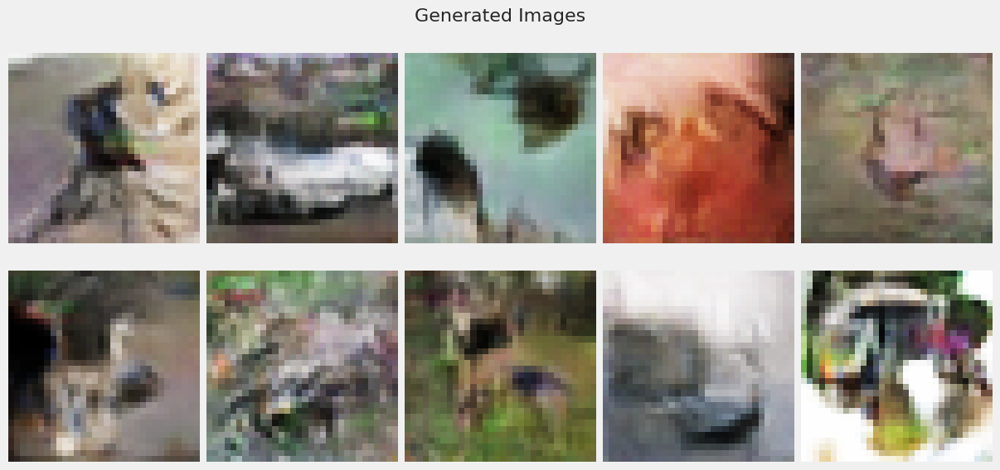

782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.1959 - d_fake_loss: 0.1959 - g_loss: 3.9829 - d_acc: 0.9196 - d_realO: 0.1220 - d_fakeO: 0.8784
Epoch 42/100
782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.1922 - d_fake_loss: 0.1922 - g_loss: 3.9999 - d_acc: 0.9223 - d_realO: 0.1192 - d_fakeO: 0.8813
Epoch 43/100
782/782 [==============================] - 11s 15ms/step - d_real_loss: 0.1845 - d_fake_loss: 0.1845 - g_loss: 4.1413 - d_acc: 0.9257 - d_realO: 0.1152 - d_fakeO: 0.8853
Epoch 44/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.1874 - d_fake_loss: 0.1874 - g_loss: 4.1438 - d_acc: 0.9248 - d_realO: 0.1157 - d_fakeO: 0.8849
Epoch 45/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1795 - d_fake_loss: 0.1795 - g_loss: 4.3019 - d_acc: 0.9286 - d_realO: 0.1114 - d_fakeO: 0.8889
Epoch 46/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1825 - d_fake

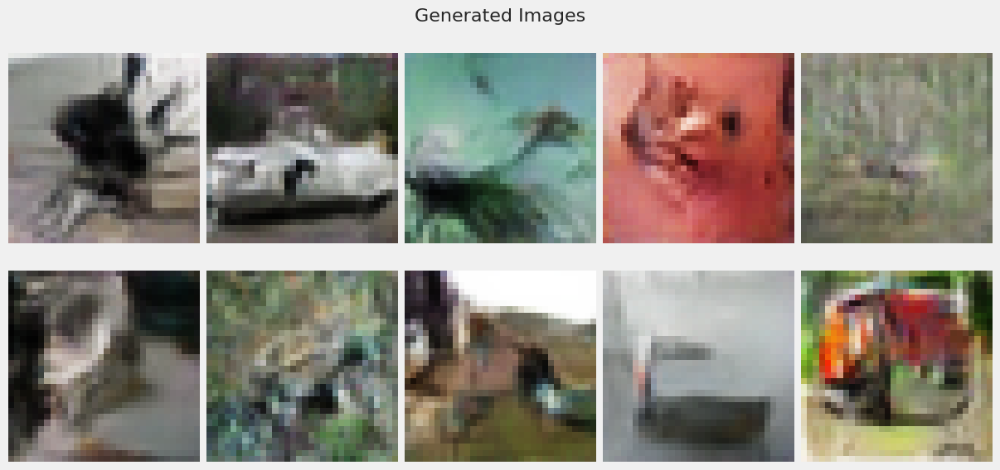

782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.1753 - d_fake_loss: 0.1753 - g_loss: 4.5179 - d_acc: 0.9311 - d_realO: 0.1067 - d_fakeO: 0.8935
Epoch 52/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1690 - d_fake_loss: 0.1690 - g_loss: 4.6368 - d_acc: 0.9338 - d_realO: 0.1037 - d_fakeO: 0.8973
Epoch 53/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1696 - d_fake_loss: 0.1696 - g_loss: 4.6679 - d_acc: 0.9330 - d_realO: 0.1033 - d_fakeO: 0.8969
Epoch 54/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1672 - d_fake_loss: 0.1672 - g_loss: 4.6534 - d_acc: 0.9345 - d_realO: 0.1023 - d_fakeO: 0.8986
Epoch 55/100
782/782 [==============================] - 9s 12ms/step - d_real_loss: 0.1651 - d_fake_loss: 0.1651 - g_loss: 4.7718 - d_acc: 0.9347 - d_realO: 0.1005 - d_fakeO: 0.8997
Epoch 56/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1636 - d_fake_lo

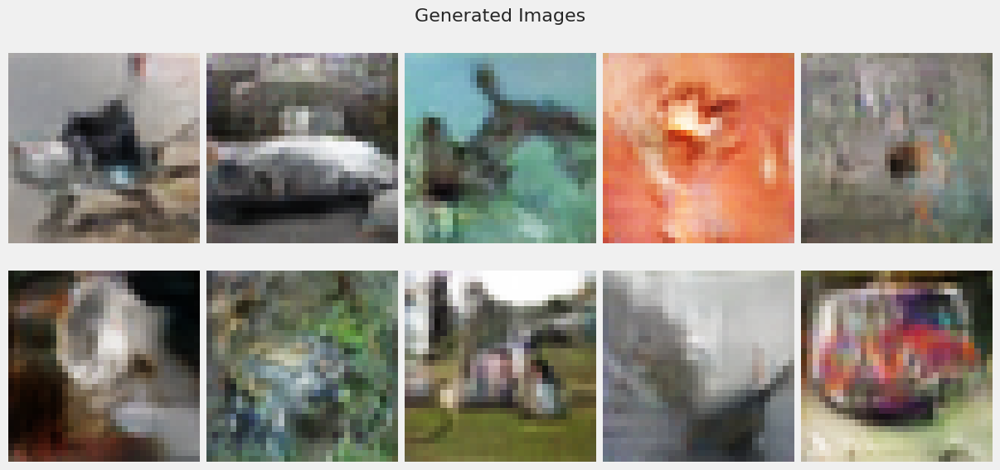

782/782 [==============================] - 10s 12ms/step - d_real_loss: 0.1556 - d_fake_loss: 0.1556 - g_loss: 5.0606 - d_acc: 0.9391 - d_realO: 0.0943 - d_fakeO: 0.9066
Epoch 62/100
782/782 [==============================] - 11s 14ms/step - d_real_loss: 0.1479 - d_fake_loss: 0.1479 - g_loss: 5.1737 - d_acc: 0.9425 - d_realO: 0.0900 - d_fakeO: 0.9104
Epoch 63/100
782/782 [==============================] - 10s 13ms/step - d_real_loss: 0.1476 - d_fake_loss: 0.1476 - g_loss: 5.2111 - d_acc: 0.9430 - d_realO: 0.0886 - d_fakeO: 0.9117
Epoch 64/100
782/782 [==============================] - 11s 15ms/step - d_real_loss: 0.1462 - d_fake_loss: 0.1462 - g_loss: 5.3084 - d_acc: 0.9428 - d_realO: 0.0878 - d_fakeO: 0.9126
Epoch 65/100
782/782 [==============================] - 9s 11ms/step - d_real_loss: 0.1433 - d_fake_loss: 0.1433 - g_loss: 5.2532 - d_acc: 0.9444 - d_realO: 0.0865 - d_fakeO: 0.9140
Epoch 66/100
782/782 [==============================] - 8s 11ms/step - d_real_loss: 0.1373 - d_fake

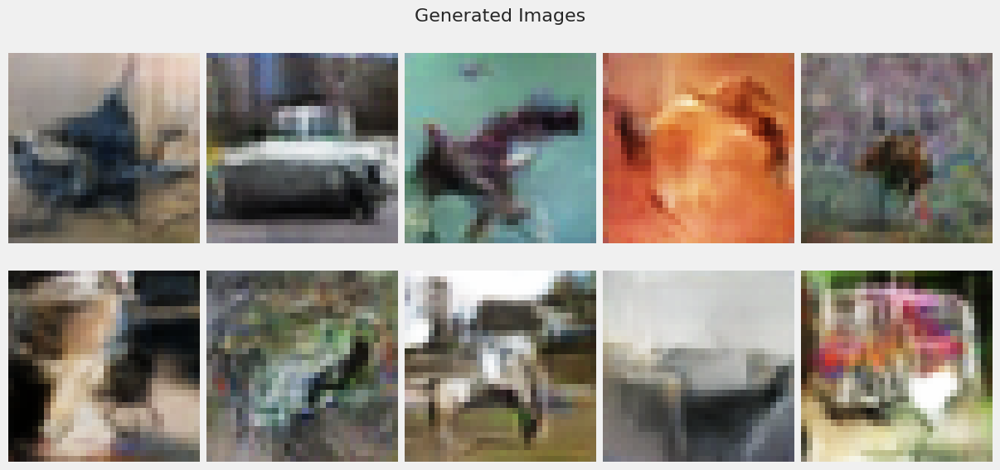

782/782 [==============================] - 12s 16ms/step - d_real_loss: 0.1352 - d_fake_loss: 0.1352 - g_loss: 5.5746 - d_acc: 0.9473 - d_realO: 0.0811 - d_fakeO: 0.9193
Epoch 72/100
782/782 [==============================] - 16s 20ms/step - d_real_loss: 0.1378 - d_fake_loss: 0.1378 - g_loss: 5.6678 - d_acc: 0.9470 - d_realO: 0.0815 - d_fakeO: 0.9186
Epoch 73/100
782/782 [==============================] - 13s 17ms/step - d_real_loss: 0.1347 - d_fake_loss: 0.1347 - g_loss: 5.7039 - d_acc: 0.9482 - d_realO: 0.0801 - d_fakeO: 0.9206
Epoch 74/100
782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.1343 - d_fake_loss: 0.1343 - g_loss: 5.6828 - d_acc: 0.9491 - d_realO: 0.0795 - d_fakeO: 0.9209
Epoch 75/100
782/782 [==============================] - 5s 6ms/step - d_real_loss: 0.1286 - d_fake_loss: 0.1286 - g_loss: 5.8516 - d_acc: 0.9506 - d_realO: 0.0764 - d_fakeO: 0.9241
Epoch 76/100
782/782 [==============================] - 5s 7ms/step - d_real_loss: 0.1283 - d_fake_los

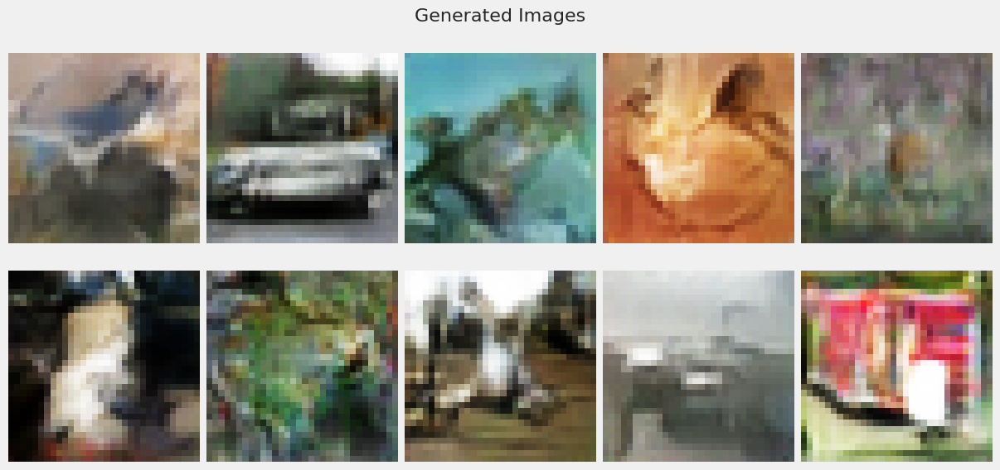

782/782 [==============================] - 7s 9ms/step - d_real_loss: 0.1226 - d_fake_loss: 0.1226 - g_loss: 5.9692 - d_acc: 0.9531 - d_realO: 0.0730 - d_fakeO: 0.9273
Epoch 82/100
782/782 [==============================] - 6s 8ms/step - d_real_loss: 0.1242 - d_fake_loss: 0.1242 - g_loss: 6.0765 - d_acc: 0.9518 - d_realO: 0.0733 - d_fakeO: 0.9274
Epoch 83/100
782/782 [==============================] - 6s 8ms/step - d_real_loss: 0.1220 - d_fake_loss: 0.1220 - g_loss: 6.1230 - d_acc: 0.9534 - d_realO: 0.0721 - d_fakeO: 0.9284
Epoch 84/100
782/782 [==============================] - 7s 8ms/step - d_real_loss: 0.1200 - d_fake_loss: 0.1200 - g_loss: 6.0976 - d_acc: 0.9541 - d_realO: 0.0714 - d_fakeO: 0.9296
Epoch 85/100
782/782 [==============================] - 7s 8ms/step - d_real_loss: 0.1249 - d_fake_loss: 0.1249 - g_loss: 6.1704 - d_acc: 0.9522 - d_realO: 0.0729 - d_fakeO: 0.9279
Epoch 86/100
782/782 [==============================] - 7s 9ms/step - d_real_loss: 0.1223 - d_fake_loss: 0.1

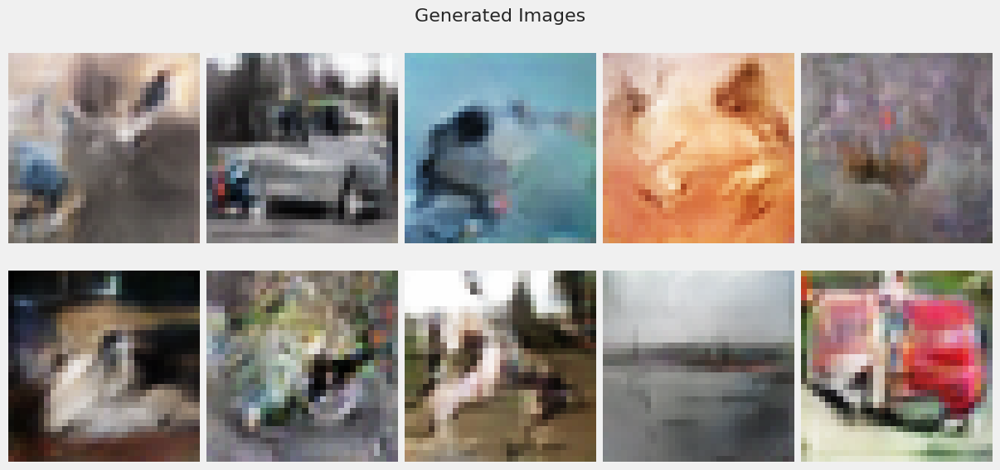

782/782 [==============================] - 8s 10ms/step - d_real_loss: 0.1197 - d_fake_loss: 0.1197 - g_loss: 6.2871 - d_acc: 0.9542 - d_realO: 0.0701 - d_fakeO: 0.9304
Epoch 92/100
782/782 [==============================] - 7s 9ms/step - d_real_loss: 0.1150 - d_fake_loss: 0.1150 - g_loss: 6.3209 - d_acc: 0.9566 - d_realO: 0.0671 - d_fakeO: 0.9333
Epoch 93/100
782/782 [==============================] - 7s 9ms/step - d_real_loss: 0.1203 - d_fake_loss: 0.1203 - g_loss: 6.3252 - d_acc: 0.9547 - d_realO: 0.0697 - d_fakeO: 0.9311
Epoch 94/100
782/782 [==============================] - 7s 9ms/step - d_real_loss: 0.1155 - d_fake_loss: 0.1155 - g_loss: 6.3375 - d_acc: 0.9564 - d_realO: 0.0673 - d_fakeO: 0.9329
Epoch 95/100
782/782 [==============================] - 6s 8ms/step - d_real_loss: 0.1139 - d_fake_loss: 0.1139 - g_loss: 6.3656 - d_acc: 0.9566 - d_realO: 0.0668 - d_fakeO: 0.9339
Epoch 96/100
782/782 [==============================] - 6s 8ms/step - d_real_loss: 0.1121 - d_fake_loss: 0.

In [54]:
gan_3 = train_gan(discriminator_cgan3, generator_cgan3, noise, 'Baseline CGAN 3', dataset, callbacks=callbacks)

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- Looking at the accuracy, we can see that the discriminator ended with a  95 which shows that it is good at determine
- No model collapse


</div>

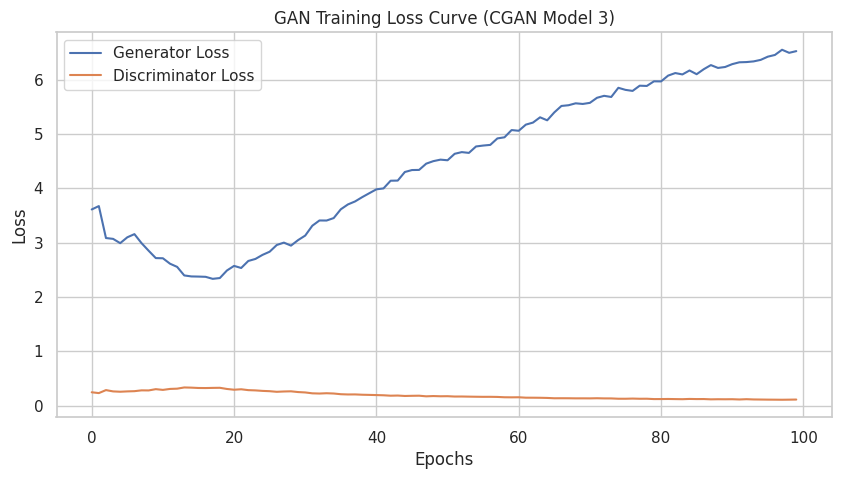

In [55]:
gan_history = gan_3[0].history
generator = gan_3[1].generator  
gan_history['d_loss'] = [(real_loss + fake_loss) / 2 for real_loss, fake_loss in zip(gan_history['d_real_loss'], gan_history['d_fake_loss'])]
evaluator = Evaluation(generator, latent_dim, 512, 10000, 1024)
evaluator.plot_loss_curve(gan_history, title='GAN Training Loss Curve (CGAN Model 3)')

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- Discriminator loss
    - For the discriminator loss, it starts relatively low and rises quickly and continues to increase steadily as the epochs increases
- Generator loss
    - For the generator loss, it increases with a spike and drops and proceeded to increase slowly


</div>

In [56]:
tf.keras.backend.clear_session()
K.clear_session()
scores1 = evaluator.compute_metrics(x_train, cgan=True)
print('FID Score:', scores1[0])
print('KID Score:', scores1[1])

[0 0 0 ... 9 9 9]
313/313 [==============================] - 1s 1ms/step
FID Score: 36.42854125848132
KID Score: 0.01870685997412158


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>

- FID Score of 36 
- KID Score is 0.018
    
It improved further compared to the previous two models

</div>

#### Storing the scores

In [57]:
new_row = {'Model':'Baseline CGAN 3', 'FID':scores1[0], 'KID': scores1[1], 'd_loss':gan_history['d_loss'][-1], 'g_loss':gan_history['g_loss'][-1] }
new_df = pd.DataFrame([new_row])
full_scores = pd.concat([full_scores, new_df], ignore_index=True)
full_scores

,Model,FID,KID,d_loss,g_loss
0,Baseline CGAN 1,36.450094,0.020338,0.110001,6.623448
1,Baseline CGAN 2,38.609907,0.023634,0.108867,6.457820
2,Baseline CGAN 3,36.428541,0.018707,0.113654,6.526493


### Store All Results

### __Best DCGAN Model__

1. Best Model is the CGAN 1 of FID 36 by looking across all categories

In [59]:
full_scores.to_csv('full_scores2.csv')